In [1]:
import datasets
import neural_net  # necessary to not break import training (circular import)
import training
import argparse
from torch import nn
import numpy as np
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader
%load_ext autoreload
%autoreload 2

# Parser

In [2]:
parser = argparse.ArgumentParser()
parser.add_argument('dataset', type=str)
parser.add_argument('file_base', type=str)
parser.add_argument('--dataset_shift', type=bool, default=False)
parser.add_argument('--adversarial', type=bool, default=False)
parser.add_argument('--output_dir', type=str, default='.')
parser.add_argument('--label_col', default='label', type=str)

parser.add_argument('--linear', type=bool, default=False)

parser.add_argument('--lr', type=float, default=0.2)
parser.add_argument('--lr_decay', type=float, default=0.8)
parser.add_argument('--epochs', type=int, default=20)
parser.add_argument('--batch_size', type=int, default=128)
parser.add_argument('--activation', type=str, default='relu')
parser.add_argument('--nodes_per_layer', type=int, default=50)
parser.add_argument('--num_layers', type=int, default=5)
parser.add_argument('--optimizer', type=str, default=None)
parser.add_argument('--loss', type=str, default=None)
parser.add_argument('--fixed_seed', type=bool, default=False) # if true, use seed 0 for all random states

parser.add_argument('--target_indices', type=str, default='') # if only changing a subset of data, what criteria to use
parser.add_argument('--target_vals', type=str, default='')
parser.add_argument('--indices_to_change', type=str, default='') # what indices to change?
parser.add_argument('--new_vals', type=str, default='') # what can we change modified values to?
parser.add_argument('--threshold', type=float, default = 0.0)
parser.add_argument('--strategy', type=str, default='random')
parser.add_argument('--epsilon', type=float, default=0.5) # epsilon for finding adv. examples
parser.add_argument('--dropout', type=float, default=0.0) # dropout rate

_StoreAction(option_strings=['--dropout'], dest='dropout', nargs=None, const=None, default=0.0, type=<class 'float'>, choices=None, required=False, help=None, metavar=None)

In [3]:
dname = 'heloc'

In [6]:
args = parser.parse_args(args=[dname, 'data/' + dname, '--epochs', '20',
                               '--lr', '0.2', '--output_dir',
                               'models/heloc_mac'])

In [7]:
args

Namespace(activation='relu', adversarial=False, batch_size=128, dataset='heloc', dataset_shift=False, dropout=0.0, epochs=20, epsilon=0.5, file_base='data/heloc', fixed_seed=False, indices_to_change='', label_col='label', linear=False, loss=None, lr=0.2, lr_decay=0.8, new_vals='', nodes_per_layer=50, num_layers=5, optimizer=None, output_dir='models/heloc_mac', strategy='random', target_indices='', target_vals='', threshold=0.0)

In [8]:
if args.target_indices == '':
    args.target_indices = []
    args.target_vals = []
else:
    args.target_indices = list(map(int, args.target_indices.split("_")))
    args.target_vals = list(map(float, args.target_vals.split("_")))
if args.indices_to_change == '':
    args.indices_to_change = []
    args.new_vals = []
else:    
    args.indices_to_change = list(map(int, args.indices_to_change.split("_")))
    args.new_vals = list(map(float, args.new_vals.split("_")))

In [9]:
assert len(args.target_indices) == len(args.target_vals), 'target_indices and target_vals must be the same length'
assert len(args.indices_to_change) == len(args.new_vals), 'indices_to_change and new_vals must be the same length'

In [10]:
strategies = ['random', 'targeted', 'untargeted', 'targeted-random', 'none']
args.strategy = args.strategy.strip()
assert args.strategy in strategies, 'strategy must be in [' + ' '.join(strategies) + '] but is ' + args.strategy

In [11]:
if args.dataset in ['mnist']: 
    args.loss = nn.MSELoss() 
else:
    args.loss = nn.CrossEntropyLoss()         

if args.activation is not None:
    if args.activation == 'leak':
        args.activation = nn.LeakyReLU()
    elif args.activation == 'soft':
        args.activation = nn.Softplus(beta=5)
    else:
        args.activation = nn.ReLU()
else:
    args.activation = nn.ReLU()

In [12]:
# if we are testing dataset shift (rather than random perturbation), 
# call the remaining code 2x, once on original data and once on shifted data
# if args.dataset_shift:
#     args.dataset = args.dataset + '_orig'
#     args.file_base = args.file_base + '_orig'
#     main(args)
#     args.dataset = args.dataset[:-5] + "_shift"
#     args.file_base = args.file_base[:-5] + "_shift"
#     main(args)
# else:
#     main(args)

# main()

In [13]:
args.fixed_seed = False
noisy_test = False
args.threshold, args.fixed_seed, args.output_dir, noisy_test

(0.0, False, 'models/heloc_mac', False)

In [14]:
perturb_params = datasets.PerturbParams(args.strategy, 0,
                                        args.target_indices, args.target_vals,
                                        args.indices_to_change, args.new_vals)

In [15]:
ground_train, ground_test = datasets.load_data(args.file_base, args.dataset,
                                               None, None, 0, perturb_params)
n_tr, d = ground_train.data.shape
n_te, d = ground_test.data.shape
n = n_tr + n_te
n_tr, n_te, n, d

(7896, 1975, 9871, 23)

In [16]:
n_r = 100
random_states = [r for r in range(n_r)]
thresholds = [0, 0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5]

In [17]:
suffix = '_fixed_seed'
if type(args.activation) == type(nn.ReLU()):
    act = "relu"
elif type(args.activation) == type(nn.Softplus(beta=5)):
    act = "soft"
else:
    act = "leak"
act

'relu'

In [18]:
np.save(args.output_dir + "/args_" + args.dataset + "_nn" + str(args.num_layers) + "_"+ act + ".npy", args)

In [19]:
epochs = [1, 5, 10, 20, 30, 40, 50]
n_e = len(epochs)

In [20]:
args.epochs

20

In [21]:
args.lr

0.2

Threshold 0, Model 0
Training with Seed 0


100%|███████████████████████████████████████████| 20/20 [00:04<00:00,  4.47it/s]


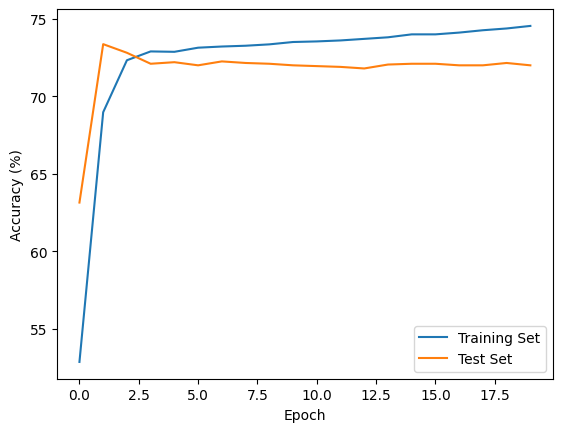

IndexError: index 29 is out of bounds for axis 0 with size 20

In [46]:
for threshold in thresholds:
    test_accuracy, train_accuracy = np.zeros((n_e, n_r)), np.zeros((n_e, n_r))
    preds = np.zeros((n_e, n_r, n))
    logits = np.zeros((n_e, n_r, n, 2))
    gradients = np.zeros((n_e, n_r, n, d))
    args.threshold = threshold
    perturb_params = datasets.PerturbParams(args.strategy, args.threshold,
                                            args.target_indices, args.target_vals,
                                            args.indices_to_change, args.new_vals)
    for i, r in enumerate(random_states):
        if args.fixed_seed:
            seed = 0
        else:
            seed = r
        scaler, scaler_labels = None, None

        # Perturbs data with seed r
        train, test = datasets.load_data(args.file_base, args.dataset, scaler,
                                         scaler_labels, r, perturb_params, noisy_test=noisy_test)
        
        num_feat, num_classes = train.num_features(), train.num_classes()
        params = training.Params(args.lr, args.lr_decay, args.epochs, args.batch_size, loss_fn=args.loss, num_feat=num_feat, 
                        num_classes=num_classes, activation=args.activation, nodes_per_layer=args.nodes_per_layer,
                        num_layers=args.num_layers, optimizer=args.optimizer, seed=seed, epsilon = args.epsilon, dropout=args.dropout)
        
        print("Threshold {}, Model {}".format(threshold, i))
        secondary_dataset = None
        if args.adversarial:
            model, test_acc, train_acc, pred, log, grad\
            = training.train_adv_nn(params, train, test, r, args.dataset, args.threshold,
                                    plot=True, print_terms=False, checkpoints=epochs)
        else:
            model, test_acc, train_acc, pred, log, grad\
            = training.train_nn(params, train, test, r, args.dataset,
                                    args.output_dir, args.threshold, secondary_dataset,
                                    plot=True, print_terms=False, checkpoints=epochs)
        preds[:, i], logits[:, i], gradients[:, i] = pred, log, grad
        test_accuracy[:, i], train_accuracy[:, i] = test_acc[np.array(epochs)-1], train_acc[np.array(epochs)-1]
    np.save(args.output_dir + "/accuracy_" + args.dataset + str(args.threshold) + "_nn"
        + str(args.num_layers) + "_"+ act + ".npy", np.array([test_accuracy, train_accuracy]))
    start_str = args.output_dir + "/" + args.dataset + str(args.threshold) + "_nn" + str(args.num_layers) + "_" + act +  "_" 
    np.save(start_str + 'preds.npy', preds)
    np.save(start_str + 'logits.npy', logits)
    np.save(start_str + 'gradients.npy', gradients)

Threshold 0, Model 0
Training with Seed 0


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.94it/s]


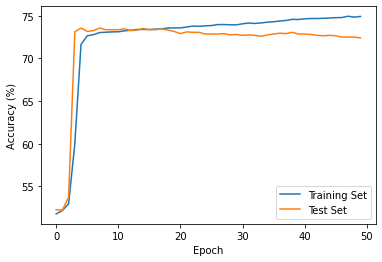

Threshold 0, Model 1
Training with Seed 1


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.96it/s]


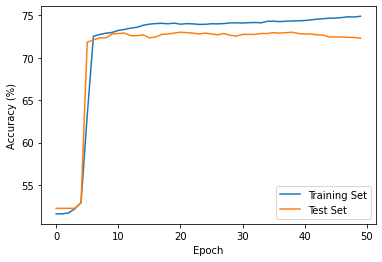

Threshold 0, Model 2
Training with Seed 2


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.98it/s]


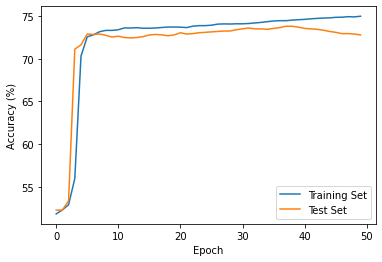

Threshold 0, Model 3
Training with Seed 3


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.81it/s]


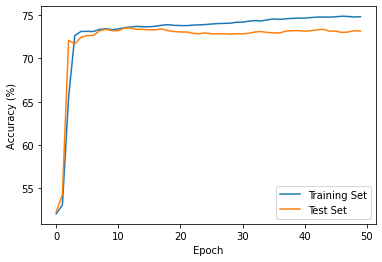

Threshold 0, Model 4
Training with Seed 4


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.95it/s]


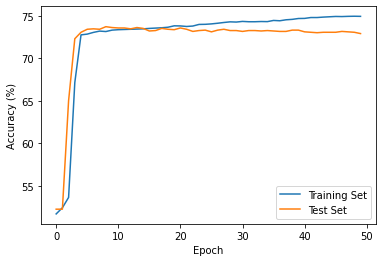

Threshold 0, Model 5
Training with Seed 5


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.00it/s]


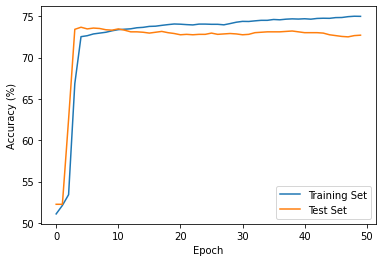

Threshold 0, Model 6
Training with Seed 6


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.95it/s]


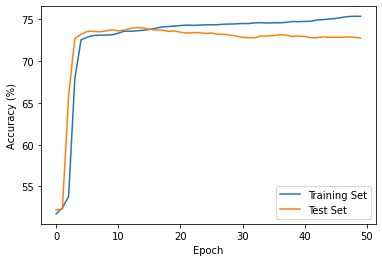

Threshold 0, Model 7
Training with Seed 7


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.96it/s]


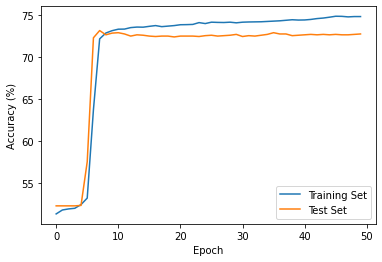

Threshold 0, Model 8
Training with Seed 8


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.95it/s]


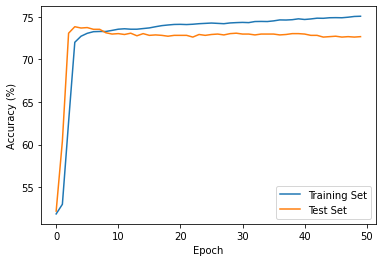

Threshold 0, Model 9
Training with Seed 9


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.85it/s]


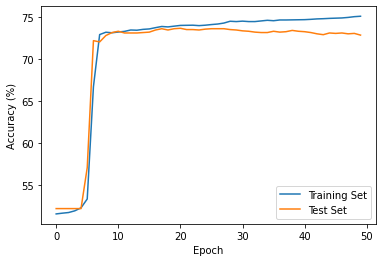

Threshold 0, Model 10
Training with Seed 10


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.01it/s]


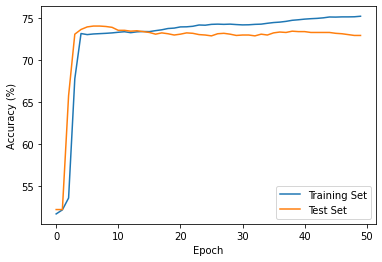

Threshold 0, Model 11
Training with Seed 11


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.04it/s]


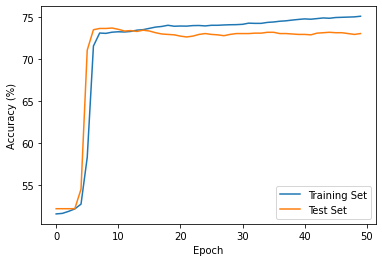

Threshold 0, Model 12
Training with Seed 12


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.05it/s]


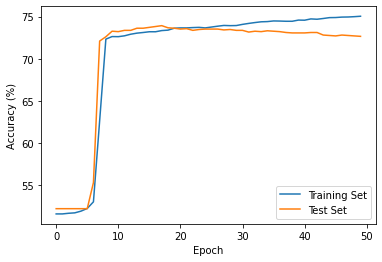

Threshold 0, Model 13
Training with Seed 13


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.02it/s]


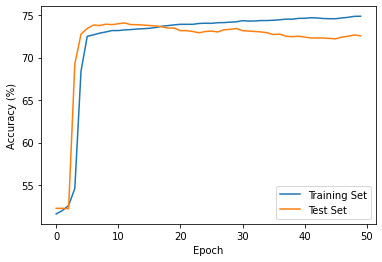

Threshold 0, Model 14
Training with Seed 14


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.02it/s]


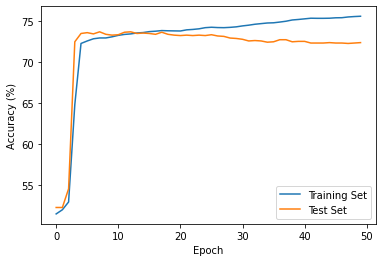

Threshold 0, Model 15
Training with Seed 15


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.00it/s]


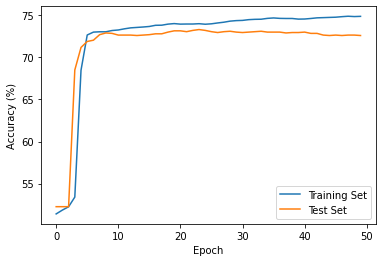

Threshold 0, Model 16
Training with Seed 16


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.99it/s]


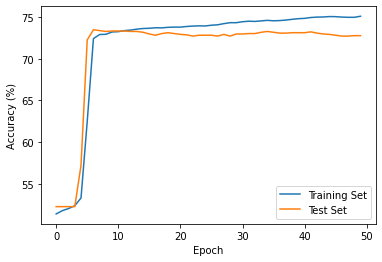

Threshold 0, Model 17
Training with Seed 17


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.75it/s]


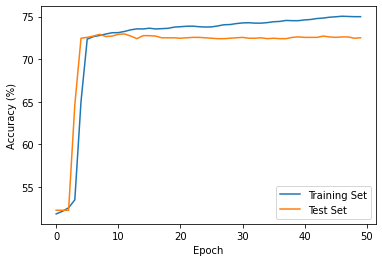

Threshold 0, Model 18
Training with Seed 18


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.98it/s]


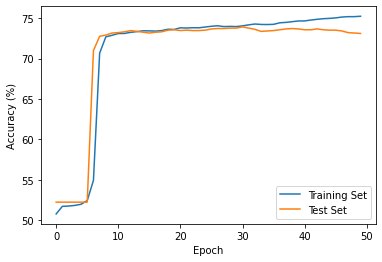

Threshold 0, Model 19
Training with Seed 19


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.00it/s]


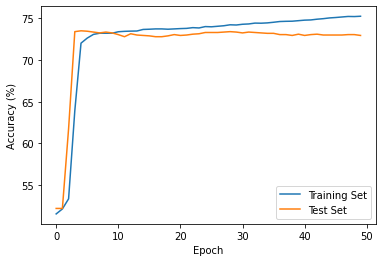

Threshold 0, Model 20
Training with Seed 20


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.00it/s]


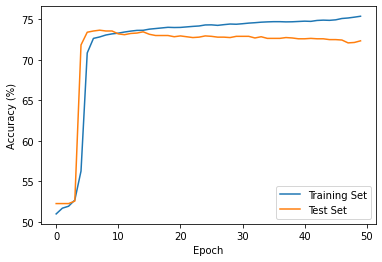

Threshold 0, Model 21
Training with Seed 21


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.00it/s]


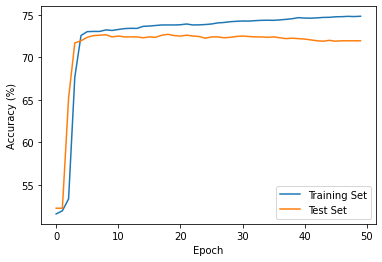

Threshold 0, Model 22
Training with Seed 22


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.03it/s]


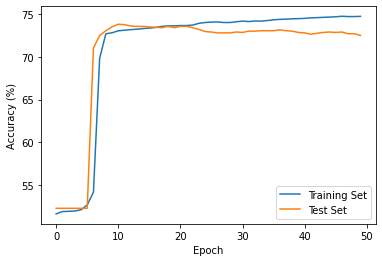

Threshold 0, Model 23
Training with Seed 23


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.09it/s]


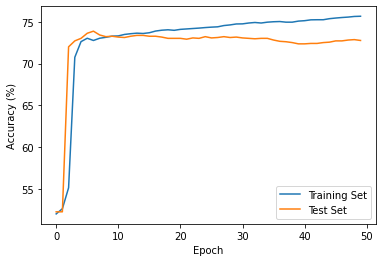

Threshold 0, Model 24
Training with Seed 24


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.05it/s]


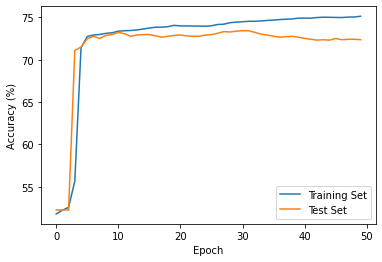

Threshold 0, Model 25
Training with Seed 25


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.98it/s]


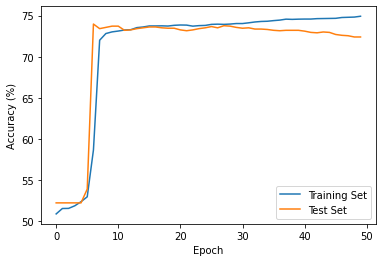

Threshold 0, Model 26
Training with Seed 26


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.82it/s]


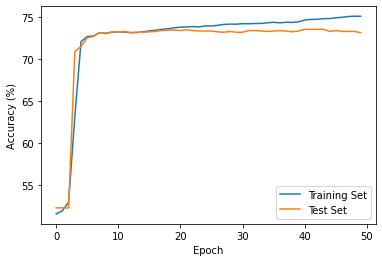

Threshold 0, Model 27
Training with Seed 27


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.79it/s]


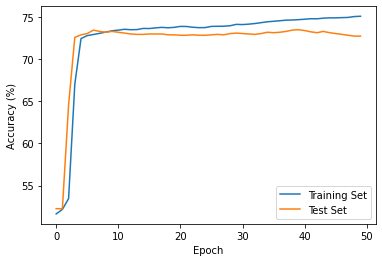

Threshold 0, Model 28
Training with Seed 28


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.74it/s]


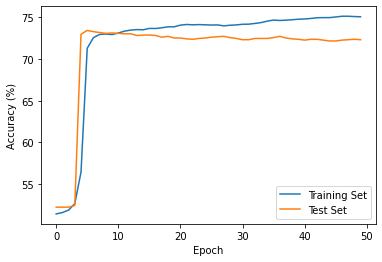

Threshold 0, Model 29
Training with Seed 29


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.86it/s]


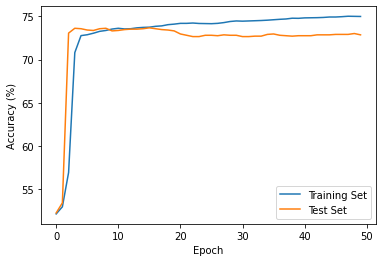

Threshold 0, Model 30
Training with Seed 30


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.76it/s]


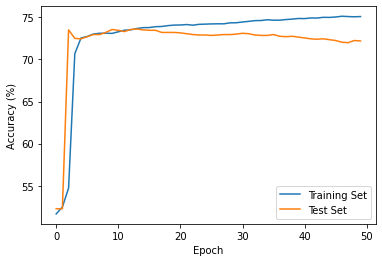

Threshold 0, Model 31
Training with Seed 31


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.81it/s]


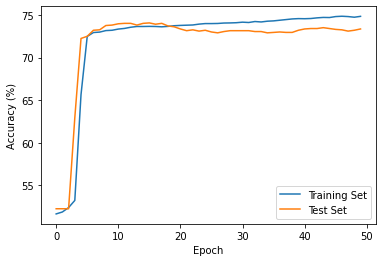

Threshold 0, Model 32
Training with Seed 32


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.97it/s]


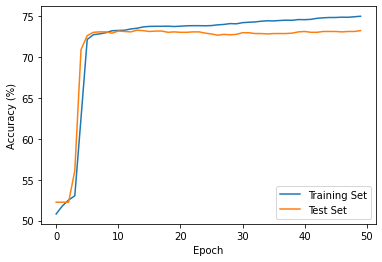

Threshold 0, Model 33
Training with Seed 33


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.02it/s]


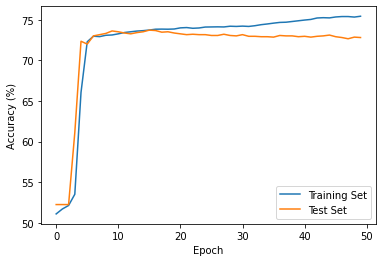

Threshold 0, Model 34
Training with Seed 34


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.07it/s]


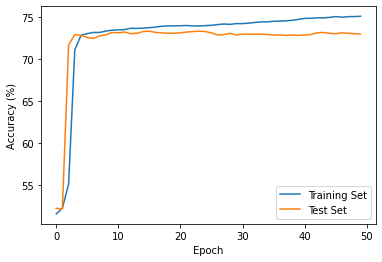

Threshold 0, Model 35
Training with Seed 35


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.06it/s]


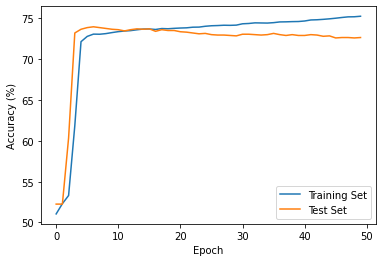

Threshold 0, Model 36
Training with Seed 36


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.05it/s]


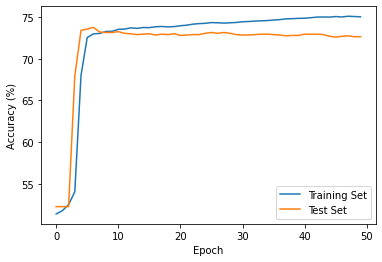

Threshold 0, Model 37
Training with Seed 37


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.97it/s]


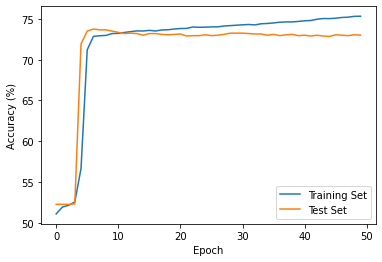

Threshold 0, Model 38
Training with Seed 38


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.80it/s]


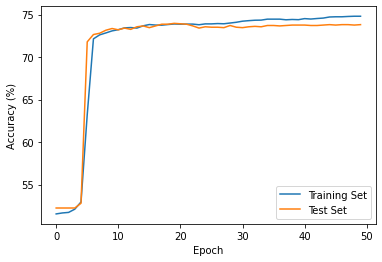

Threshold 0, Model 39
Training with Seed 39


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.98it/s]


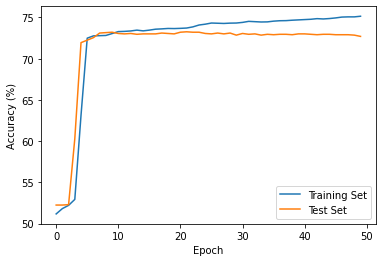

Threshold 0, Model 40
Training with Seed 40


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.05it/s]


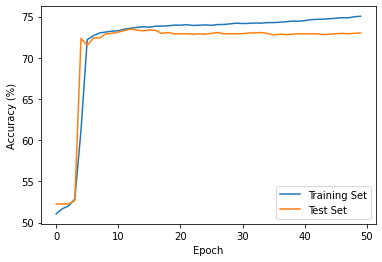

Threshold 0, Model 41
Training with Seed 41


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.02it/s]


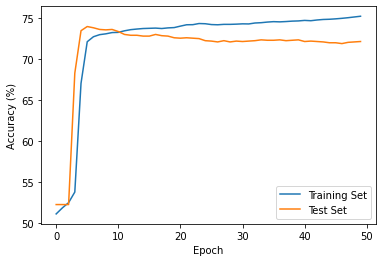

Threshold 0, Model 42
Training with Seed 42


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.93it/s]


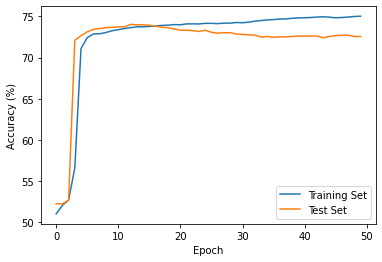

Threshold 0, Model 43
Training with Seed 43


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.73it/s]


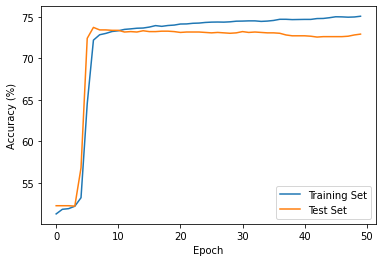

Threshold 0, Model 44
Training with Seed 44


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.77it/s]


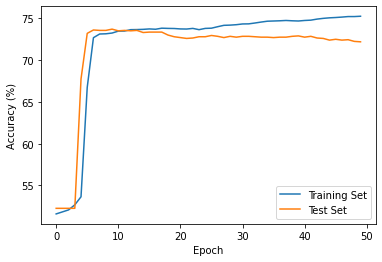

Threshold 0, Model 45
Training with Seed 45


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.82it/s]


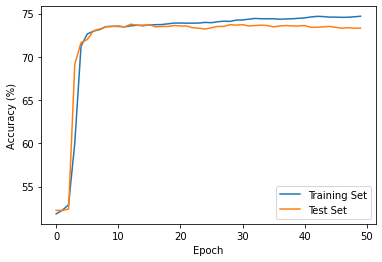

Threshold 0, Model 46
Training with Seed 46


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.72it/s]


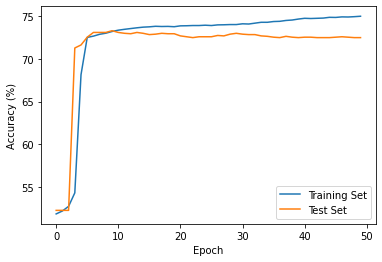

Threshold 0, Model 47
Training with Seed 47


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.77it/s]


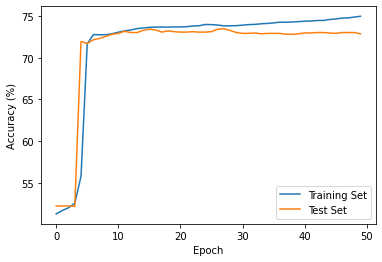

Threshold 0, Model 48
Training with Seed 48


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.71it/s]


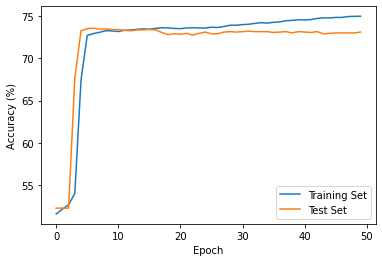

Threshold 0, Model 49
Training with Seed 49


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.01it/s]


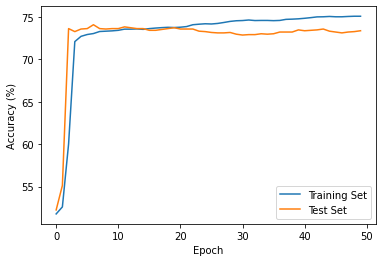

Threshold 0, Model 50
Training with Seed 50


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.02it/s]


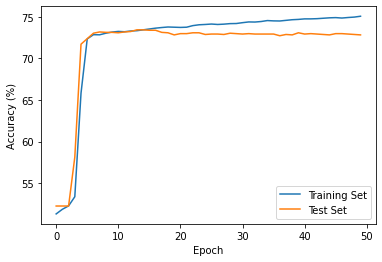

Threshold 0, Model 51
Training with Seed 51


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.01it/s]


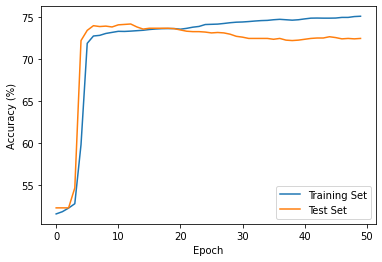

Threshold 0, Model 52
Training with Seed 52


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.72it/s]


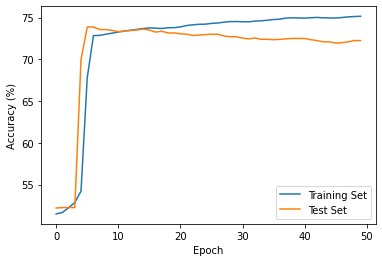

Threshold 0, Model 53
Training with Seed 53


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.87it/s]


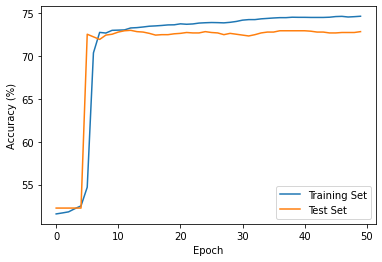

Threshold 0, Model 54
Training with Seed 54


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.88it/s]


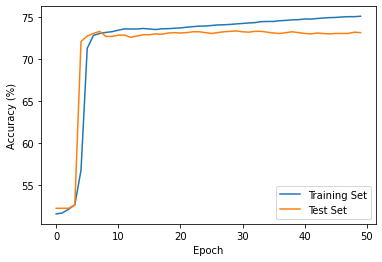

Threshold 0, Model 55
Training with Seed 55


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.69it/s]


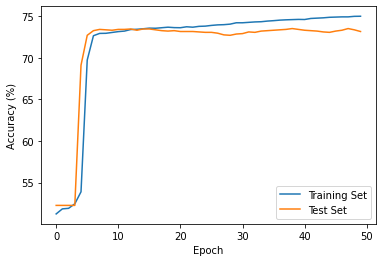

Threshold 0, Model 56
Training with Seed 56


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.78it/s]


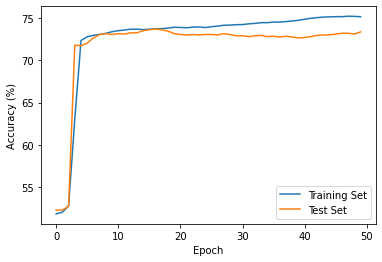

Threshold 0, Model 57
Training with Seed 57


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.76it/s]


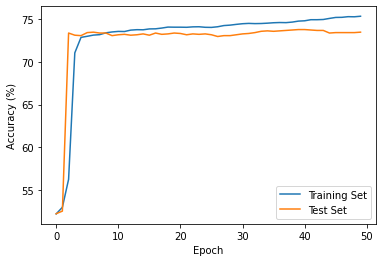

Threshold 0, Model 58
Training with Seed 58


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.83it/s]


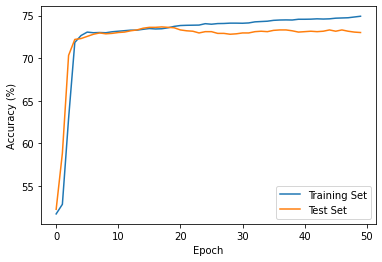

Threshold 0, Model 59
Training with Seed 59


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.01it/s]


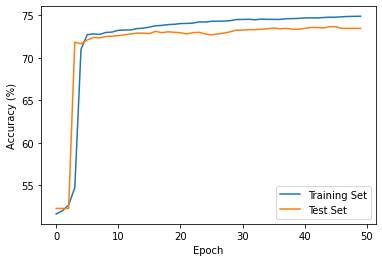

Threshold 0, Model 60
Training with Seed 60


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.09it/s]


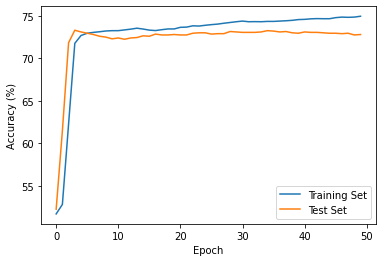

Threshold 0, Model 61
Training with Seed 61


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.05it/s]


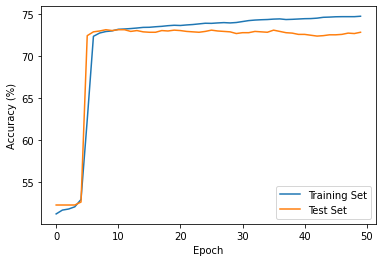

Threshold 0, Model 62
Training with Seed 62


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.83it/s]


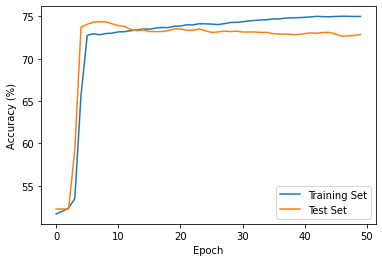

Threshold 0, Model 63
Training with Seed 63


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.04it/s]


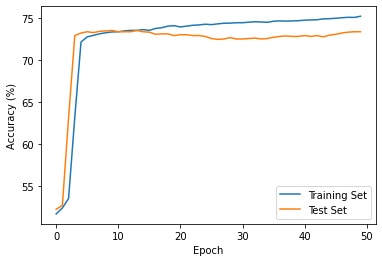

Threshold 0, Model 64
Training with Seed 64


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.05it/s]


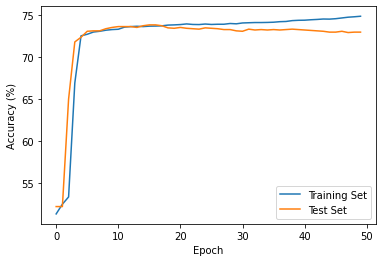

Threshold 0, Model 65
Training with Seed 65


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.08it/s]


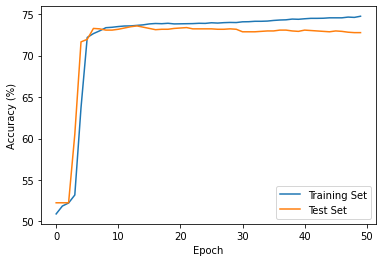

Threshold 0, Model 66
Training with Seed 66


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.05it/s]


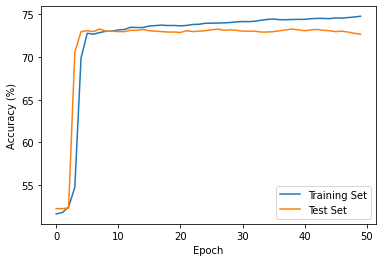

Threshold 0, Model 67
Training with Seed 67


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.06it/s]


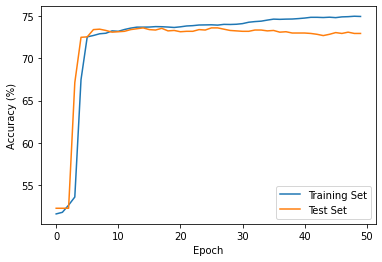

Threshold 0, Model 68
Training with Seed 68


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.10it/s]


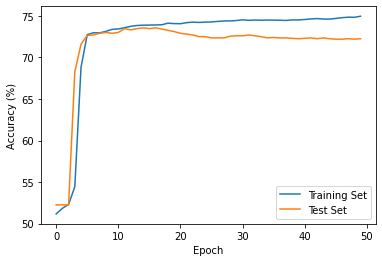

Threshold 0, Model 69
Training with Seed 69


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.08it/s]


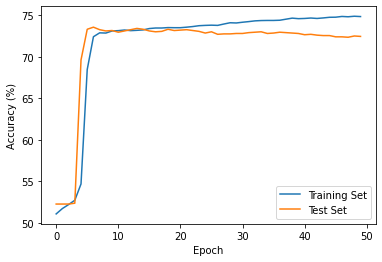

Threshold 0, Model 70
Training with Seed 70


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.97it/s]


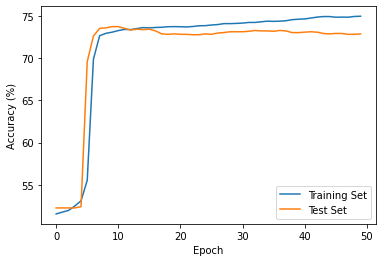

Threshold 0, Model 71
Training with Seed 71


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.99it/s]


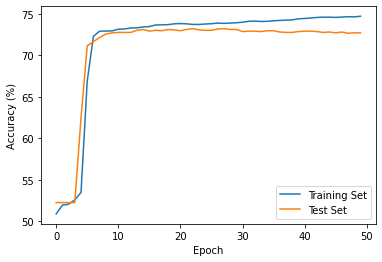

Threshold 0, Model 72
Training with Seed 72


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.99it/s]


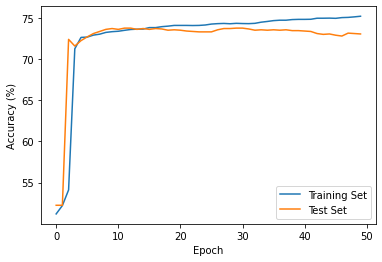

Threshold 0, Model 73
Training with Seed 73


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.79it/s]


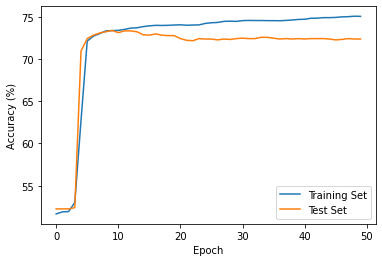

Threshold 0, Model 74
Training with Seed 74


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.75it/s]


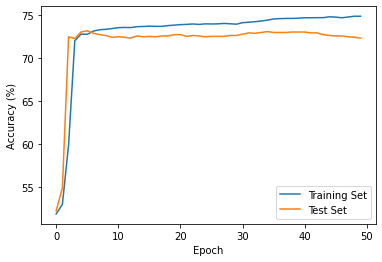

Threshold 0, Model 75
Training with Seed 75


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.87it/s]


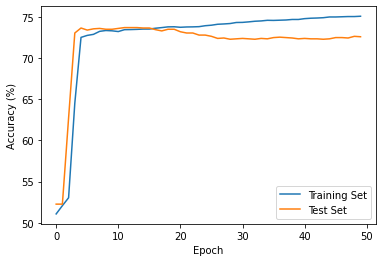

Threshold 0, Model 76
Training with Seed 76


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.94it/s]


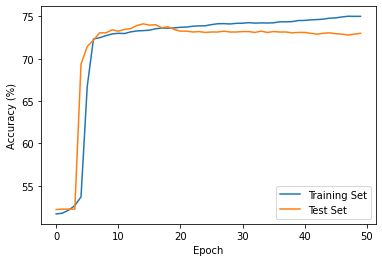

Threshold 0, Model 77
Training with Seed 77


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.76it/s]


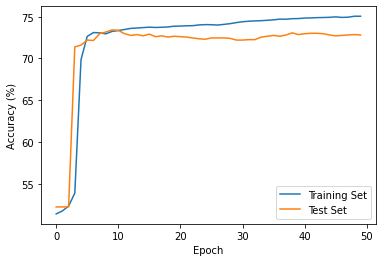

Threshold 0, Model 78
Training with Seed 78


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.72it/s]


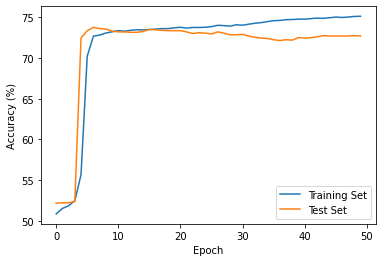

Threshold 0, Model 79
Training with Seed 79


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.03it/s]


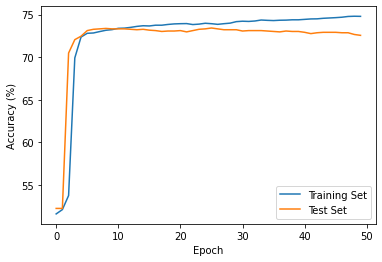

Threshold 0, Model 80
Training with Seed 80


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.88it/s]


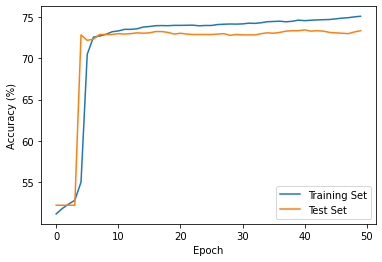

Threshold 0, Model 81
Training with Seed 81


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.94it/s]


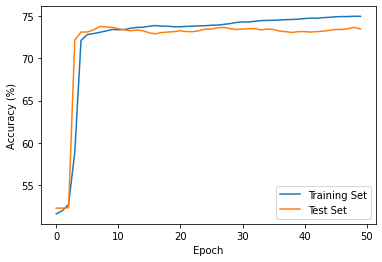

Threshold 0, Model 82
Training with Seed 82


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.81it/s]


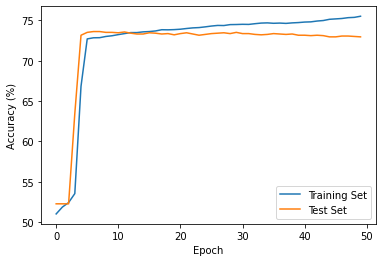

Threshold 0, Model 83
Training with Seed 83


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.68it/s]


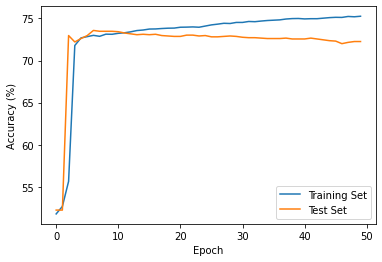

Threshold 0, Model 84
Training with Seed 84


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.00it/s]


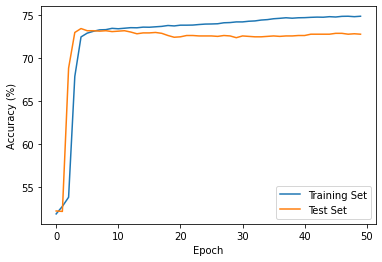

Threshold 0, Model 85
Training with Seed 85


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.03it/s]


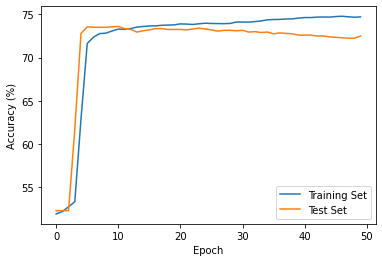

Threshold 0, Model 86
Training with Seed 86


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.06it/s]


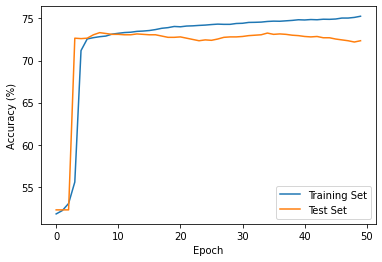

Threshold 0, Model 87
Training with Seed 87


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.97it/s]


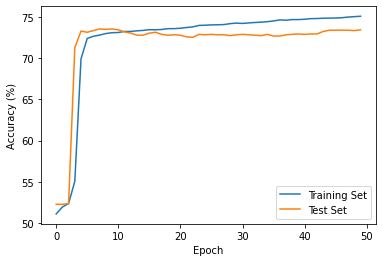

Threshold 0, Model 88
Training with Seed 88


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.94it/s]


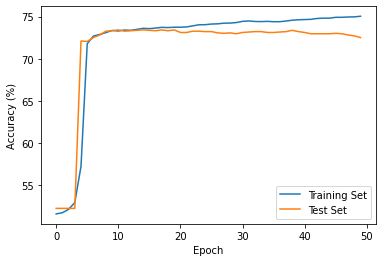

Threshold 0, Model 89
Training with Seed 89


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.98it/s]


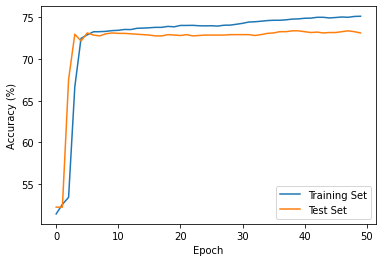

Threshold 0, Model 90
Training with Seed 90


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.03it/s]


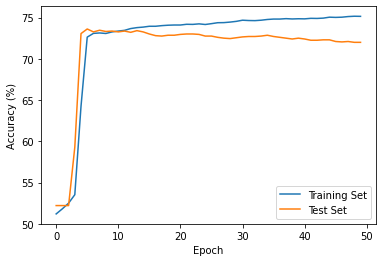

Threshold 0, Model 91
Training with Seed 91


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.03it/s]


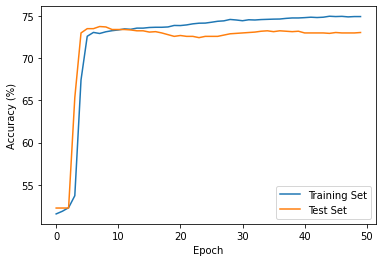

Threshold 0, Model 92
Training with Seed 92


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.96it/s]


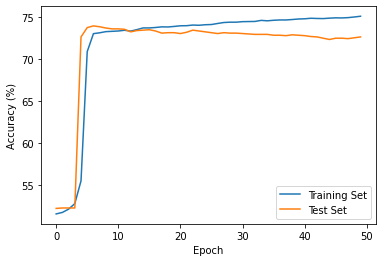

Threshold 0, Model 93
Training with Seed 93


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.02it/s]


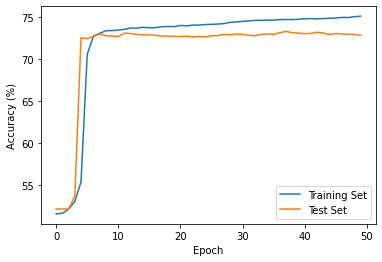

Threshold 0, Model 94
Training with Seed 94


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.99it/s]


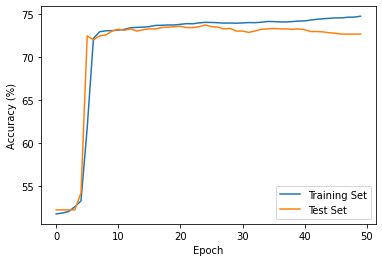

Threshold 0, Model 95
Training with Seed 95


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.98it/s]


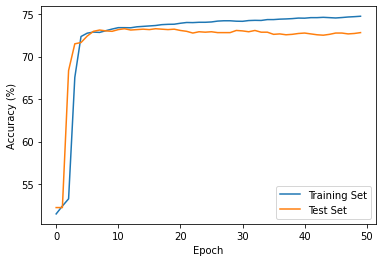

Threshold 0, Model 96
Training with Seed 96


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.97it/s]


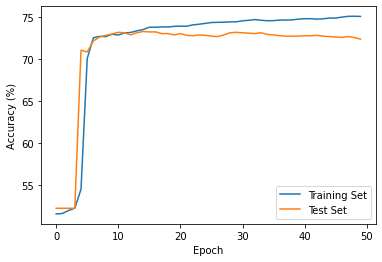

Threshold 0, Model 97
Training with Seed 97


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.94it/s]


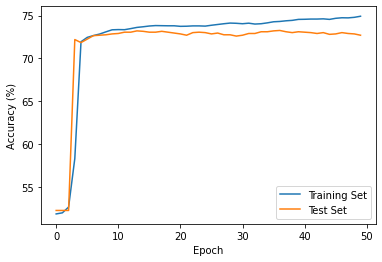

Threshold 0, Model 98
Training with Seed 98


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.00it/s]


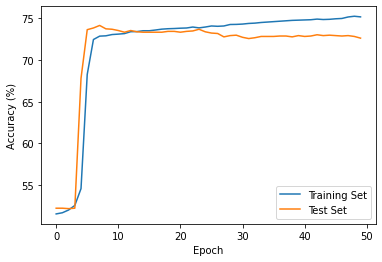

Threshold 0, Model 99
Training with Seed 99


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.94it/s]


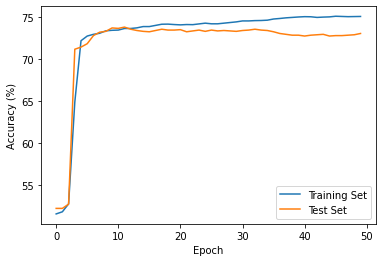

Threshold 0.01, Model 0
Training with Seed 0


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.91it/s]


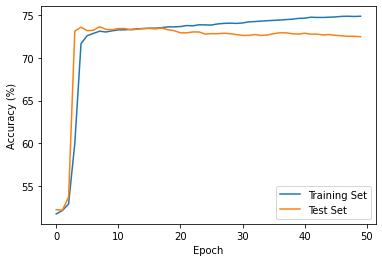

Threshold 0.01, Model 1
Training with Seed 1


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.72it/s]


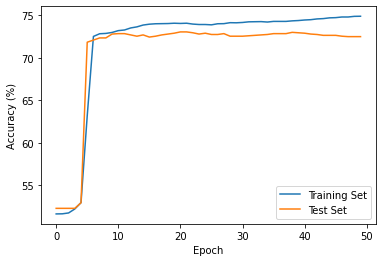

Threshold 0.01, Model 2
Training with Seed 2


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.85it/s]


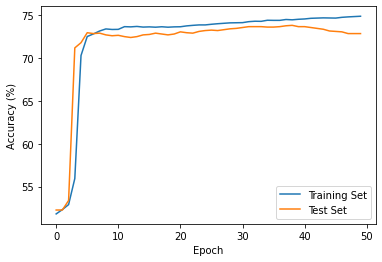

Threshold 0.01, Model 3
Training with Seed 3


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.90it/s]


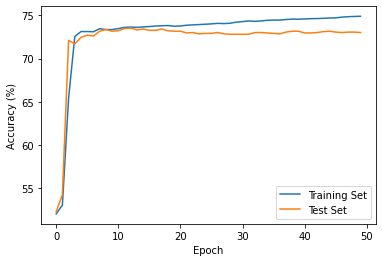

Threshold 0.01, Model 4
Training with Seed 4


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.97it/s]


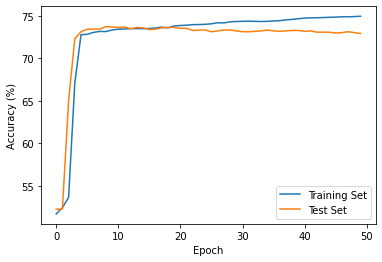

Threshold 0.01, Model 5
Training with Seed 5


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.04it/s]


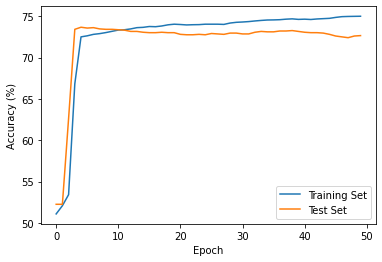

Threshold 0.01, Model 6
Training with Seed 6


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.03it/s]


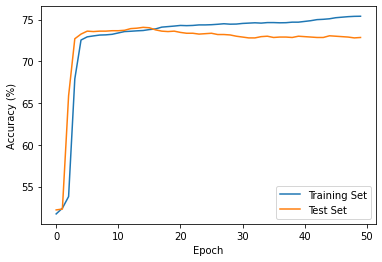

Threshold 0.01, Model 7
Training with Seed 7


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.90it/s]


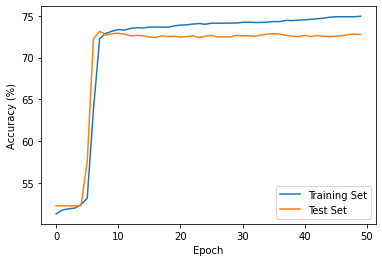

Threshold 0.01, Model 8
Training with Seed 8


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.01it/s]


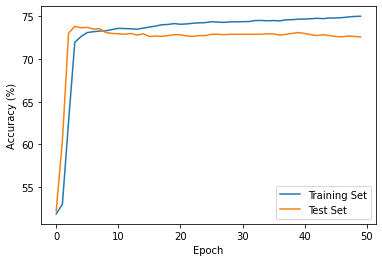

Threshold 0.01, Model 9
Training with Seed 9


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.93it/s]


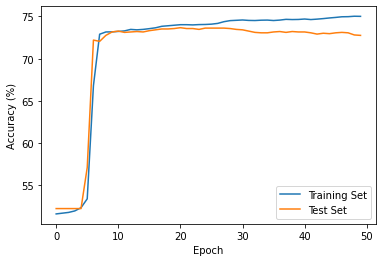

Threshold 0.01, Model 10
Training with Seed 10


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.93it/s]


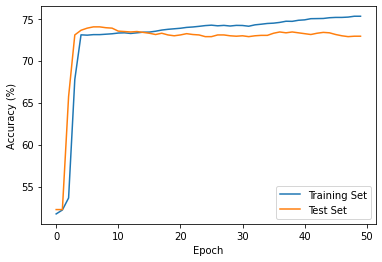

Threshold 0.01, Model 11
Training with Seed 11


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.97it/s]


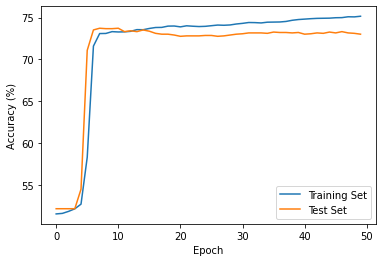

Threshold 0.01, Model 12
Training with Seed 12


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.88it/s]


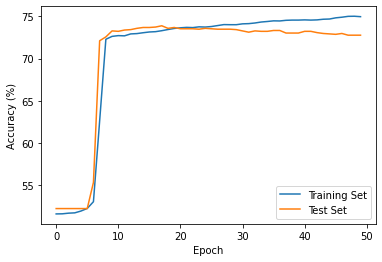

Threshold 0.01, Model 13
Training with Seed 13


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.92it/s]


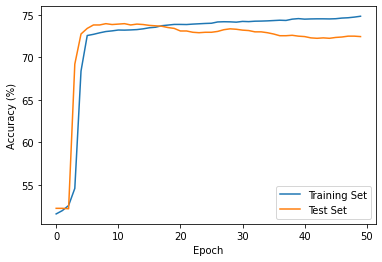

Threshold 0.01, Model 14
Training with Seed 14


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.02it/s]


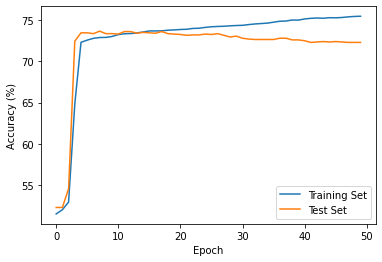

Threshold 0.01, Model 15
Training with Seed 15


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.99it/s]


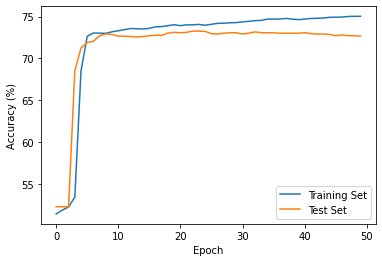

Threshold 0.01, Model 16
Training with Seed 16


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.95it/s]


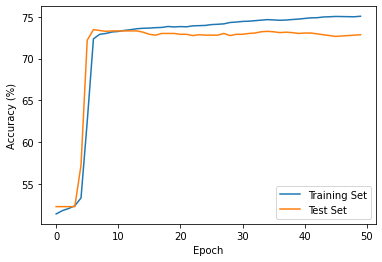

Threshold 0.01, Model 17
Training with Seed 17


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.99it/s]


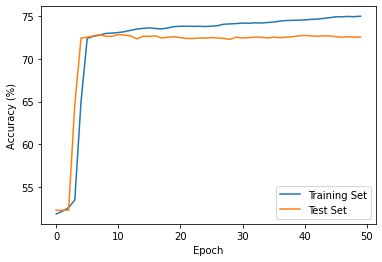

Threshold 0.01, Model 18
Training with Seed 18


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.92it/s]


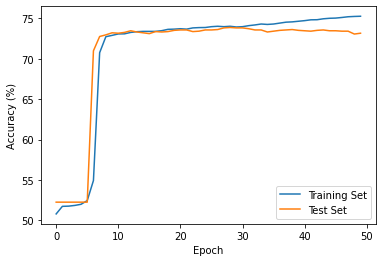

Threshold 0.01, Model 19
Training with Seed 19


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.86it/s]


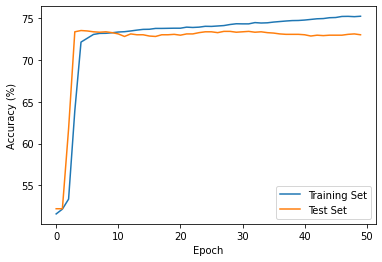

Threshold 0.01, Model 20
Training with Seed 20


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.70it/s]


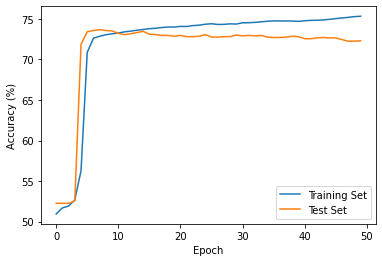

Threshold 0.01, Model 21
Training with Seed 21


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.92it/s]


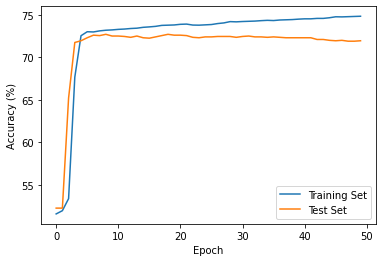

Threshold 0.01, Model 22
Training with Seed 22


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.96it/s]


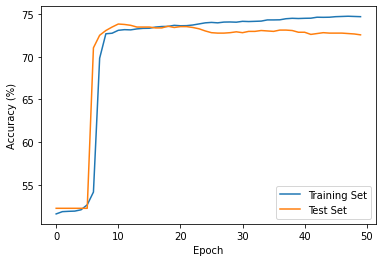

Threshold 0.01, Model 23
Training with Seed 23


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.97it/s]


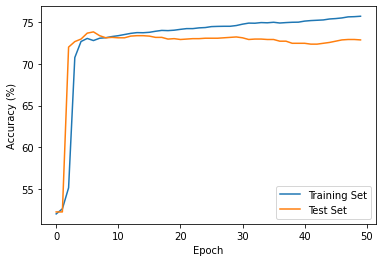

Threshold 0.01, Model 24
Training with Seed 24


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.69it/s]


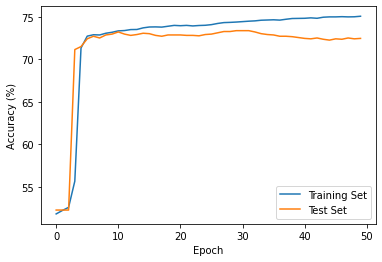

Threshold 0.01, Model 25
Training with Seed 25


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.96it/s]


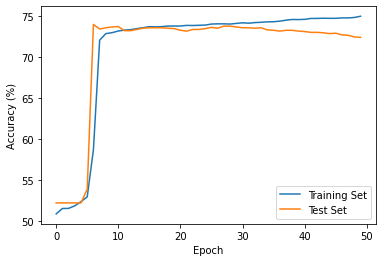

Threshold 0.01, Model 26
Training with Seed 26


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.97it/s]


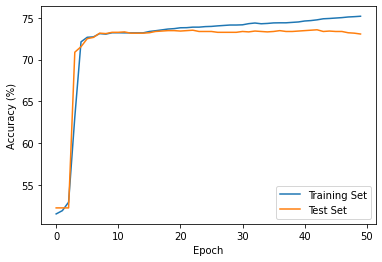

Threshold 0.01, Model 27
Training with Seed 27


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.79it/s]


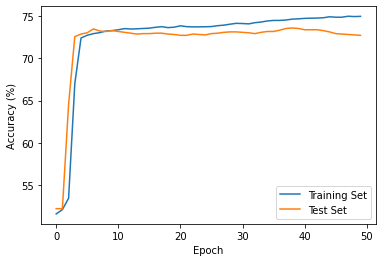

Threshold 0.01, Model 28
Training with Seed 28


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.75it/s]


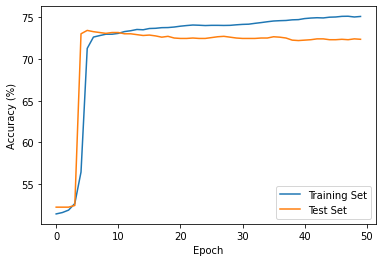

Threshold 0.01, Model 29
Training with Seed 29


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.02it/s]


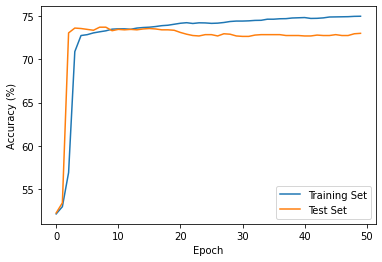

Threshold 0.01, Model 30
Training with Seed 30


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.71it/s]


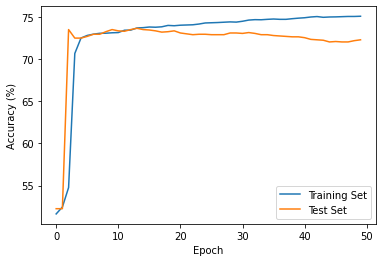

Threshold 0.01, Model 31
Training with Seed 31


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.97it/s]


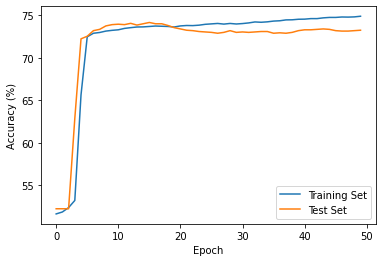

Threshold 0.01, Model 32
Training with Seed 32


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.06it/s]


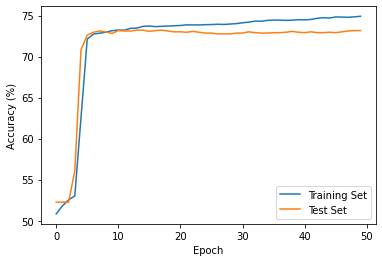

Threshold 0.01, Model 33
Training with Seed 33


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.95it/s]


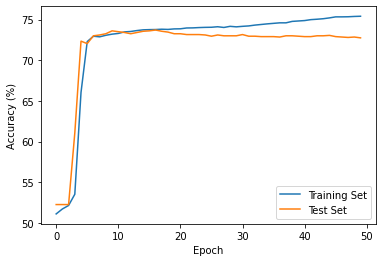

Threshold 0.01, Model 34
Training with Seed 34


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.68it/s]


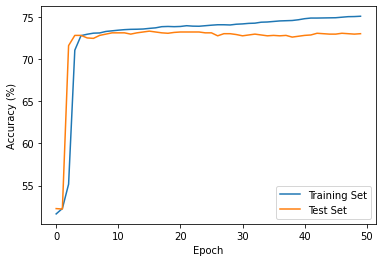

Threshold 0.01, Model 35
Training with Seed 35


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.92it/s]


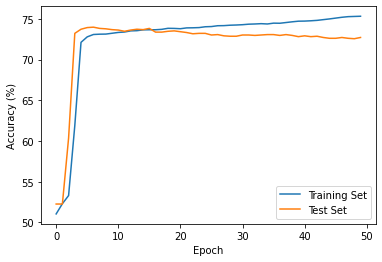

Threshold 0.01, Model 36
Training with Seed 36


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.78it/s]


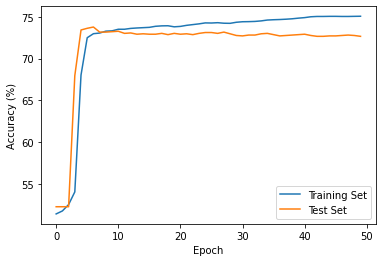

Threshold 0.01, Model 37
Training with Seed 37


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.92it/s]


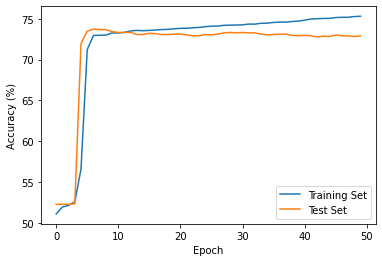

Threshold 0.01, Model 38
Training with Seed 38


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.88it/s]


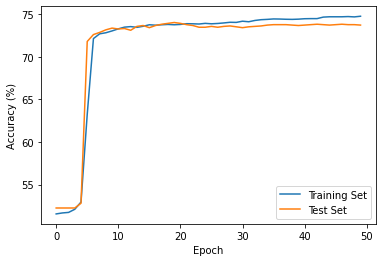

Threshold 0.01, Model 39
Training with Seed 39


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.01it/s]


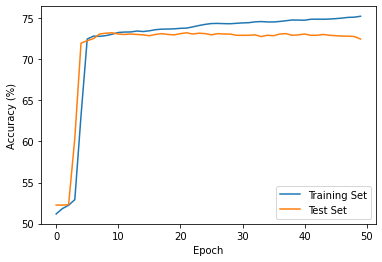

Threshold 0.01, Model 40
Training with Seed 40


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.01it/s]


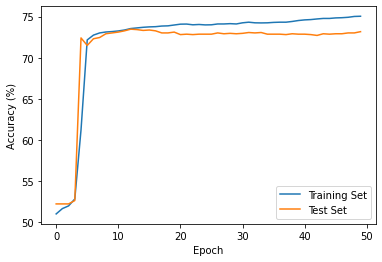

Threshold 0.01, Model 41
Training with Seed 41


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.95it/s]


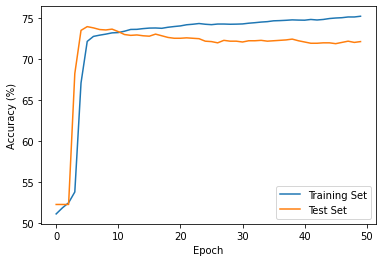

Threshold 0.01, Model 42
Training with Seed 42


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.98it/s]


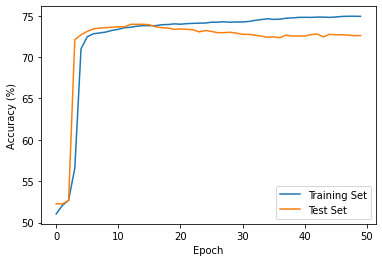

Threshold 0.01, Model 43
Training with Seed 43


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.02it/s]


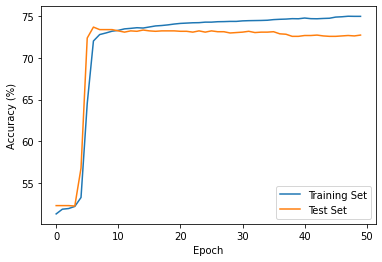

Threshold 0.01, Model 44
Training with Seed 44


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.91it/s]


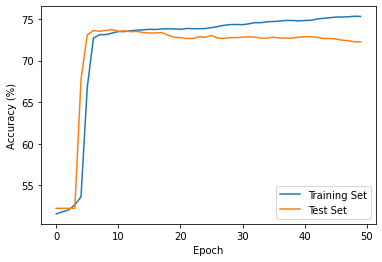

Threshold 0.01, Model 45
Training with Seed 45


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.98it/s]


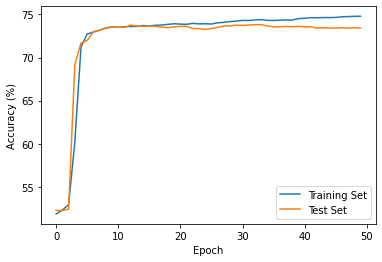

Threshold 0.01, Model 46
Training with Seed 46


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.78it/s]


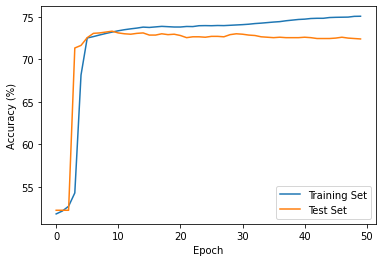

Threshold 0.01, Model 47
Training with Seed 47


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.96it/s]


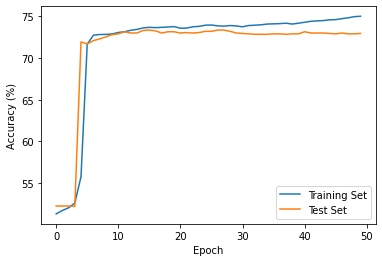

Threshold 0.01, Model 48
Training with Seed 48


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.02it/s]


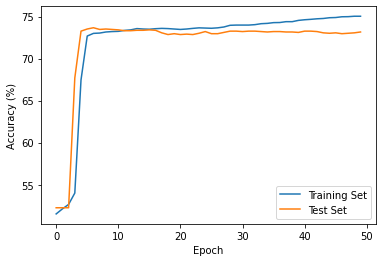

Threshold 0.01, Model 49
Training with Seed 49


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.03it/s]


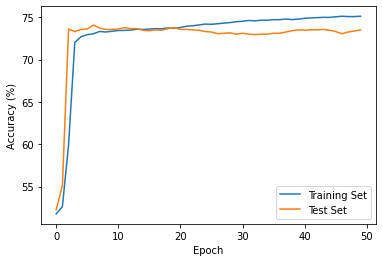

Threshold 0.01, Model 50
Training with Seed 50


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.96it/s]


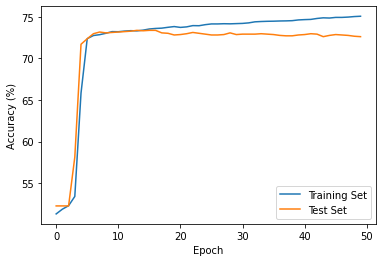

Threshold 0.01, Model 51
Training with Seed 51


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.84it/s]


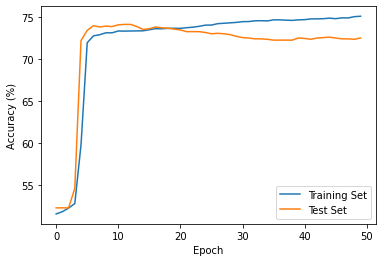

Threshold 0.01, Model 52
Training with Seed 52


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.88it/s]


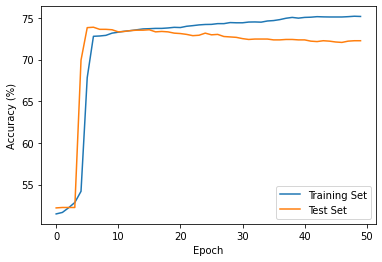

Threshold 0.01, Model 53
Training with Seed 53


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.95it/s]


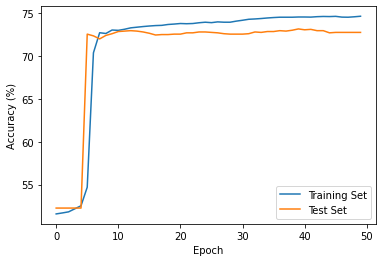

Threshold 0.01, Model 54
Training with Seed 54


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.71it/s]


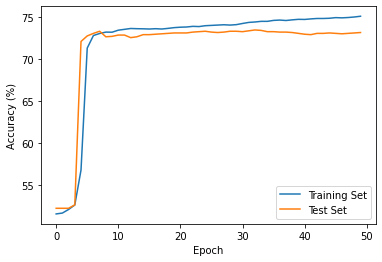

Threshold 0.01, Model 55
Training with Seed 55


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.82it/s]


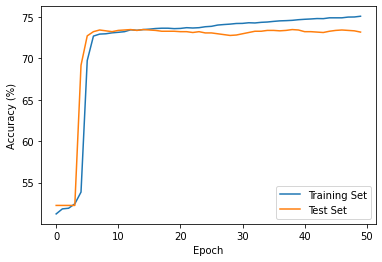

Threshold 0.01, Model 56
Training with Seed 56


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.87it/s]


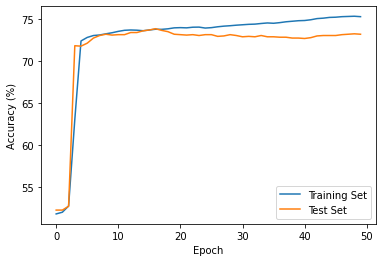

Threshold 0.01, Model 57
Training with Seed 57


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.02it/s]


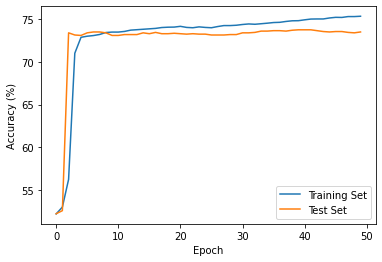

Threshold 0.01, Model 58
Training with Seed 58


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.02it/s]


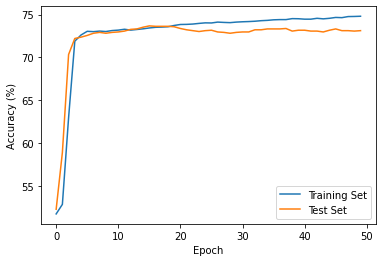

Threshold 0.01, Model 59
Training with Seed 59


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.83it/s]


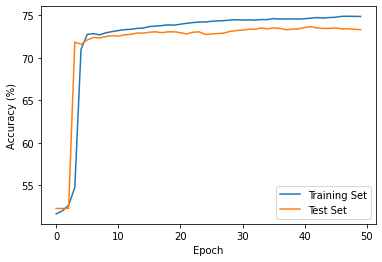

Threshold 0.01, Model 60
Training with Seed 60


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.84it/s]


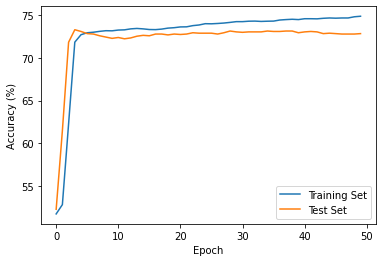

Threshold 0.01, Model 61
Training with Seed 61


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.75it/s]


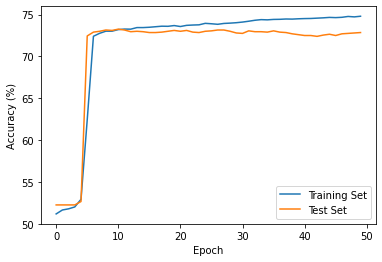

Threshold 0.01, Model 62
Training with Seed 62


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.99it/s]


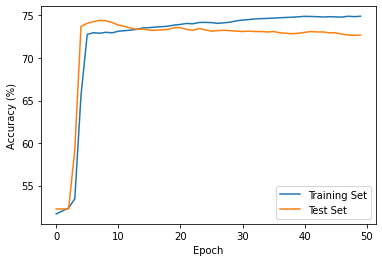

Threshold 0.01, Model 63
Training with Seed 63


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.06it/s]


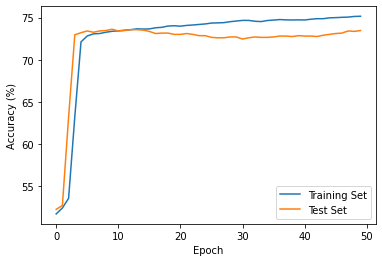

Threshold 0.01, Model 64
Training with Seed 64


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.05it/s]


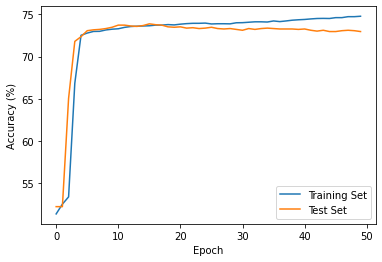

Threshold 0.01, Model 65
Training with Seed 65


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.90it/s]


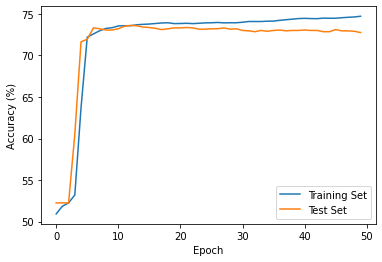

Threshold 0.01, Model 66
Training with Seed 66


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.62it/s]


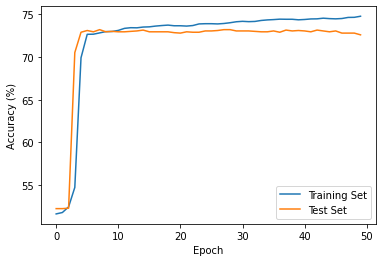

Threshold 0.01, Model 67
Training with Seed 67


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.62it/s]


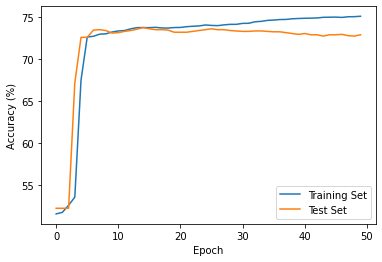

Threshold 0.01, Model 68
Training with Seed 68


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.01it/s]


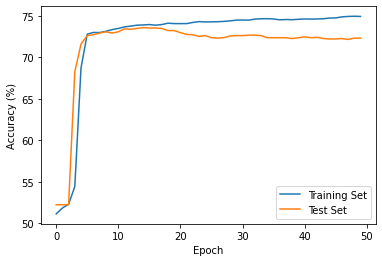

Threshold 0.01, Model 69
Training with Seed 69


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.05it/s]


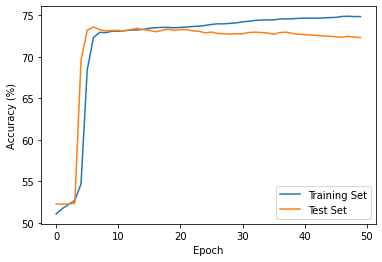

Threshold 0.01, Model 70
Training with Seed 70


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.90it/s]


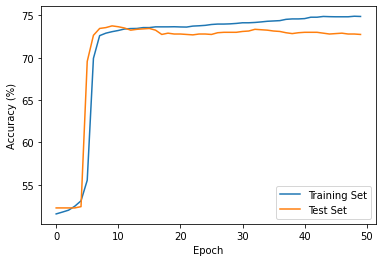

Threshold 0.01, Model 71
Training with Seed 71


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.91it/s]


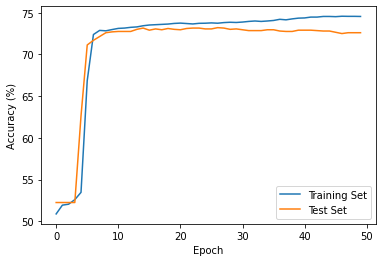

Threshold 0.01, Model 72
Training with Seed 72


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.90it/s]


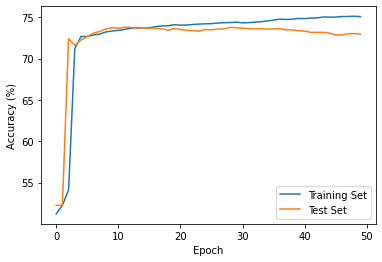

Threshold 0.01, Model 73
Training with Seed 73


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.02it/s]


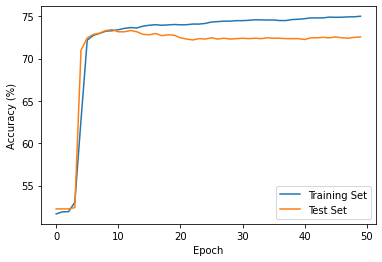

Threshold 0.01, Model 74
Training with Seed 74


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.06it/s]


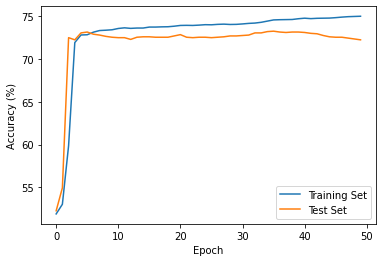

Threshold 0.01, Model 75
Training with Seed 75


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.05it/s]


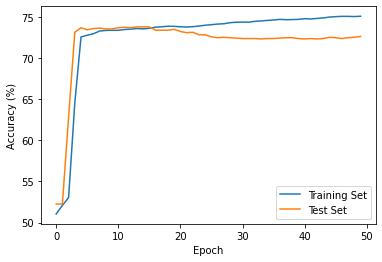

Threshold 0.01, Model 76
Training with Seed 76


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.01it/s]


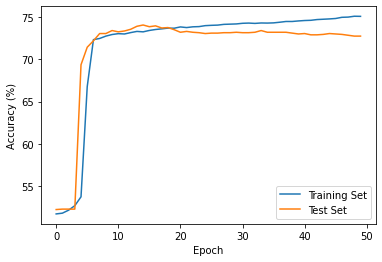

Threshold 0.01, Model 77
Training with Seed 77


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.97it/s]


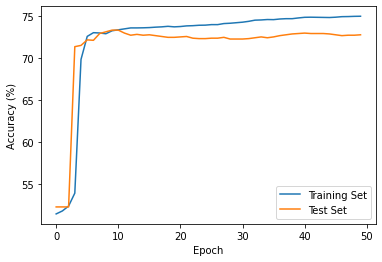

Threshold 0.01, Model 78
Training with Seed 78


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.04it/s]


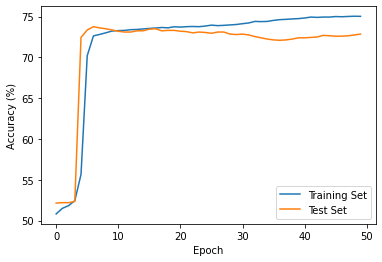

Threshold 0.01, Model 79
Training with Seed 79


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.91it/s]


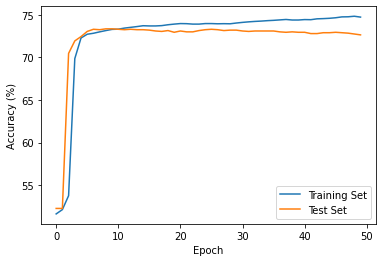

Threshold 0.01, Model 80
Training with Seed 80


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.66it/s]


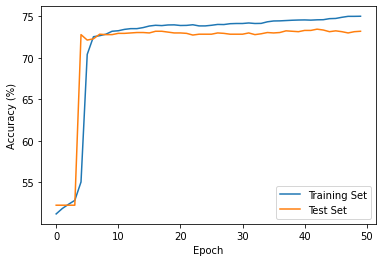

Threshold 0.01, Model 81
Training with Seed 81


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.74it/s]


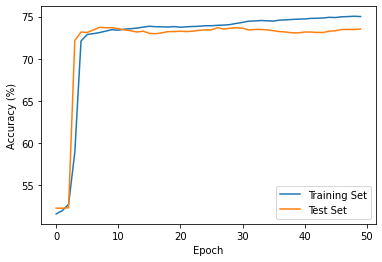

Threshold 0.01, Model 82
Training with Seed 82


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.73it/s]


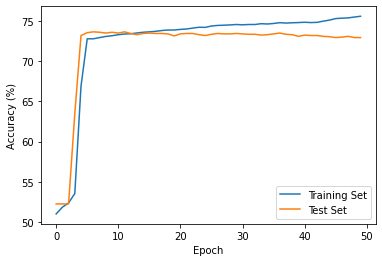

Threshold 0.01, Model 83
Training with Seed 83


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.88it/s]


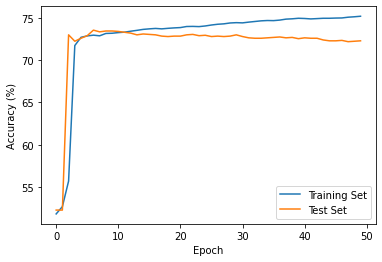

Threshold 0.01, Model 84
Training with Seed 84


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.97it/s]


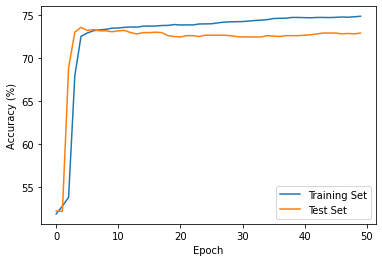

Threshold 0.01, Model 85
Training with Seed 85


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.98it/s]


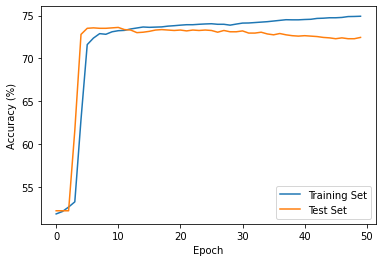

Threshold 0.01, Model 86
Training with Seed 86


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.95it/s]


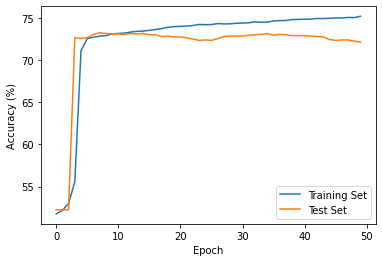

Threshold 0.01, Model 87
Training with Seed 87


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.99it/s]


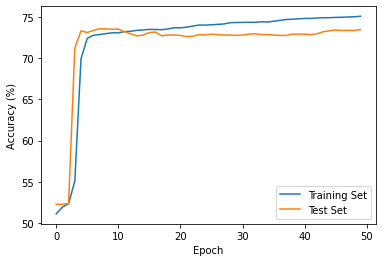

Threshold 0.01, Model 88
Training with Seed 88


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.96it/s]


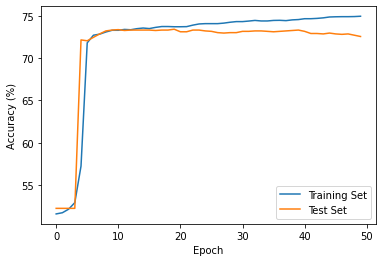

Threshold 0.01, Model 89
Training with Seed 89


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.04it/s]


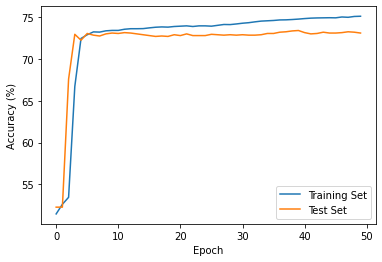

Threshold 0.01, Model 90
Training with Seed 90


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.04it/s]


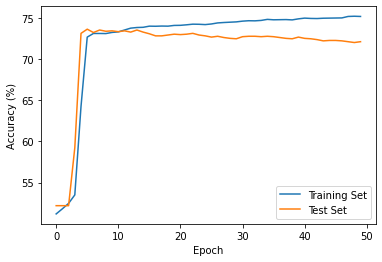

Threshold 0.01, Model 91
Training with Seed 91


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.77it/s]


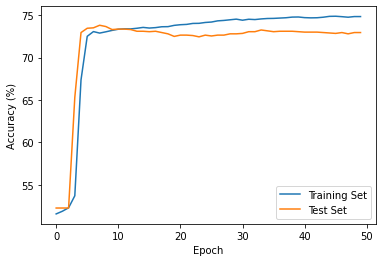

Threshold 0.01, Model 92
Training with Seed 92


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.04it/s]


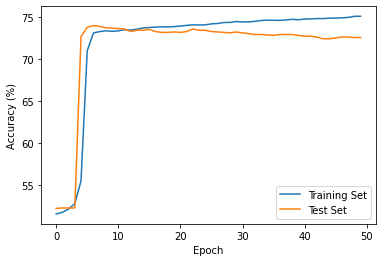

Threshold 0.01, Model 93
Training with Seed 93


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.95it/s]


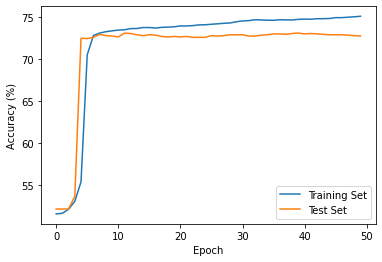

Threshold 0.01, Model 94
Training with Seed 94


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.87it/s]


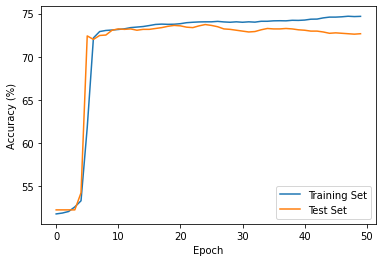

Threshold 0.01, Model 95
Training with Seed 95


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.83it/s]


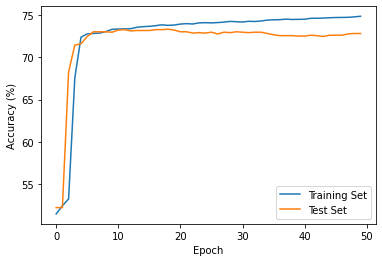

Threshold 0.01, Model 96
Training with Seed 96


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.04it/s]


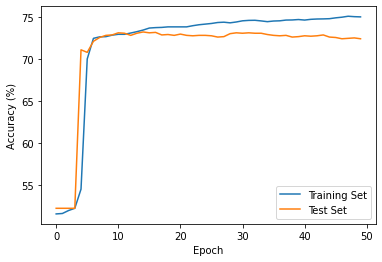

Threshold 0.01, Model 97
Training with Seed 97


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.09it/s]


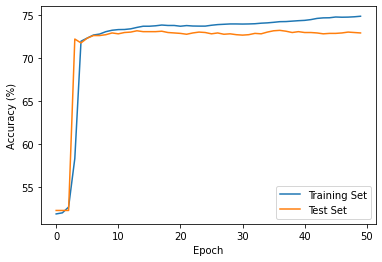

Threshold 0.01, Model 98
Training with Seed 98


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.75it/s]


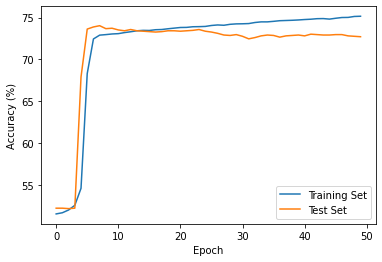

Threshold 0.01, Model 99
Training with Seed 99


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.79it/s]


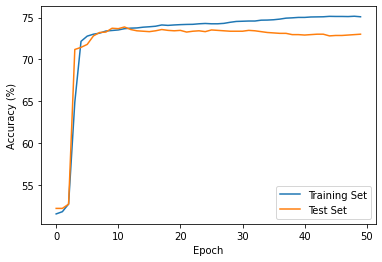

Threshold 0.05, Model 0
Training with Seed 0


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.87it/s]


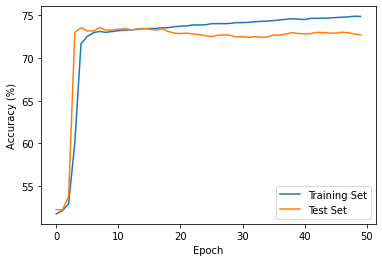

Threshold 0.05, Model 1
Training with Seed 1


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.02it/s]


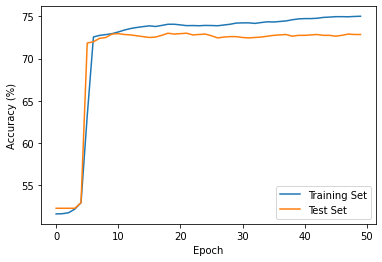

Threshold 0.05, Model 2
Training with Seed 2


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.98it/s]


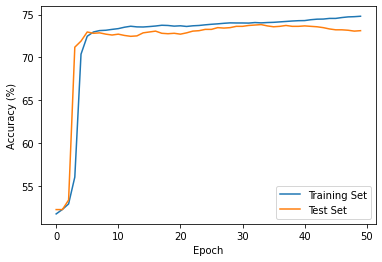

Threshold 0.05, Model 3
Training with Seed 3


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.77it/s]


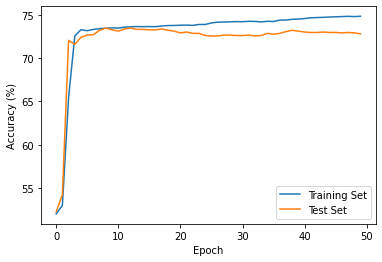

Threshold 0.05, Model 4
Training with Seed 4


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.83it/s]


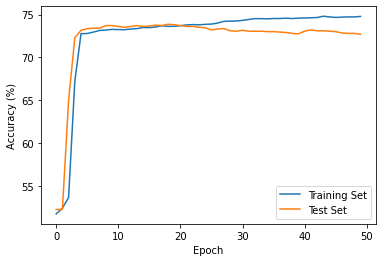

Threshold 0.05, Model 5
Training with Seed 5


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.86it/s]


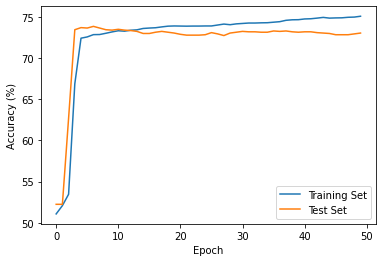

Threshold 0.05, Model 6
Training with Seed 6


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.73it/s]


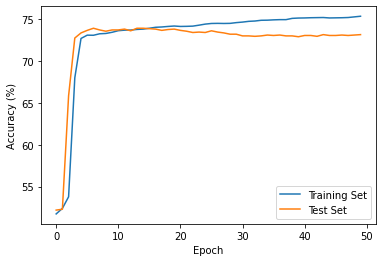

Threshold 0.05, Model 7
Training with Seed 7


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.75it/s]


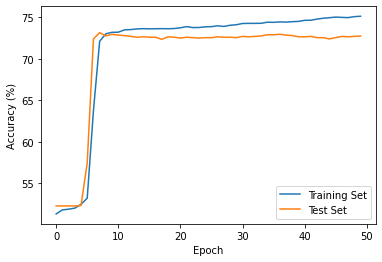

Threshold 0.05, Model 8
Training with Seed 8


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.96it/s]


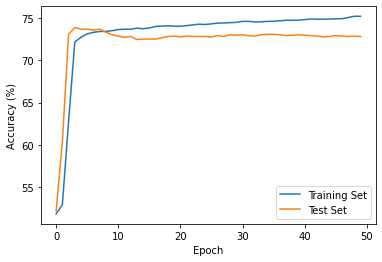

Threshold 0.05, Model 9
Training with Seed 9


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.97it/s]


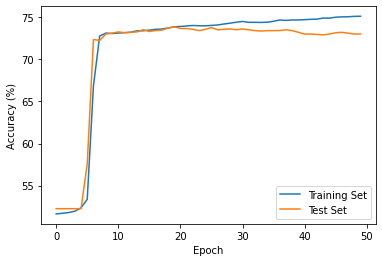

Threshold 0.05, Model 10
Training with Seed 10


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.99it/s]


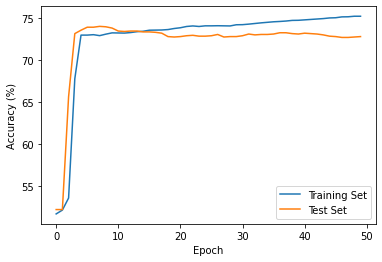

Threshold 0.05, Model 11
Training with Seed 11


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.81it/s]


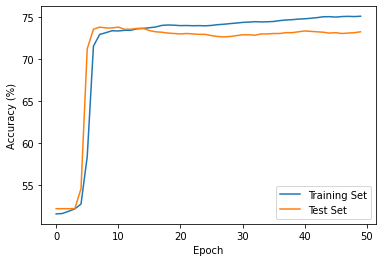

Threshold 0.05, Model 12
Training with Seed 12


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.86it/s]


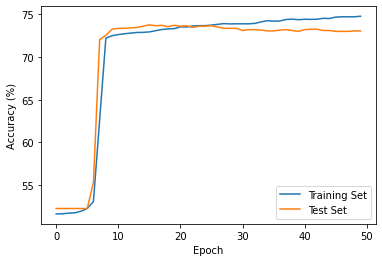

Threshold 0.05, Model 13
Training with Seed 13


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.87it/s]


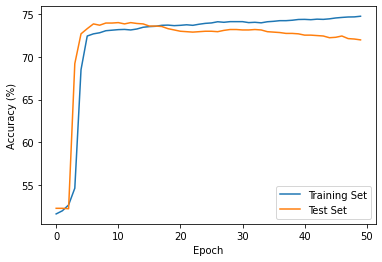

Threshold 0.05, Model 14
Training with Seed 14


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.78it/s]


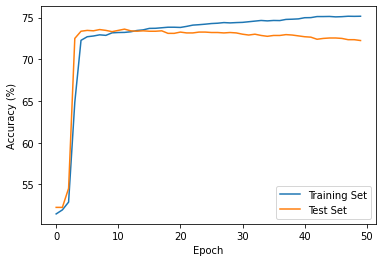

Threshold 0.05, Model 15
Training with Seed 15


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.83it/s]


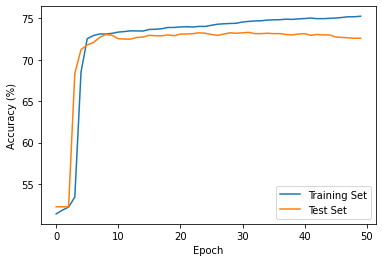

Threshold 0.05, Model 16
Training with Seed 16


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.79it/s]


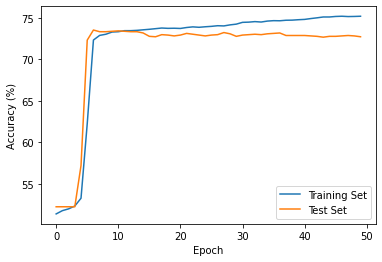

Threshold 0.05, Model 17
Training with Seed 17


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.02it/s]


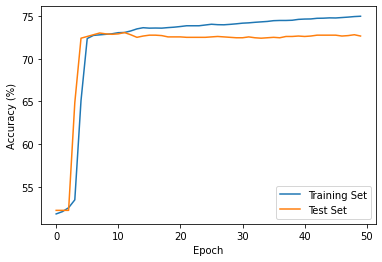

Threshold 0.05, Model 18
Training with Seed 18


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.99it/s]


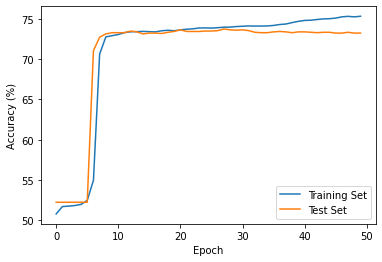

Threshold 0.05, Model 19
Training with Seed 19


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.03it/s]


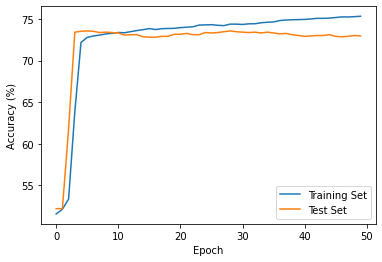

Threshold 0.05, Model 20
Training with Seed 20


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.91it/s]


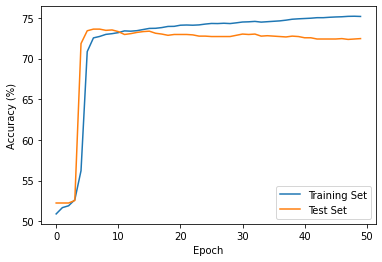

Threshold 0.05, Model 21
Training with Seed 21


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.83it/s]


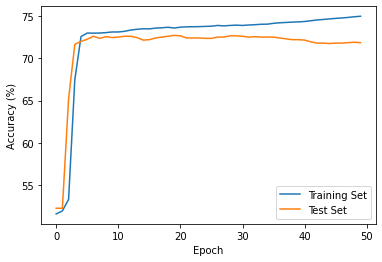

Threshold 0.05, Model 22
Training with Seed 22


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.88it/s]


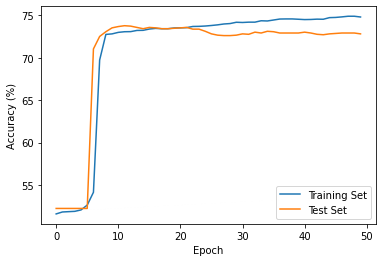

Threshold 0.05, Model 23
Training with Seed 23


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.03it/s]


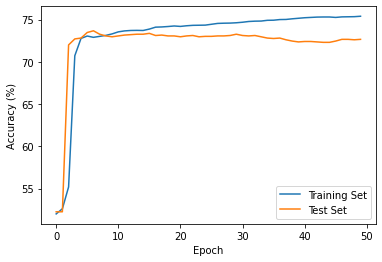

Threshold 0.05, Model 24
Training with Seed 24


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.93it/s]


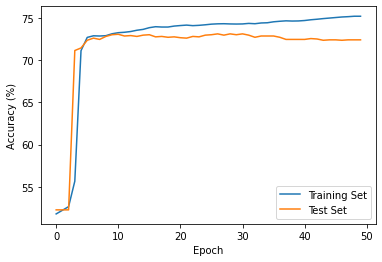

Threshold 0.05, Model 25
Training with Seed 25


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.05it/s]


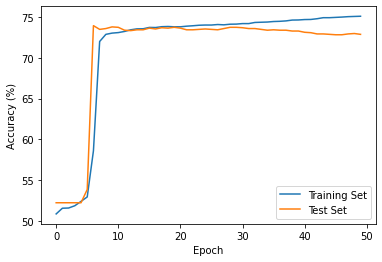

Threshold 0.05, Model 26
Training with Seed 26


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.79it/s]


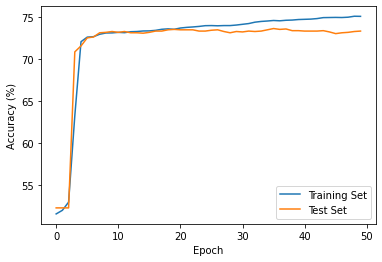

Threshold 0.05, Model 27
Training with Seed 27


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.95it/s]


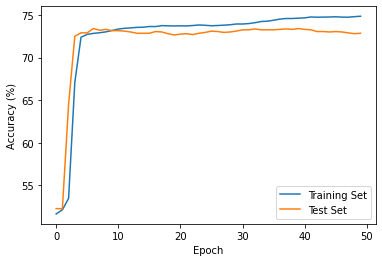

Threshold 0.05, Model 28
Training with Seed 28


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.76it/s]


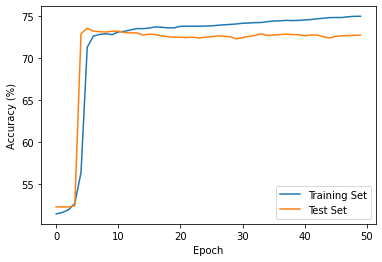

Threshold 0.05, Model 29
Training with Seed 29


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.78it/s]


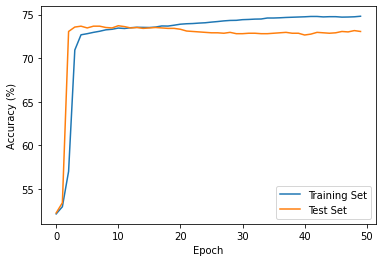

Threshold 0.05, Model 30
Training with Seed 30


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.97it/s]


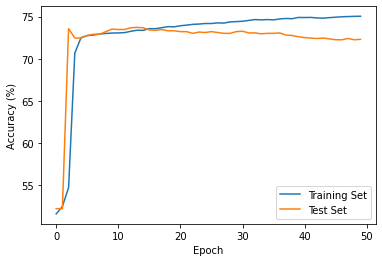

Threshold 0.05, Model 31
Training with Seed 31


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.05it/s]


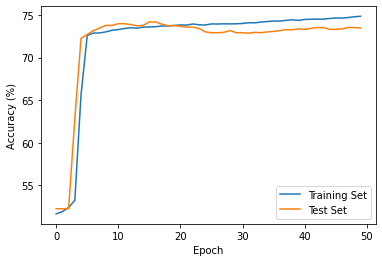

Threshold 0.05, Model 32
Training with Seed 32


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.03it/s]


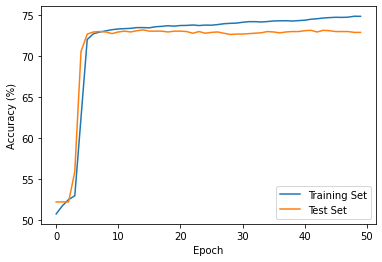

Threshold 0.05, Model 33
Training with Seed 33


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.07it/s]


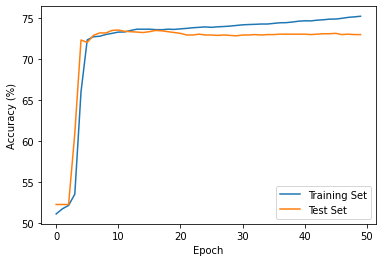

Threshold 0.05, Model 34
Training with Seed 34


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.05it/s]


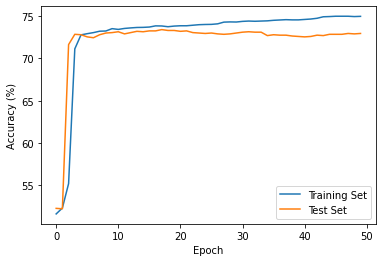

Threshold 0.05, Model 35
Training with Seed 35


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.06it/s]


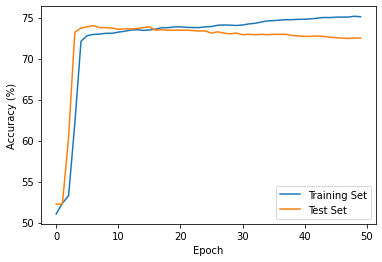

Threshold 0.05, Model 36
Training with Seed 36


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.88it/s]


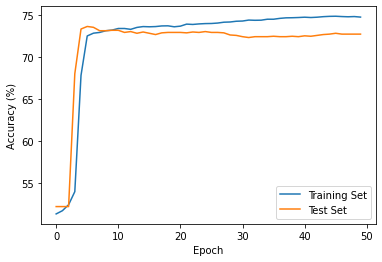

Threshold 0.05, Model 37
Training with Seed 37


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.03it/s]


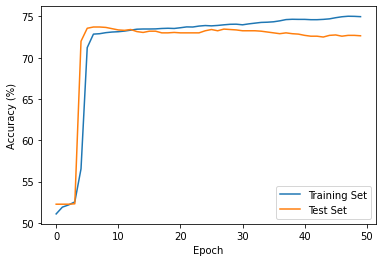

Threshold 0.05, Model 38
Training with Seed 38


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.06it/s]


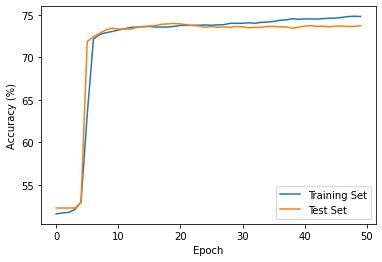

Threshold 0.05, Model 39
Training with Seed 39


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.06it/s]


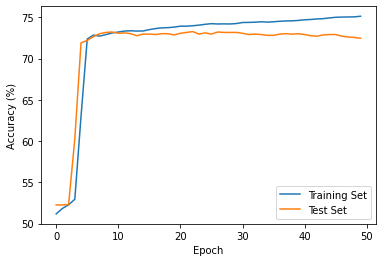

Threshold 0.05, Model 40
Training with Seed 40


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.04it/s]


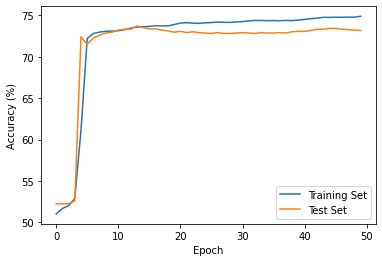

Threshold 0.05, Model 41
Training with Seed 41


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.03it/s]


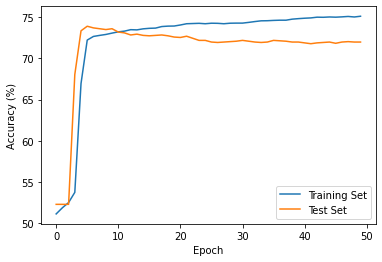

Threshold 0.05, Model 42
Training with Seed 42


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.02it/s]


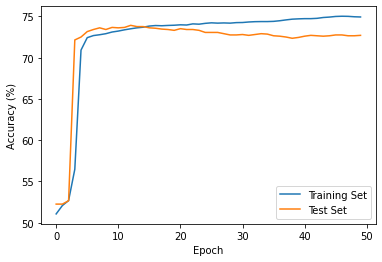

Threshold 0.05, Model 43
Training with Seed 43


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.03it/s]


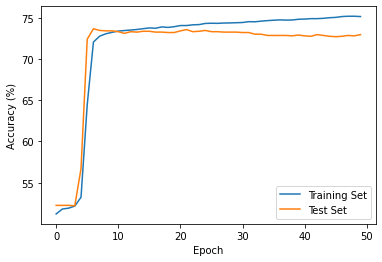

Threshold 0.05, Model 44
Training with Seed 44


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.04it/s]


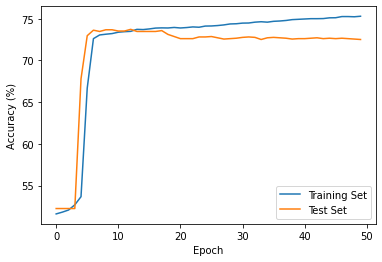

Threshold 0.05, Model 45
Training with Seed 45


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.84it/s]


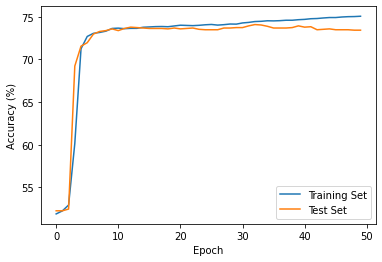

Threshold 0.05, Model 46
Training with Seed 46


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.75it/s]


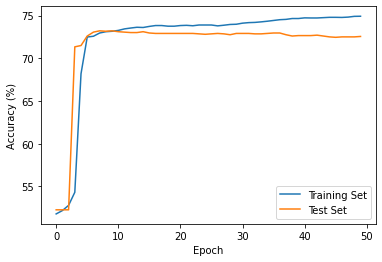

Threshold 0.05, Model 47
Training with Seed 47


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.91it/s]


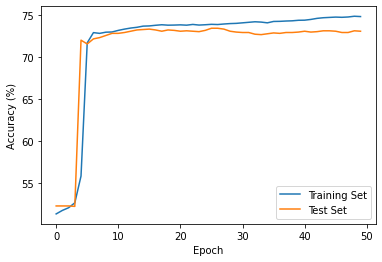

Threshold 0.05, Model 48
Training with Seed 48


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.94it/s]


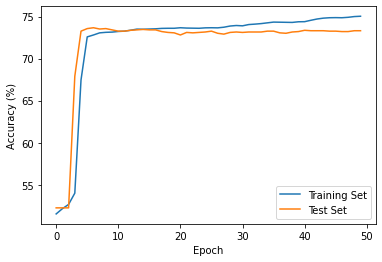

Threshold 0.05, Model 49
Training with Seed 49


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.82it/s]


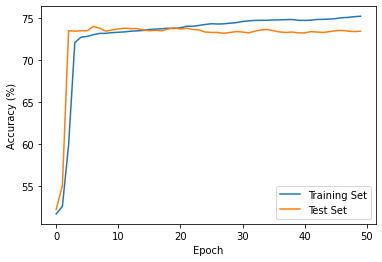

Threshold 0.05, Model 50
Training with Seed 50


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.00it/s]


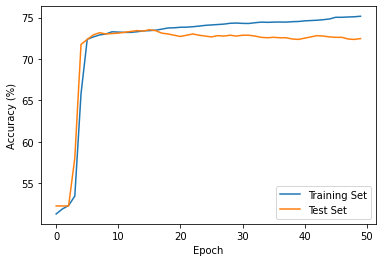

Threshold 0.05, Model 51
Training with Seed 51


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.01it/s]


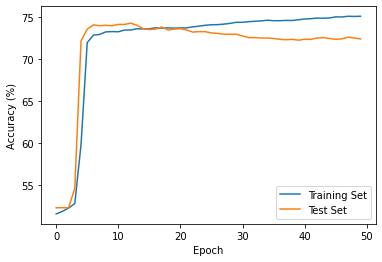

Threshold 0.05, Model 52
Training with Seed 52


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.84it/s]


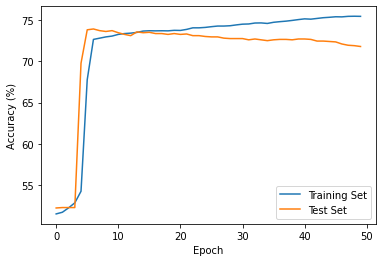

Threshold 0.05, Model 53
Training with Seed 53


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.00it/s]


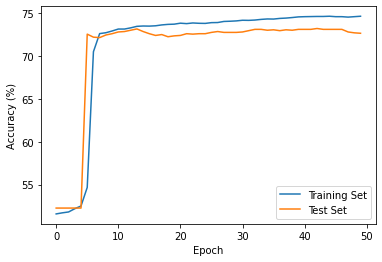

Threshold 0.05, Model 54
Training with Seed 54


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.97it/s]


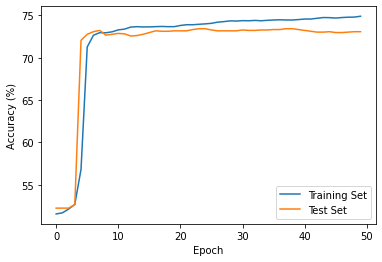

Threshold 0.05, Model 55
Training with Seed 55


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.99it/s]


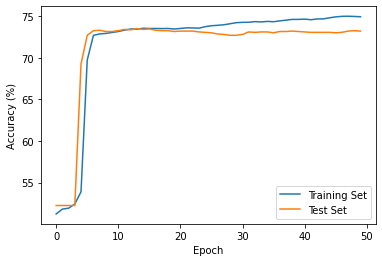

Threshold 0.05, Model 56
Training with Seed 56


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.98it/s]


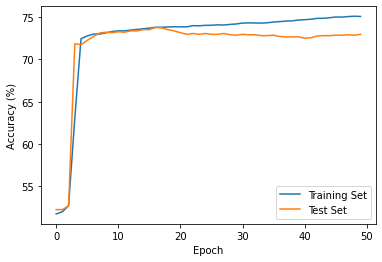

Threshold 0.05, Model 57
Training with Seed 57


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.01it/s]


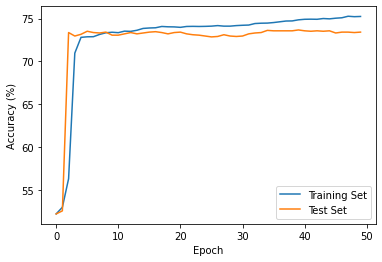

Threshold 0.05, Model 58
Training with Seed 58


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.99it/s]


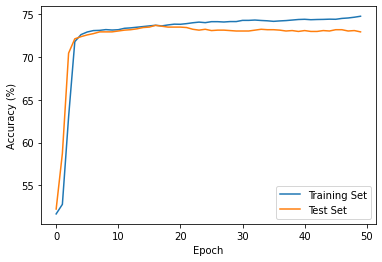

Threshold 0.05, Model 59
Training with Seed 59


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.87it/s]


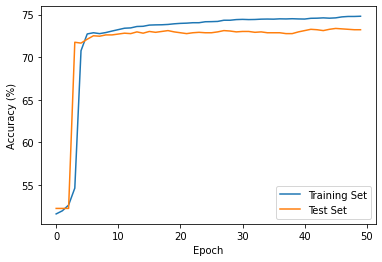

Threshold 0.05, Model 60
Training with Seed 60


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.89it/s]


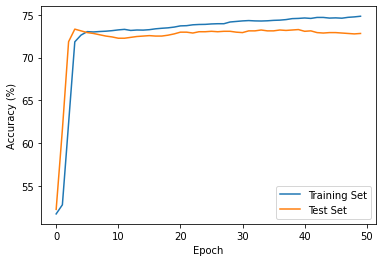

Threshold 0.05, Model 61
Training with Seed 61


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.83it/s]


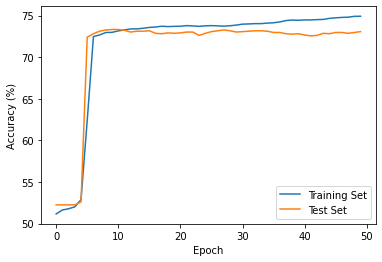

Threshold 0.05, Model 62
Training with Seed 62


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.90it/s]


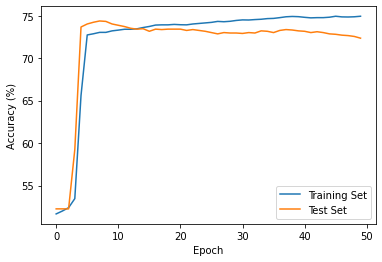

Threshold 0.05, Model 63
Training with Seed 63


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.89it/s]


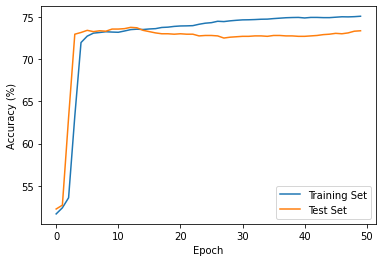

Threshold 0.05, Model 64
Training with Seed 64


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.97it/s]


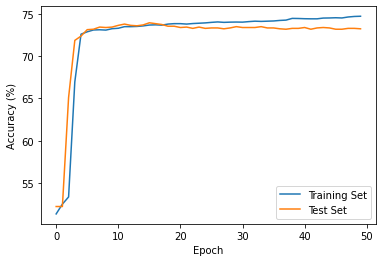

Threshold 0.05, Model 65
Training with Seed 65


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.95it/s]


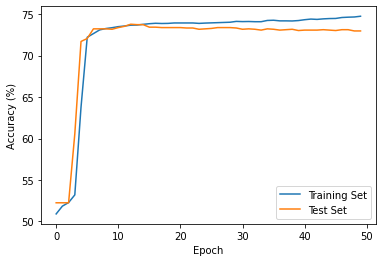

Threshold 0.05, Model 66
Training with Seed 66


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.87it/s]


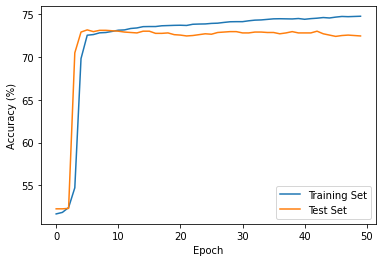

Threshold 0.05, Model 67
Training with Seed 67


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.79it/s]


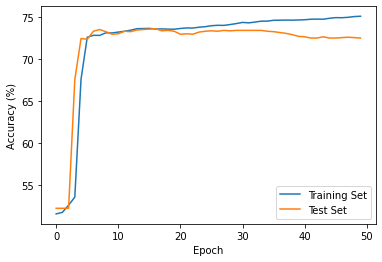

Threshold 0.05, Model 68
Training with Seed 68


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.00it/s]


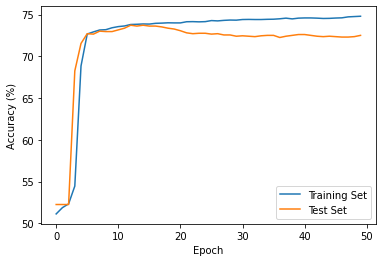

Threshold 0.05, Model 69
Training with Seed 69


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.06it/s]


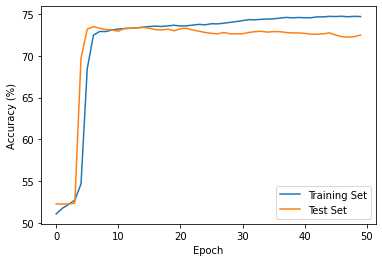

Threshold 0.05, Model 70
Training with Seed 70


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.95it/s]


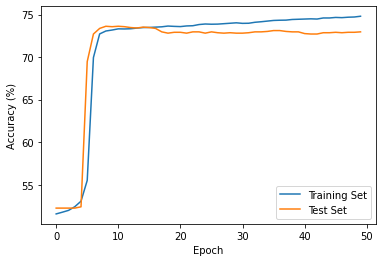

Threshold 0.05, Model 71
Training with Seed 71


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.77it/s]


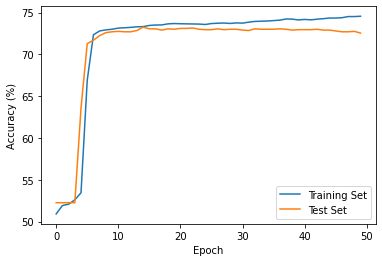

Threshold 0.05, Model 72
Training with Seed 72


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.90it/s]


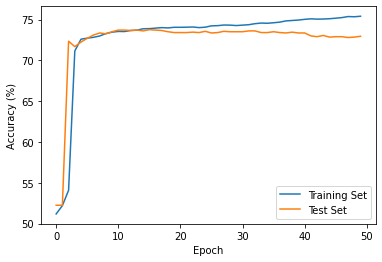

Threshold 0.05, Model 73
Training with Seed 73


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.07it/s]


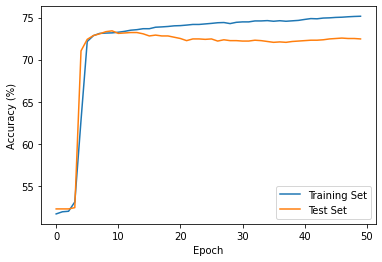

Threshold 0.05, Model 74
Training with Seed 74


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.00it/s]


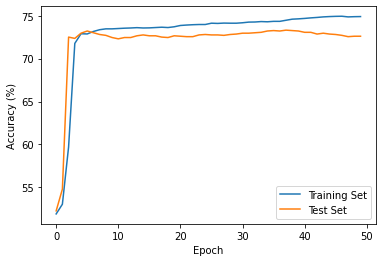

Threshold 0.05, Model 75
Training with Seed 75


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.03it/s]


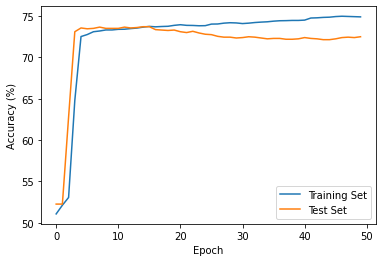

Threshold 0.05, Model 76
Training with Seed 76


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.97it/s]


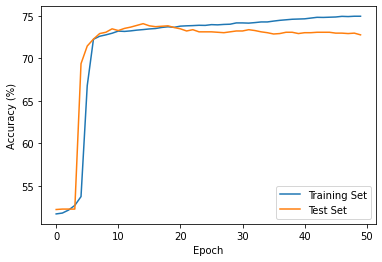

Threshold 0.05, Model 77
Training with Seed 77


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.01it/s]


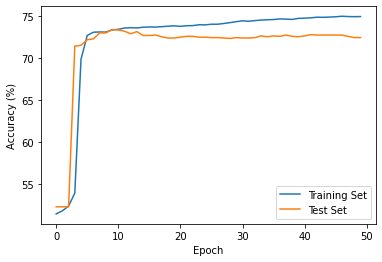

Threshold 0.05, Model 78
Training with Seed 78


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.94it/s]


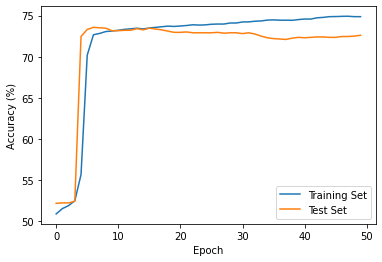

Threshold 0.05, Model 79
Training with Seed 79


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.02it/s]


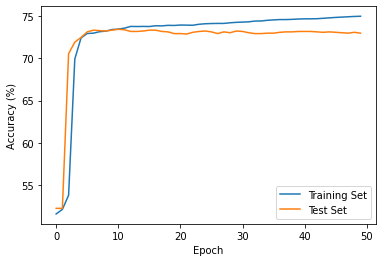

Threshold 0.05, Model 80
Training with Seed 80


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.08it/s]


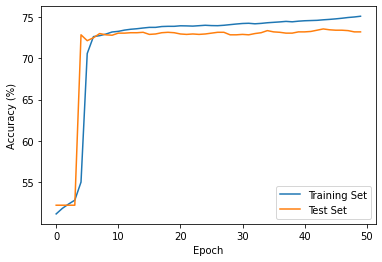

Threshold 0.05, Model 81
Training with Seed 81


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.05it/s]


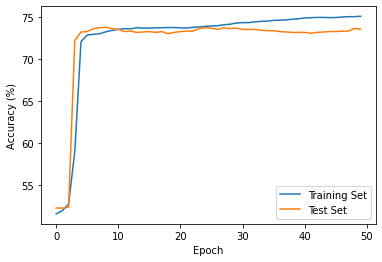

Threshold 0.05, Model 82
Training with Seed 82


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.06it/s]


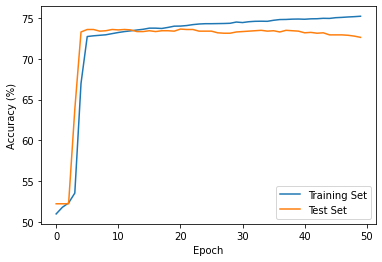

Threshold 0.05, Model 83
Training with Seed 83


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.98it/s]


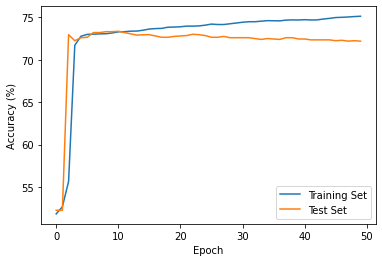

Threshold 0.05, Model 84
Training with Seed 84


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.04it/s]


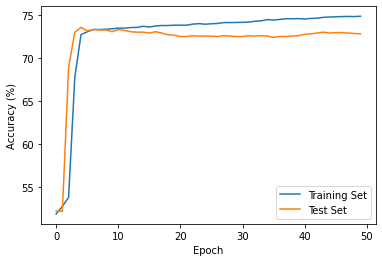

Threshold 0.05, Model 85
Training with Seed 85


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.99it/s]


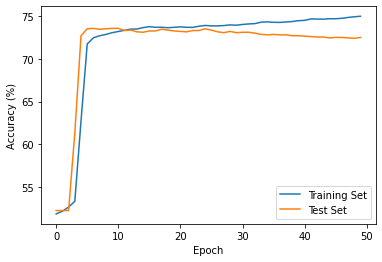

Threshold 0.05, Model 86
Training with Seed 86


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.04it/s]


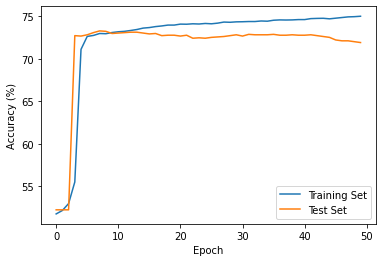

Threshold 0.05, Model 87
Training with Seed 87


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.03it/s]


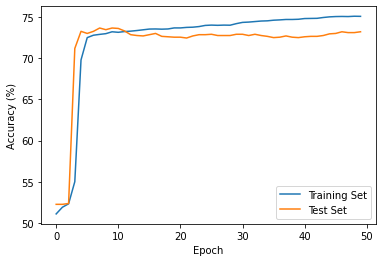

Threshold 0.05, Model 88
Training with Seed 88


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.79it/s]


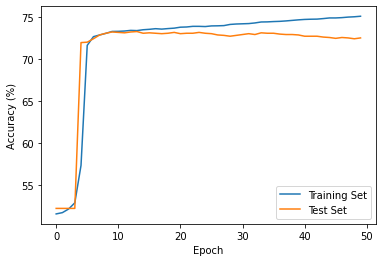

Threshold 0.05, Model 89
Training with Seed 89


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.01it/s]


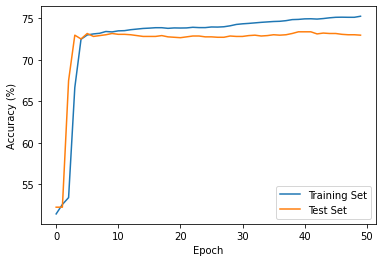

Threshold 0.05, Model 90
Training with Seed 90


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.09it/s]


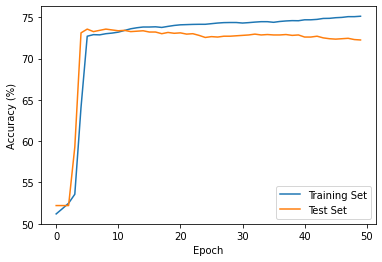

Threshold 0.05, Model 91
Training with Seed 91


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.01it/s]


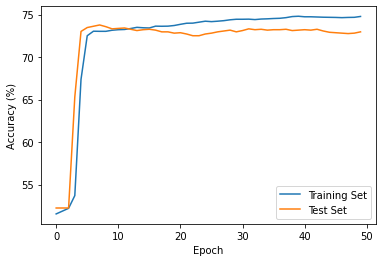

Threshold 0.05, Model 92
Training with Seed 92


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.80it/s]


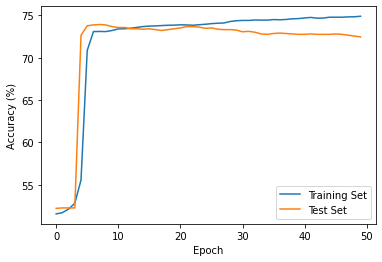

Threshold 0.05, Model 93
Training with Seed 93


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.84it/s]


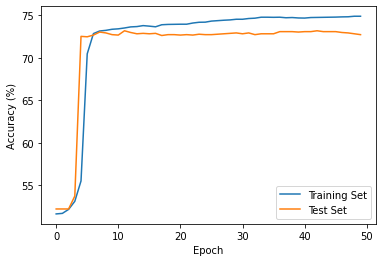

Threshold 0.05, Model 94
Training with Seed 94


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.98it/s]


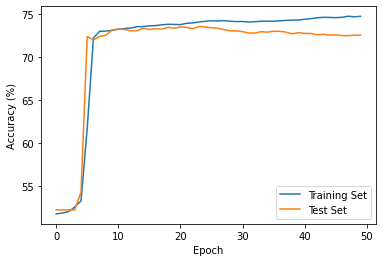

Threshold 0.05, Model 95
Training with Seed 95


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.10it/s]


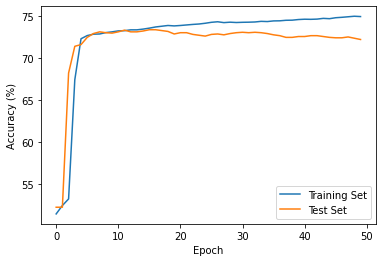

Threshold 0.05, Model 96
Training with Seed 96


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.85it/s]


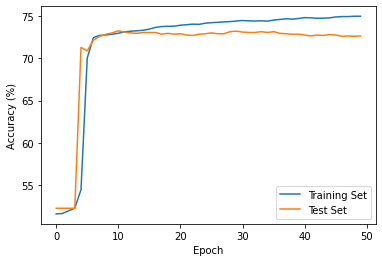

Threshold 0.05, Model 97
Training with Seed 97


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.86it/s]


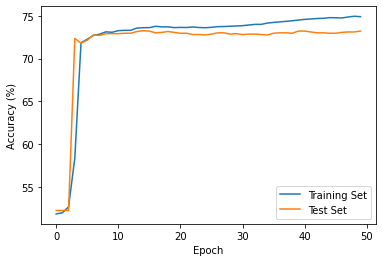

Threshold 0.05, Model 98
Training with Seed 98


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.78it/s]


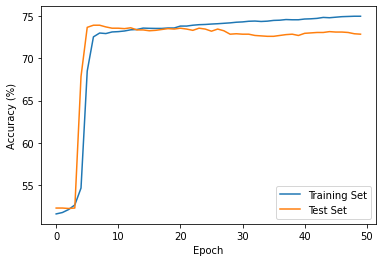

Threshold 0.05, Model 99
Training with Seed 99


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.80it/s]


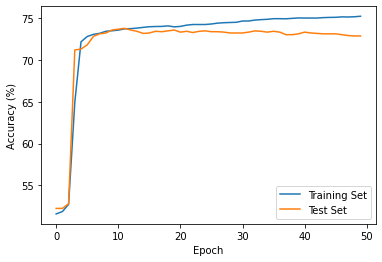

Threshold 0.1, Model 0
Training with Seed 0


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.76it/s]


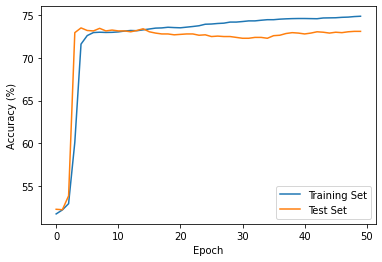

Threshold 0.1, Model 1
Training with Seed 1


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.99it/s]


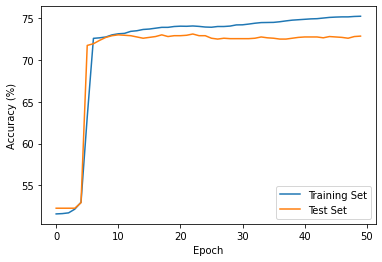

Threshold 0.1, Model 2
Training with Seed 2


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.04it/s]


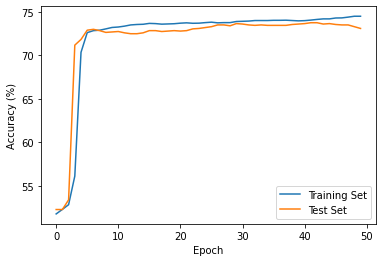

Threshold 0.1, Model 3
Training with Seed 3


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.82it/s]


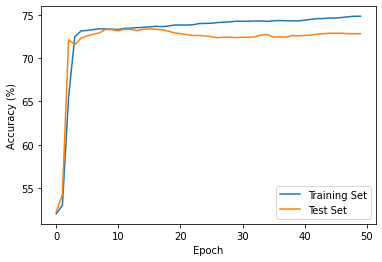

Threshold 0.1, Model 4
Training with Seed 4


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.00it/s]


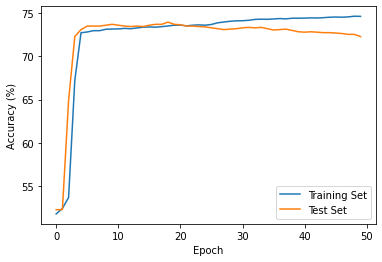

Threshold 0.1, Model 5
Training with Seed 5


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.07it/s]


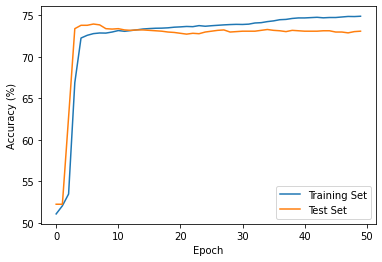

Threshold 0.1, Model 6
Training with Seed 6


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.06it/s]


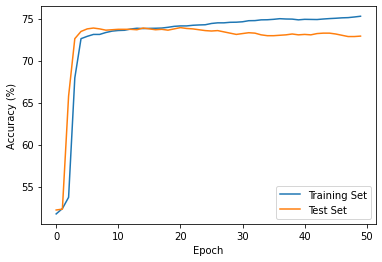

Threshold 0.1, Model 7
Training with Seed 7


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.97it/s]


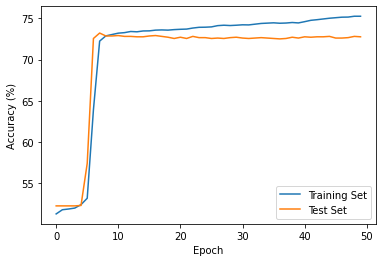

Threshold 0.1, Model 8
Training with Seed 8


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.04it/s]


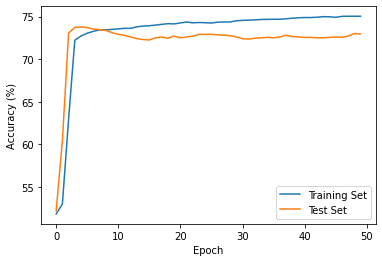

Threshold 0.1, Model 9
Training with Seed 9


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.97it/s]


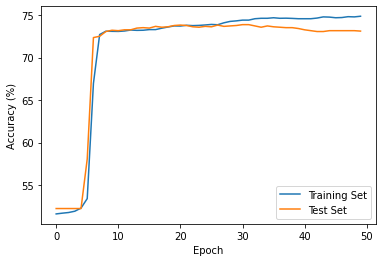

Threshold 0.1, Model 10
Training with Seed 10


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.93it/s]


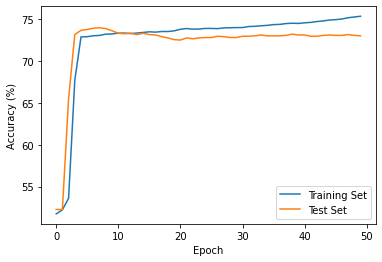

Threshold 0.1, Model 11
Training with Seed 11


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.88it/s]


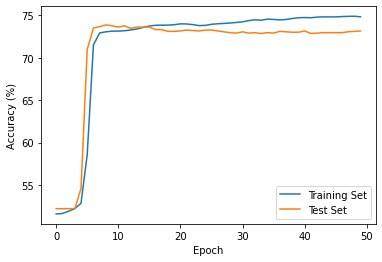

Threshold 0.1, Model 12
Training with Seed 12


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.87it/s]


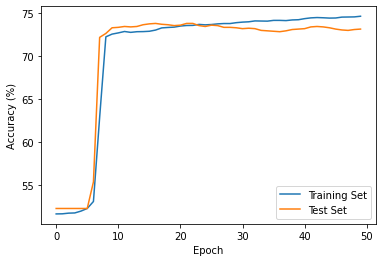

Threshold 0.1, Model 13
Training with Seed 13


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.86it/s]


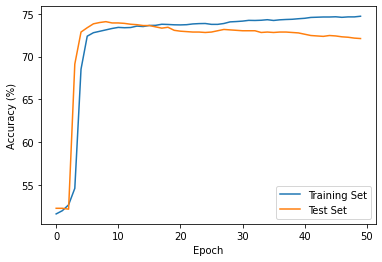

Threshold 0.1, Model 14
Training with Seed 14


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.83it/s]


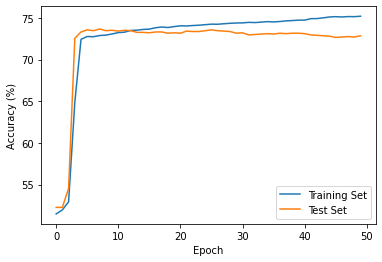

Threshold 0.1, Model 15
Training with Seed 15


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.82it/s]


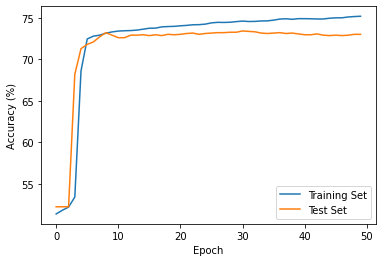

Threshold 0.1, Model 16
Training with Seed 16


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.91it/s]


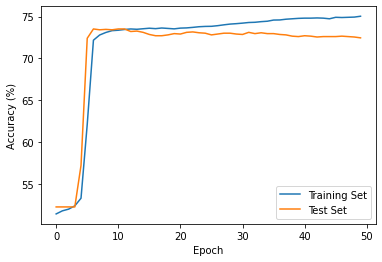

Threshold 0.1, Model 17
Training with Seed 17


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.77it/s]


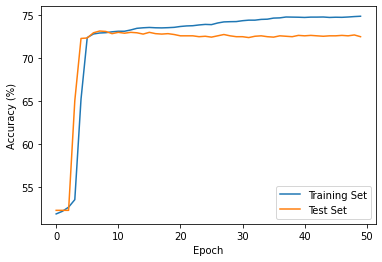

Threshold 0.1, Model 18
Training with Seed 18


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.93it/s]


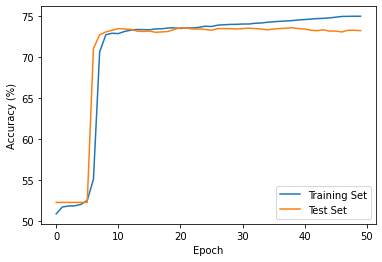

Threshold 0.1, Model 19
Training with Seed 19


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.03it/s]


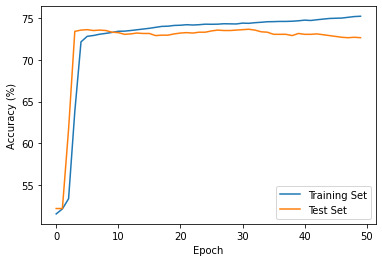

Threshold 0.1, Model 20
Training with Seed 20


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.02it/s]


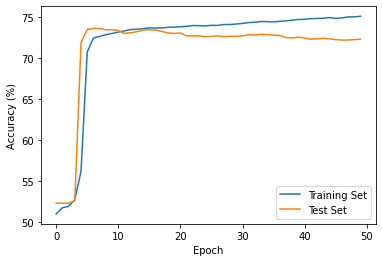

Threshold 0.1, Model 21
Training with Seed 21


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.02it/s]


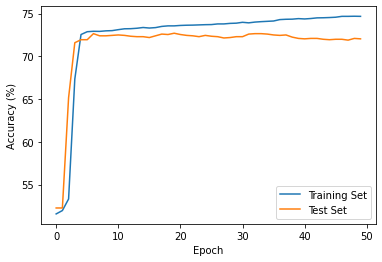

Threshold 0.1, Model 22
Training with Seed 22


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.02it/s]


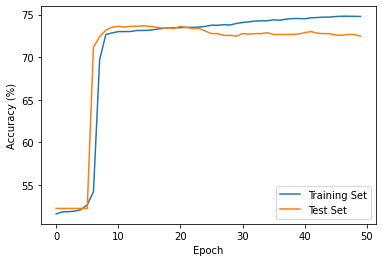

Threshold 0.1, Model 23
Training with Seed 23


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.05it/s]


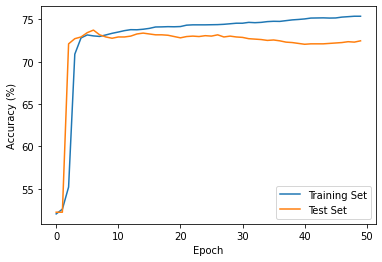

Threshold 0.1, Model 24
Training with Seed 24


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.06it/s]


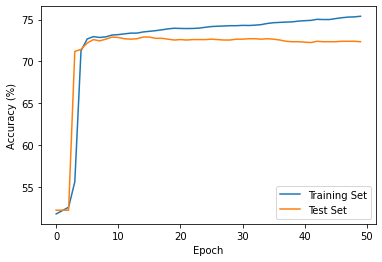

Threshold 0.1, Model 25
Training with Seed 25


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.00it/s]


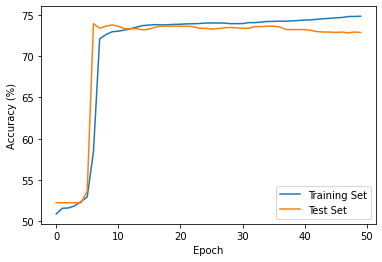

Threshold 0.1, Model 26
Training with Seed 26


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.07it/s]


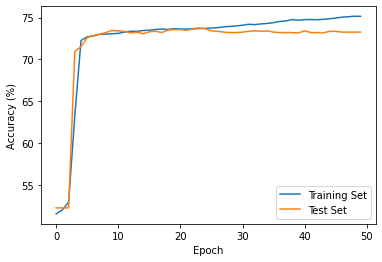

Threshold 0.1, Model 27
Training with Seed 27


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.81it/s]


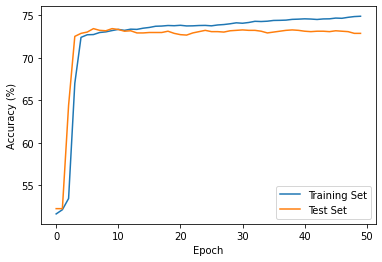

Threshold 0.1, Model 28
Training with Seed 28


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.67it/s]


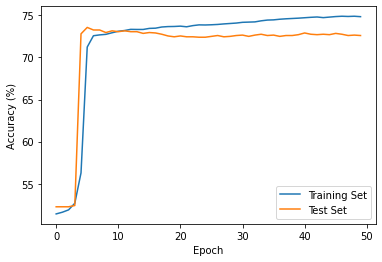

Threshold 0.1, Model 29
Training with Seed 29


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.80it/s]


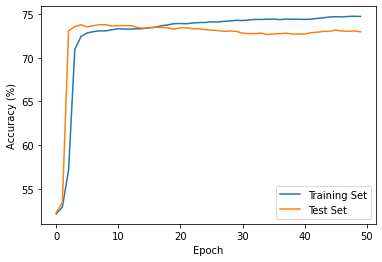

Threshold 0.1, Model 30
Training with Seed 30


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.73it/s]


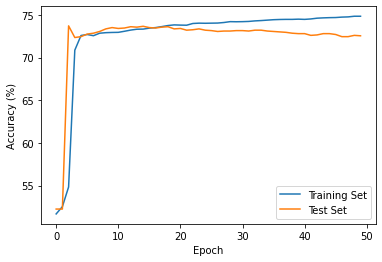

Threshold 0.1, Model 31
Training with Seed 31


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.98it/s]


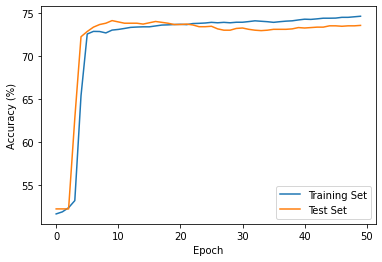

Threshold 0.1, Model 32
Training with Seed 32


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.86it/s]


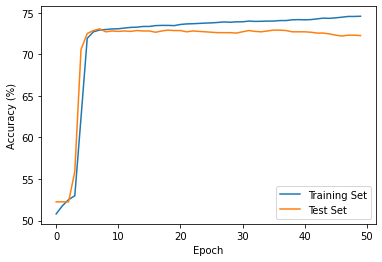

Threshold 0.1, Model 33
Training with Seed 33


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.70it/s]


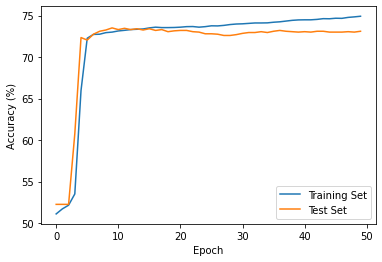

Threshold 0.1, Model 34
Training with Seed 34


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.69it/s]


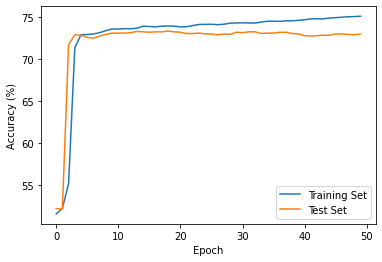

Threshold 0.1, Model 35
Training with Seed 35


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.90it/s]


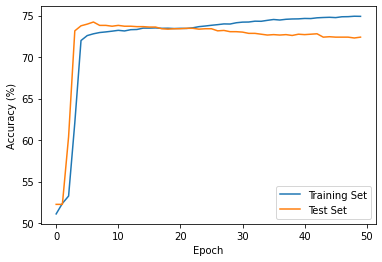

Threshold 0.1, Model 36
Training with Seed 36


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.78it/s]


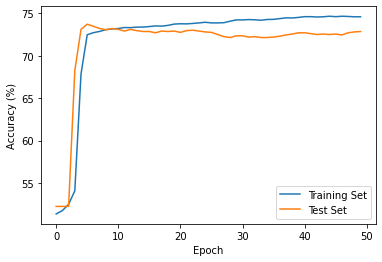

Threshold 0.1, Model 37
Training with Seed 37


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.77it/s]


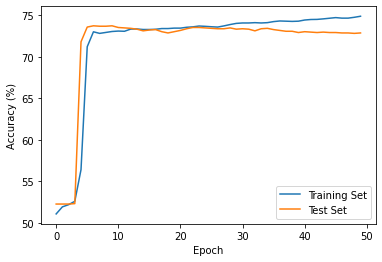

Threshold 0.1, Model 38
Training with Seed 38


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.97it/s]


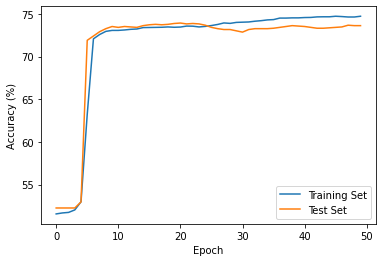

Threshold 0.1, Model 39
Training with Seed 39


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.97it/s]


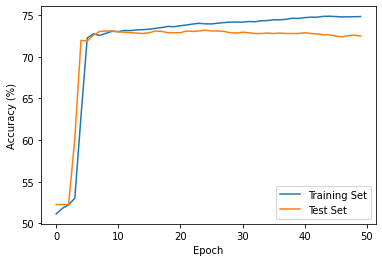

Threshold 0.1, Model 40
Training with Seed 40


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.05it/s]


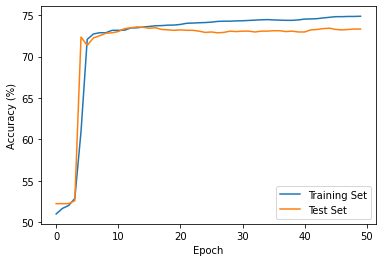

Threshold 0.1, Model 41
Training with Seed 41


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.02it/s]


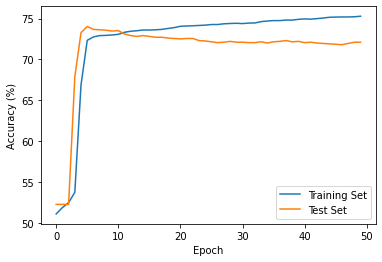

Threshold 0.1, Model 42
Training with Seed 42


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.05it/s]


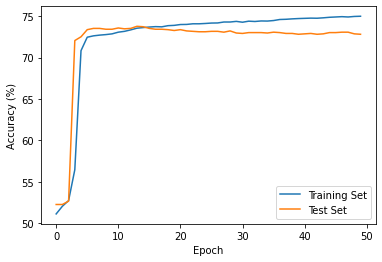

Threshold 0.1, Model 43
Training with Seed 43


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.05it/s]


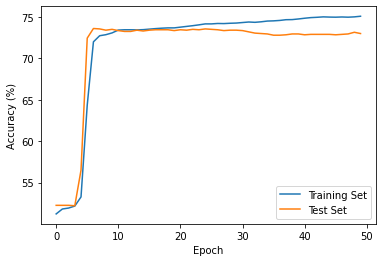

Threshold 0.1, Model 44
Training with Seed 44


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.04it/s]


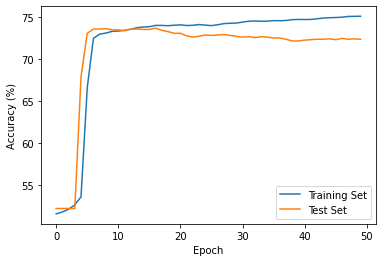

Threshold 0.1, Model 45
Training with Seed 45


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.01it/s]


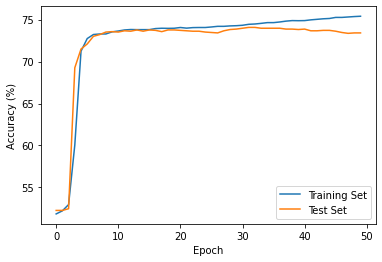

Threshold 0.1, Model 46
Training with Seed 46


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.73it/s]


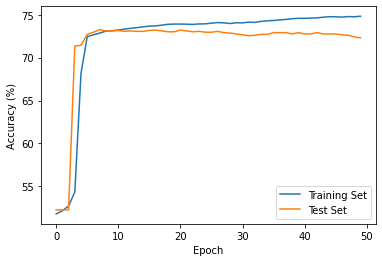

Threshold 0.1, Model 47
Training with Seed 47


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.81it/s]


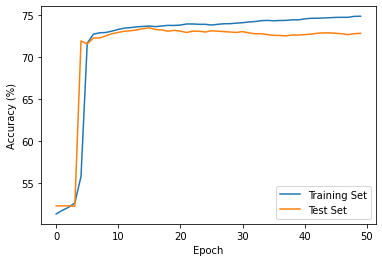

Threshold 0.1, Model 48
Training with Seed 48


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.90it/s]


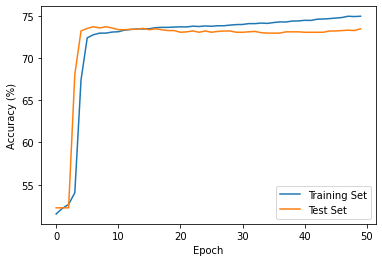

Threshold 0.1, Model 49
Training with Seed 49


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.84it/s]


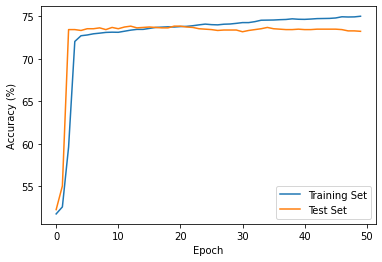

Threshold 0.1, Model 50
Training with Seed 50


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.86it/s]


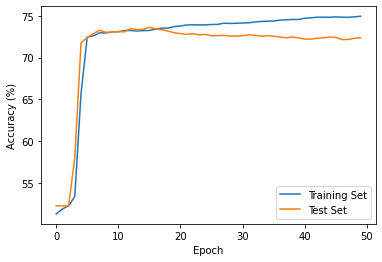

Threshold 0.1, Model 51
Training with Seed 51


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.88it/s]


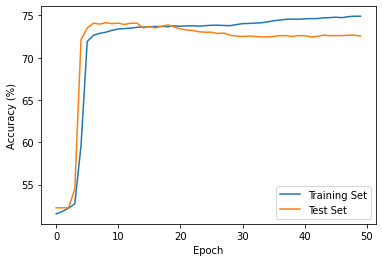

Threshold 0.1, Model 52
Training with Seed 52


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.75it/s]


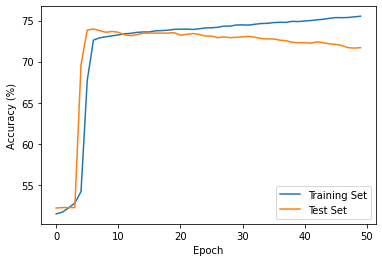

Threshold 0.1, Model 53
Training with Seed 53


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.78it/s]


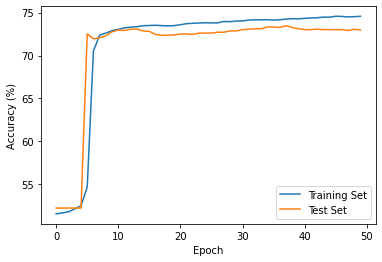

Threshold 0.1, Model 54
Training with Seed 54


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.84it/s]


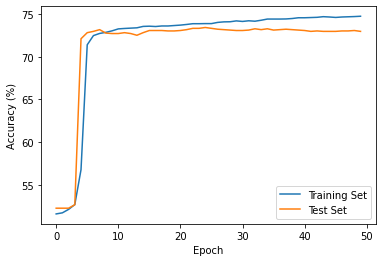

Threshold 0.1, Model 55
Training with Seed 55


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.87it/s]


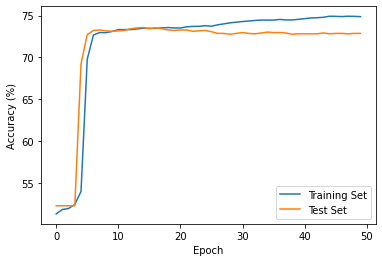

Threshold 0.1, Model 56
Training with Seed 56


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.00it/s]


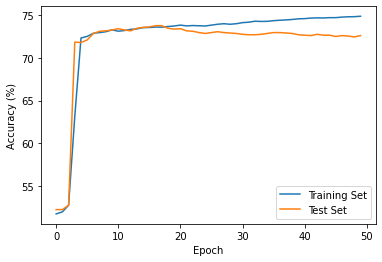

Threshold 0.1, Model 57
Training with Seed 57


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.86it/s]


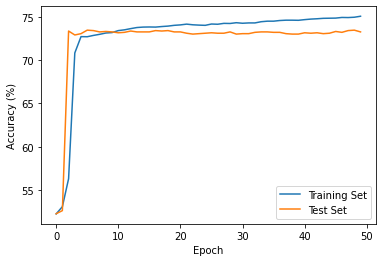

Threshold 0.1, Model 58
Training with Seed 58


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.64it/s]


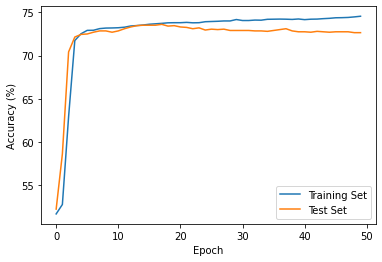

Threshold 0.1, Model 59
Training with Seed 59


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.89it/s]


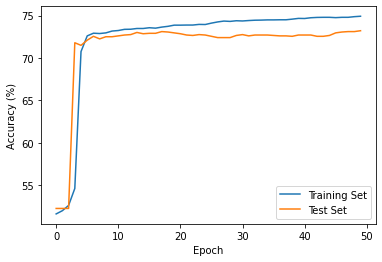

Threshold 0.1, Model 60
Training with Seed 60


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.02it/s]


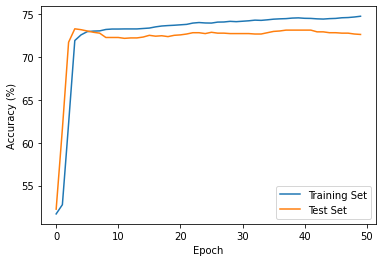

Threshold 0.1, Model 61
Training with Seed 61


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.00it/s]


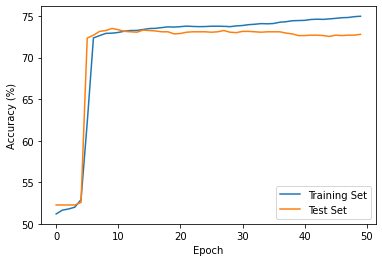

Threshold 0.1, Model 62
Training with Seed 62


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.98it/s]


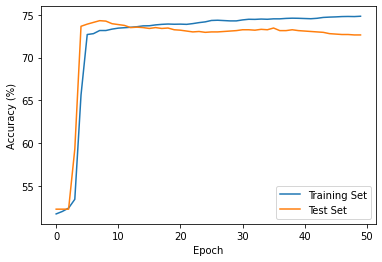

Threshold 0.1, Model 63
Training with Seed 63


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.88it/s]


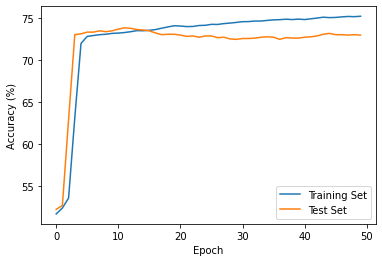

Threshold 0.1, Model 64
Training with Seed 64


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.89it/s]


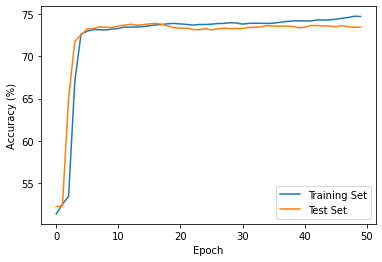

Threshold 0.1, Model 65
Training with Seed 65


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.99it/s]


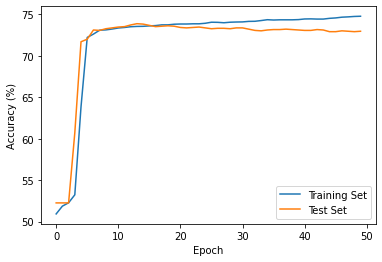

Threshold 0.1, Model 66
Training with Seed 66


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.00it/s]


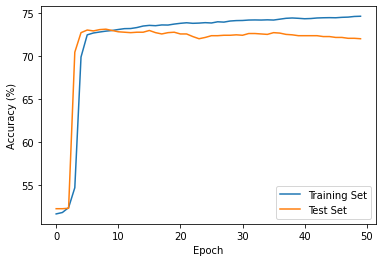

Threshold 0.1, Model 67
Training with Seed 67


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.85it/s]


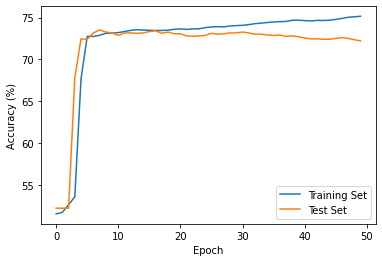

Threshold 0.1, Model 68
Training with Seed 68


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.95it/s]


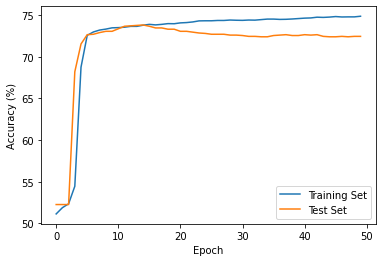

Threshold 0.1, Model 69
Training with Seed 69


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.94it/s]


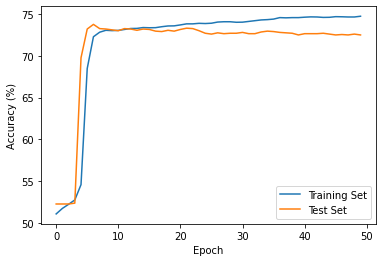

Threshold 0.1, Model 70
Training with Seed 70


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.98it/s]


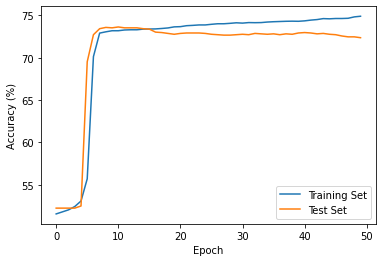

Threshold 0.1, Model 71
Training with Seed 71


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.05it/s]


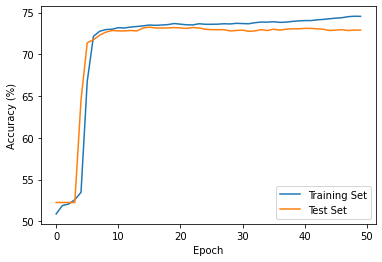

Threshold 0.1, Model 72
Training with Seed 72


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.03it/s]


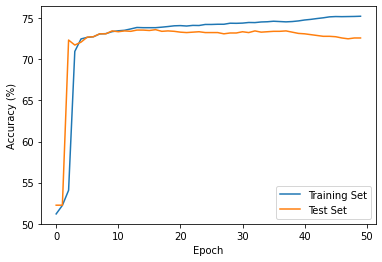

Threshold 0.1, Model 73
Training with Seed 73


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.92it/s]


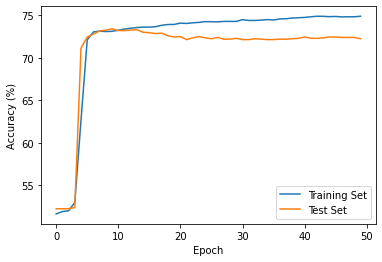

Threshold 0.1, Model 74
Training with Seed 74


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.06it/s]


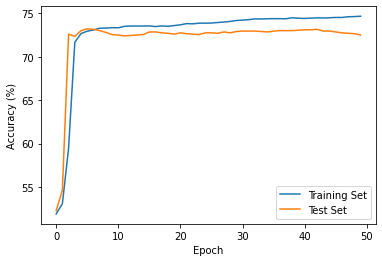

Threshold 0.1, Model 75
Training with Seed 75


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.11it/s]


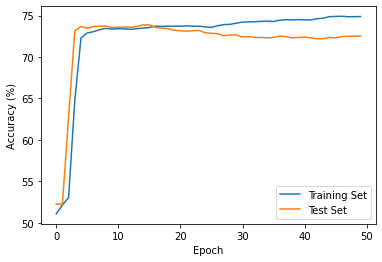

Threshold 0.1, Model 76
Training with Seed 76


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.06it/s]


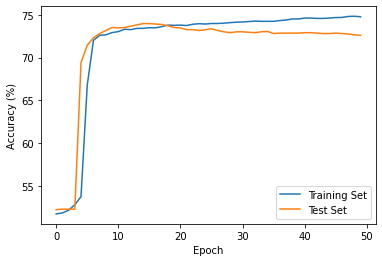

Threshold 0.1, Model 77
Training with Seed 77


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.04it/s]


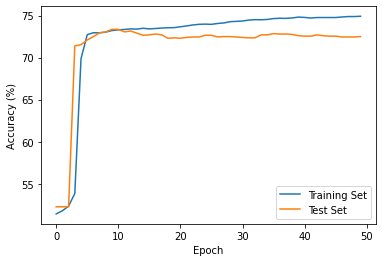

Threshold 0.1, Model 78
Training with Seed 78


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.05it/s]


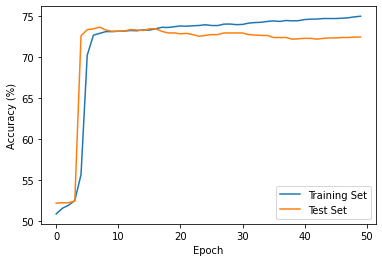

Threshold 0.1, Model 79
Training with Seed 79


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.07it/s]


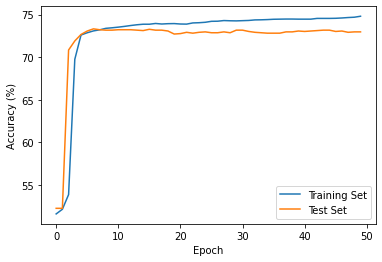

Threshold 0.1, Model 80
Training with Seed 80


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.08it/s]


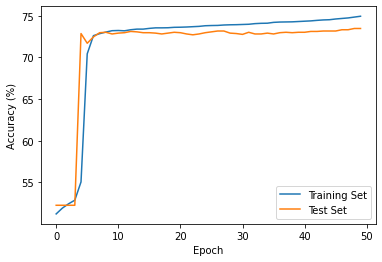

Threshold 0.1, Model 81
Training with Seed 81


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.03it/s]


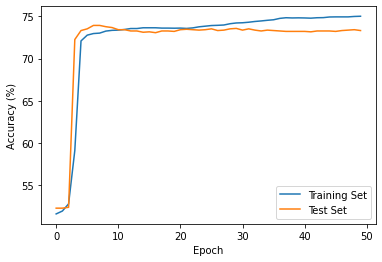

Threshold 0.1, Model 82
Training with Seed 82


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.03it/s]


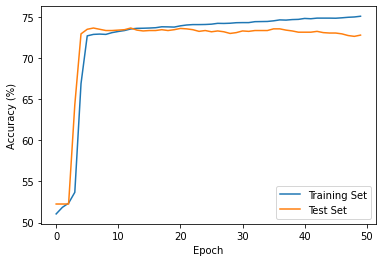

Threshold 0.1, Model 83
Training with Seed 83


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.05it/s]


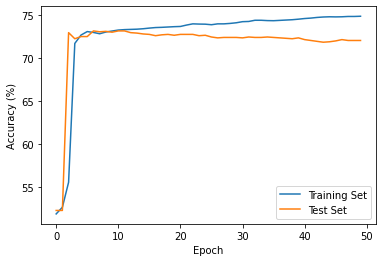

Threshold 0.1, Model 84
Training with Seed 84


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.06it/s]


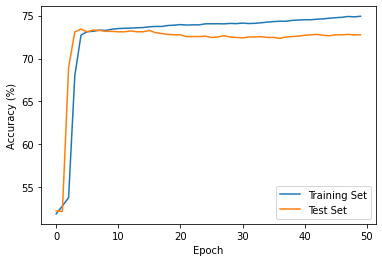

Threshold 0.1, Model 85
Training with Seed 85


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.06it/s]


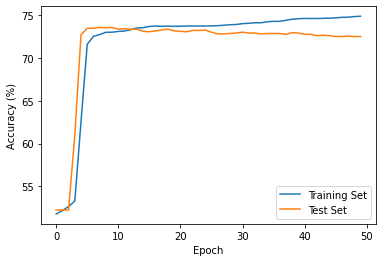

Threshold 0.1, Model 86
Training with Seed 86


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.08it/s]


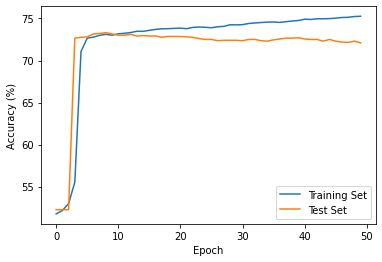

Threshold 0.1, Model 87
Training with Seed 87


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.82it/s]


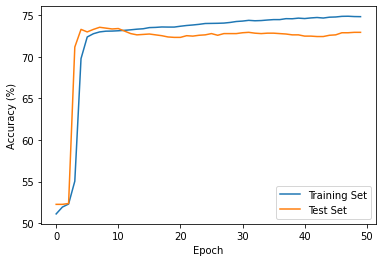

Threshold 0.1, Model 88
Training with Seed 88


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.88it/s]


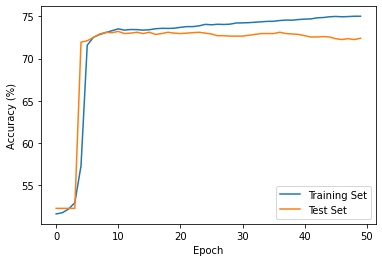

Threshold 0.1, Model 89
Training with Seed 89


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.00it/s]


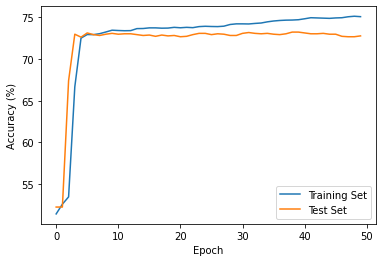

Threshold 0.1, Model 90
Training with Seed 90


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.89it/s]


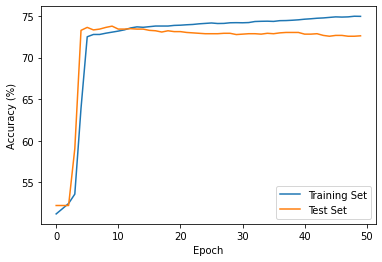

Threshold 0.1, Model 91
Training with Seed 91


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.99it/s]


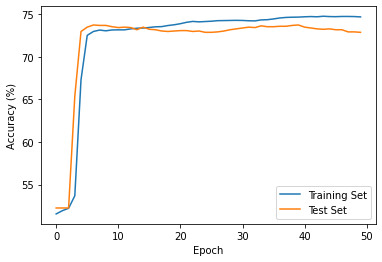

Threshold 0.1, Model 92
Training with Seed 92


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.81it/s]


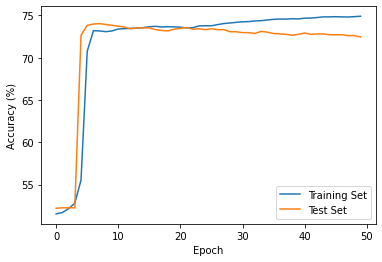

Threshold 0.1, Model 93
Training with Seed 93


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.99it/s]


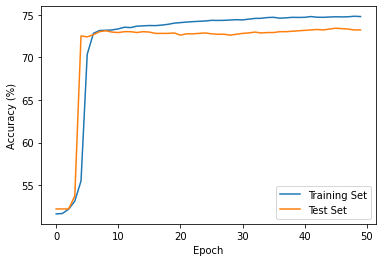

Threshold 0.1, Model 94
Training with Seed 94


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.96it/s]


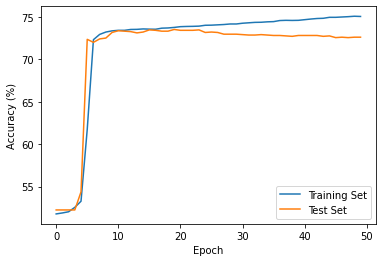

Threshold 0.1, Model 95
Training with Seed 95


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.76it/s]


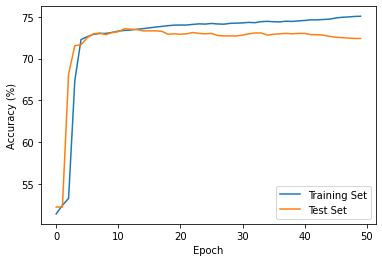

Threshold 0.1, Model 96
Training with Seed 96


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.06it/s]


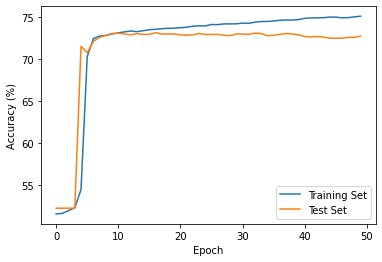

Threshold 0.1, Model 97
Training with Seed 97


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.07it/s]


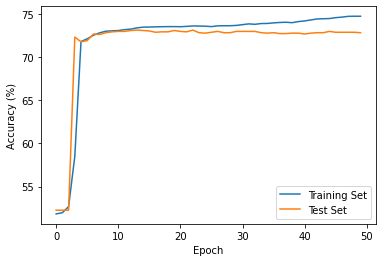

Threshold 0.1, Model 98
Training with Seed 98


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.03it/s]


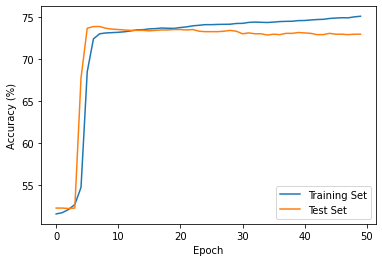

Threshold 0.1, Model 99
Training with Seed 99


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.03it/s]


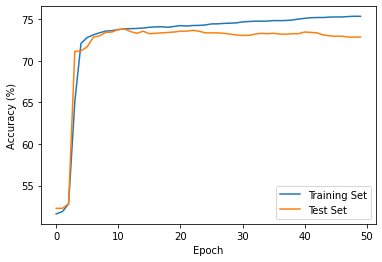

Threshold 0.2, Model 0
Training with Seed 0


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.07it/s]


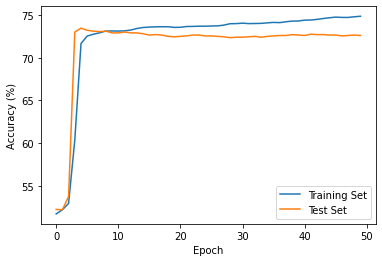

Threshold 0.2, Model 1
Training with Seed 1


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.91it/s]


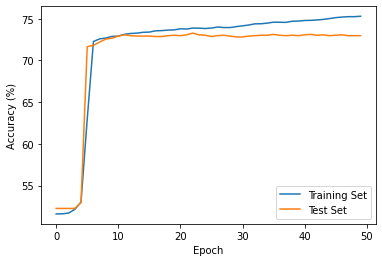

Threshold 0.2, Model 2
Training with Seed 2


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.86it/s]


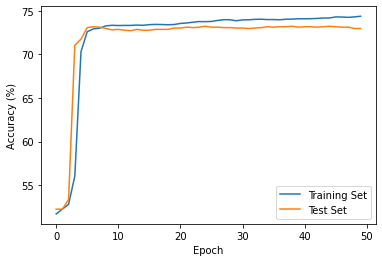

Threshold 0.2, Model 3
Training with Seed 3


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.06it/s]


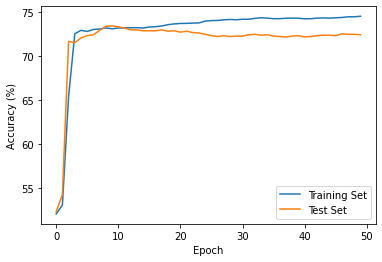

Threshold 0.2, Model 4
Training with Seed 4


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.96it/s]


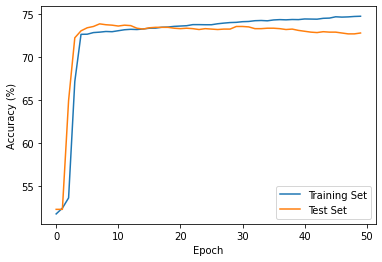

Threshold 0.2, Model 5
Training with Seed 5


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.95it/s]


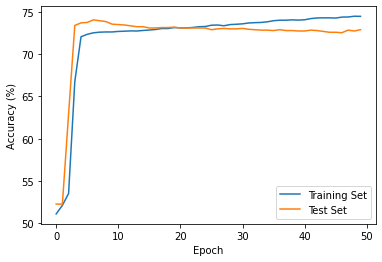

Threshold 0.2, Model 6
Training with Seed 6


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.97it/s]


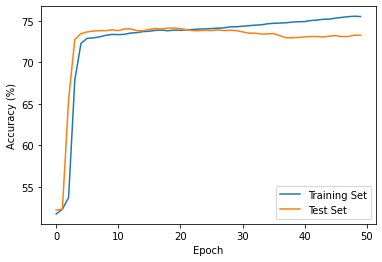

Threshold 0.2, Model 7
Training with Seed 7


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.90it/s]


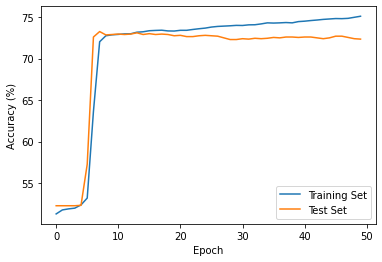

Threshold 0.2, Model 8
Training with Seed 8


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.97it/s]


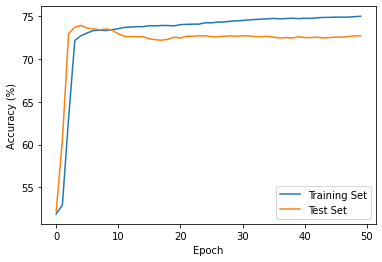

Threshold 0.2, Model 9
Training with Seed 9


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.07it/s]


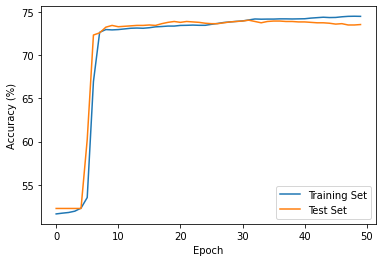

Threshold 0.2, Model 10
Training with Seed 10


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.09it/s]


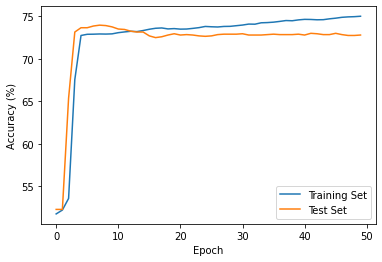

Threshold 0.2, Model 11
Training with Seed 11


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.04it/s]


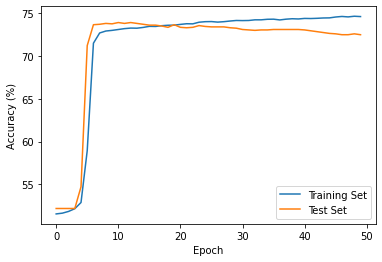

Threshold 0.2, Model 12
Training with Seed 12


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.08it/s]


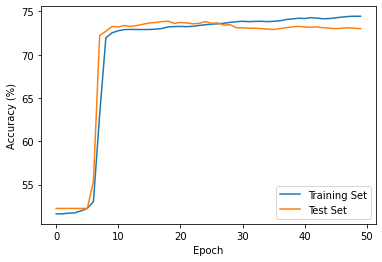

Threshold 0.2, Model 13
Training with Seed 13


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.07it/s]


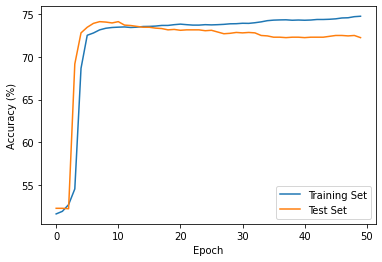

Threshold 0.2, Model 14
Training with Seed 14


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.99it/s]


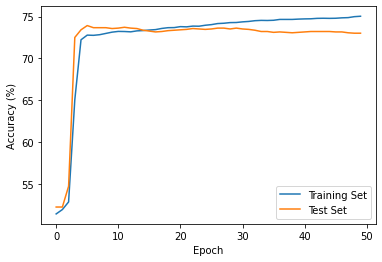

Threshold 0.2, Model 15
Training with Seed 15


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.00it/s]


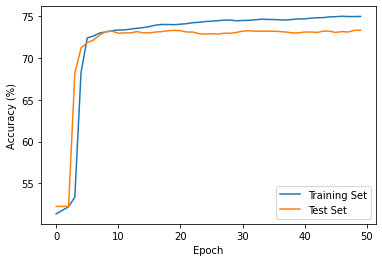

Threshold 0.2, Model 16
Training with Seed 16


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.98it/s]


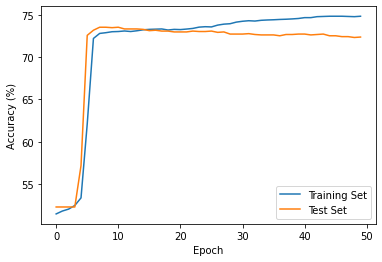

Threshold 0.2, Model 17
Training with Seed 17


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.02it/s]


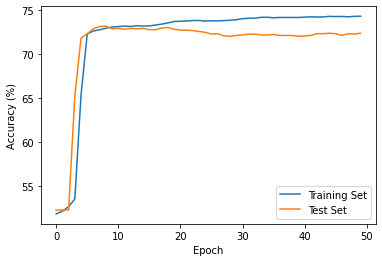

Threshold 0.2, Model 18
Training with Seed 18


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.96it/s]


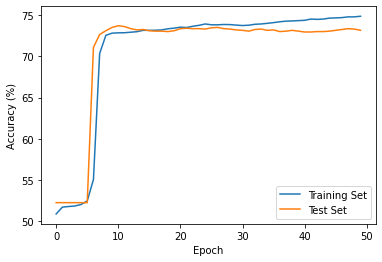

Threshold 0.2, Model 19
Training with Seed 19


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.96it/s]


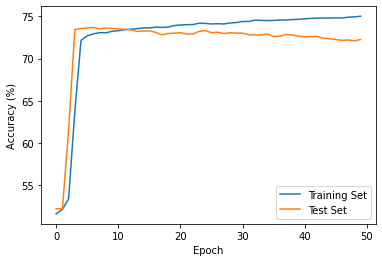

Threshold 0.2, Model 20
Training with Seed 20


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.96it/s]


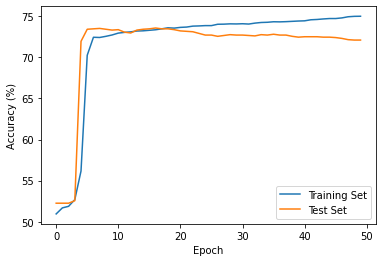

Threshold 0.2, Model 21
Training with Seed 21


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.85it/s]


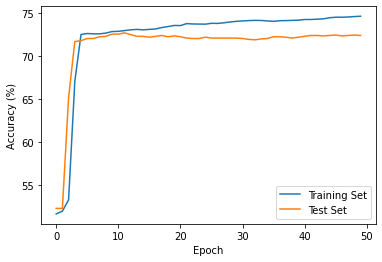

Threshold 0.2, Model 22
Training with Seed 22


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.02it/s]


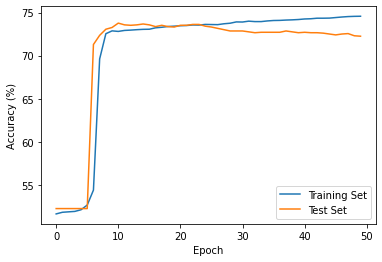

Threshold 0.2, Model 23
Training with Seed 23


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.99it/s]


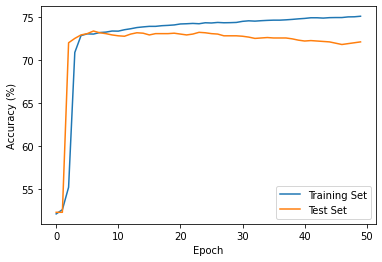

Threshold 0.2, Model 24
Training with Seed 24


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.01it/s]


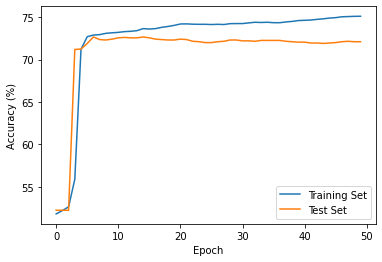

Threshold 0.2, Model 25
Training with Seed 25


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.95it/s]


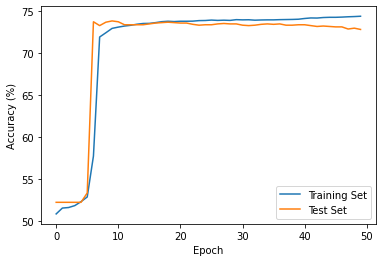

Threshold 0.2, Model 26
Training with Seed 26


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.86it/s]


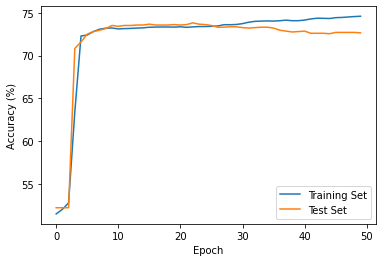

Threshold 0.2, Model 27
Training with Seed 27


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.87it/s]


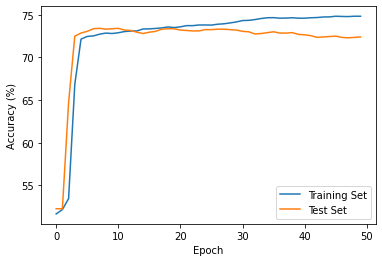

Threshold 0.2, Model 28
Training with Seed 28


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.79it/s]


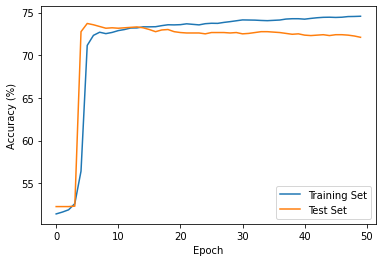

Threshold 0.2, Model 29
Training with Seed 29


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.80it/s]


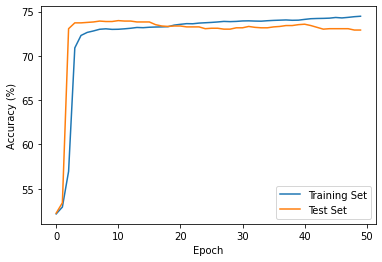

Threshold 0.2, Model 30
Training with Seed 30


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.94it/s]


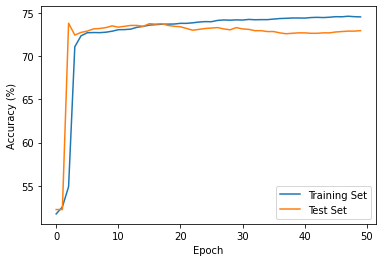

Threshold 0.2, Model 31
Training with Seed 31


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.96it/s]


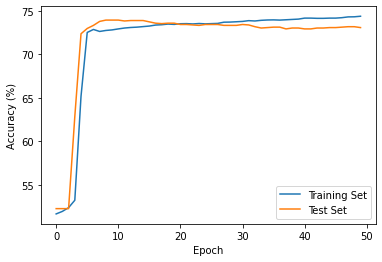

Threshold 0.2, Model 32
Training with Seed 32


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.98it/s]


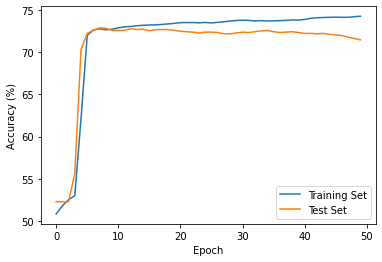

Threshold 0.2, Model 33
Training with Seed 33


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.05it/s]


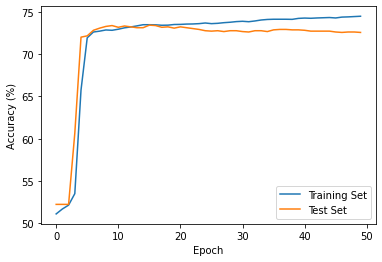

Threshold 0.2, Model 34
Training with Seed 34


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.09it/s]


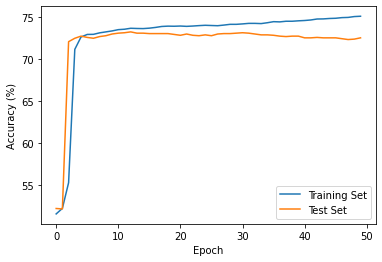

Threshold 0.2, Model 35
Training with Seed 35


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.05it/s]


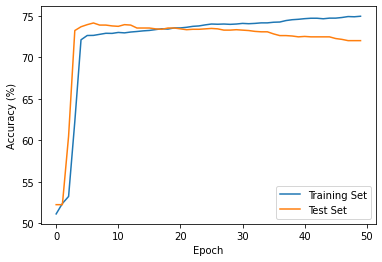

Threshold 0.2, Model 36
Training with Seed 36


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.08it/s]


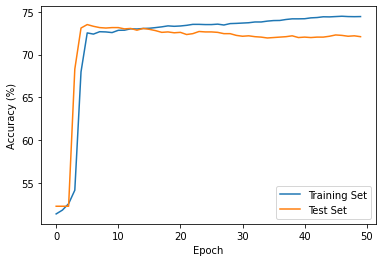

Threshold 0.2, Model 37
Training with Seed 37


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.90it/s]


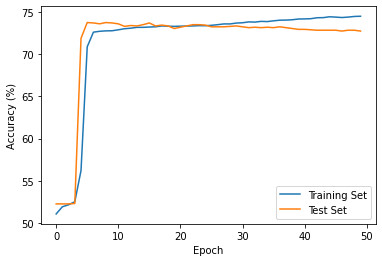

Threshold 0.2, Model 38
Training with Seed 38


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.86it/s]


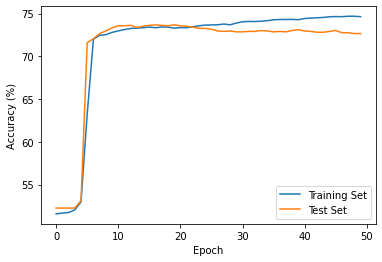

Threshold 0.2, Model 39
Training with Seed 39


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.06it/s]


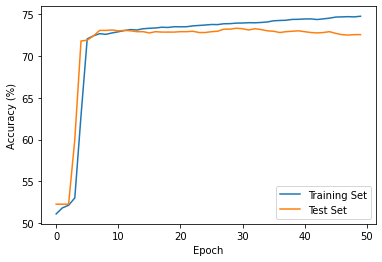

Threshold 0.2, Model 40
Training with Seed 40


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.88it/s]


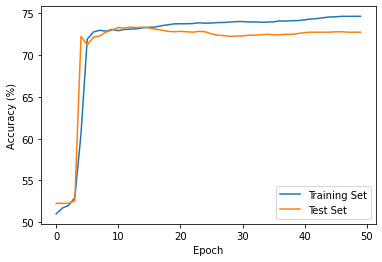

Threshold 0.2, Model 41
Training with Seed 41


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.02it/s]


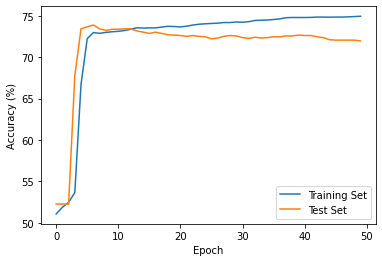

Threshold 0.2, Model 42
Training with Seed 42


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.98it/s]


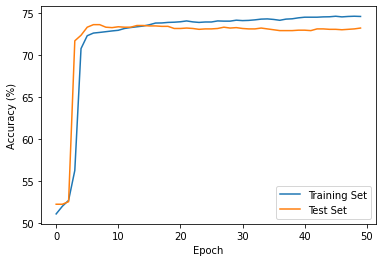

Threshold 0.2, Model 43
Training with Seed 43


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.95it/s]


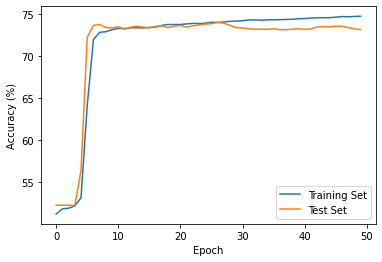

Threshold 0.2, Model 44
Training with Seed 44


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.84it/s]


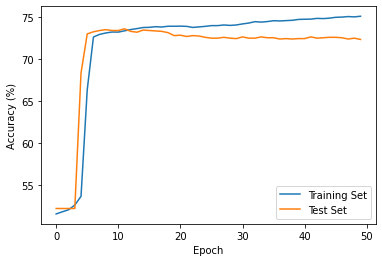

Threshold 0.2, Model 45
Training with Seed 45


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.80it/s]


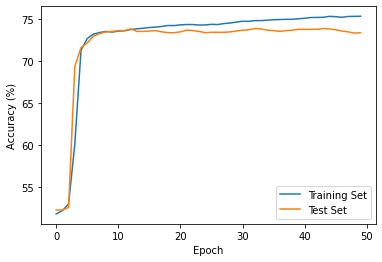

Threshold 0.2, Model 46
Training with Seed 46


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.68it/s]


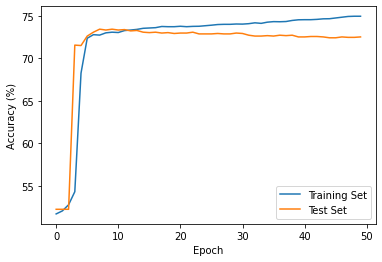

Threshold 0.2, Model 47
Training with Seed 47


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.67it/s]


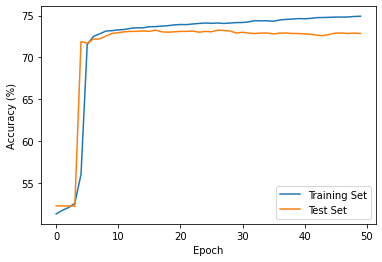

Threshold 0.2, Model 48
Training with Seed 48


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.07it/s]


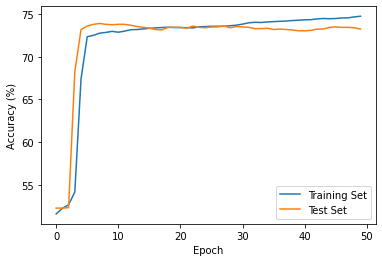

Threshold 0.2, Model 49
Training with Seed 49


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.74it/s]


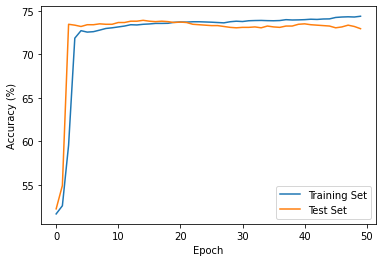

Threshold 0.2, Model 50
Training with Seed 50


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.72it/s]


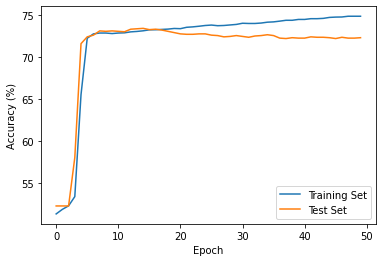

Threshold 0.2, Model 51
Training with Seed 51


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.92it/s]


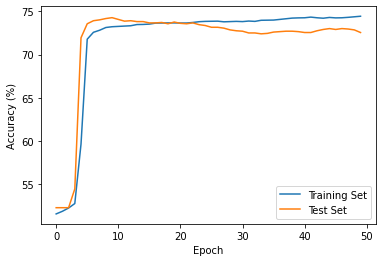

Threshold 0.2, Model 52
Training with Seed 52


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.81it/s]


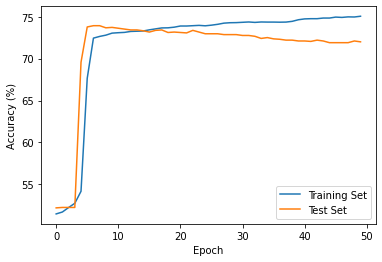

Threshold 0.2, Model 53
Training with Seed 53


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.74it/s]


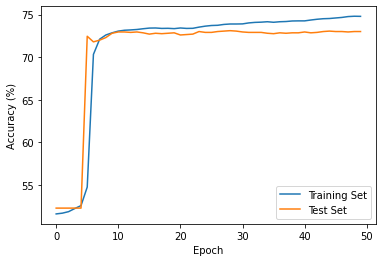

Threshold 0.2, Model 54
Training with Seed 54


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.99it/s]


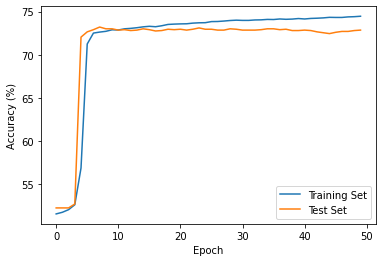

Threshold 0.2, Model 55
Training with Seed 55


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.89it/s]


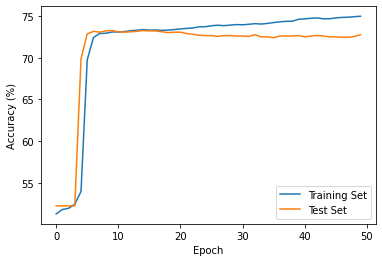

Threshold 0.2, Model 56
Training with Seed 56


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.94it/s]


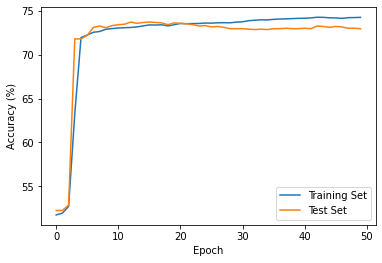

Threshold 0.2, Model 57
Training with Seed 57


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.96it/s]


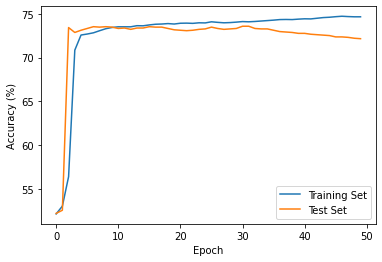

Threshold 0.2, Model 58
Training with Seed 58


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.96it/s]


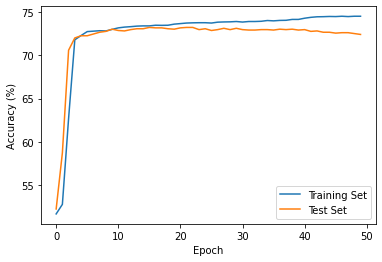

Threshold 0.2, Model 59
Training with Seed 59


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.95it/s]


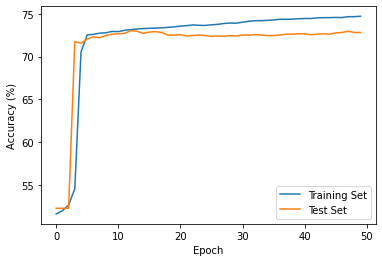

Threshold 0.2, Model 60
Training with Seed 60


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.66it/s]


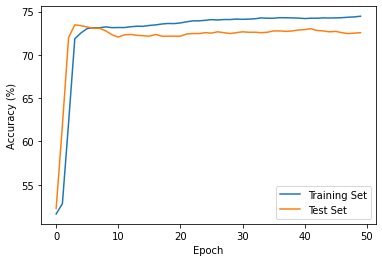

Threshold 0.2, Model 61
Training with Seed 61


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.89it/s]


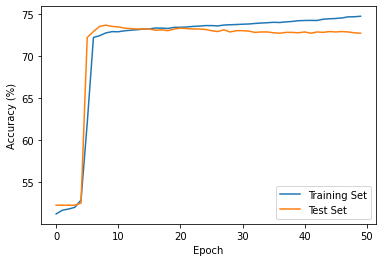

Threshold 0.2, Model 62
Training with Seed 62


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.01it/s]


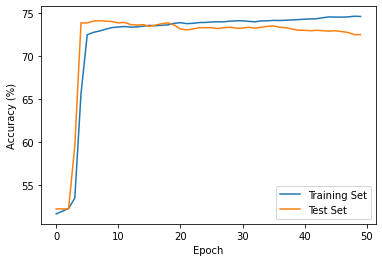

Threshold 0.2, Model 63
Training with Seed 63


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.88it/s]


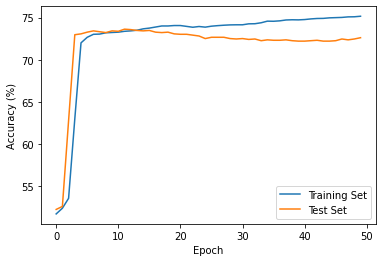

Threshold 0.2, Model 64
Training with Seed 64


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.96it/s]


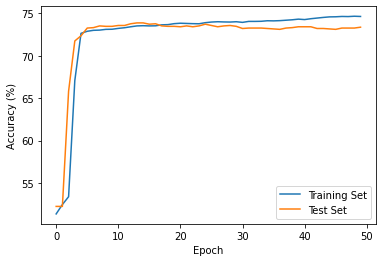

Threshold 0.2, Model 65
Training with Seed 65


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.91it/s]


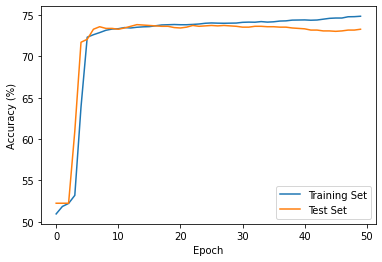

Threshold 0.2, Model 66
Training with Seed 66


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.96it/s]


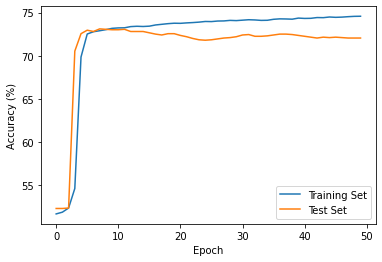

Threshold 0.2, Model 67
Training with Seed 67


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.98it/s]


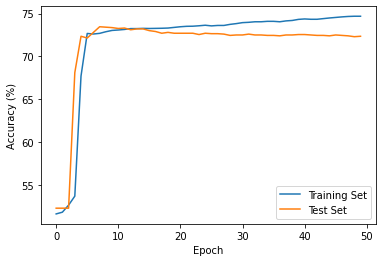

Threshold 0.2, Model 68
Training with Seed 68


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.99it/s]


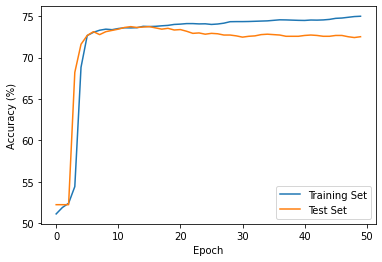

Threshold 0.2, Model 69
Training with Seed 69


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.99it/s]


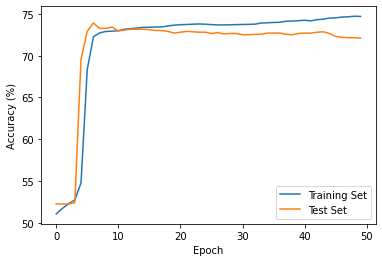

Threshold 0.2, Model 70
Training with Seed 70


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.95it/s]


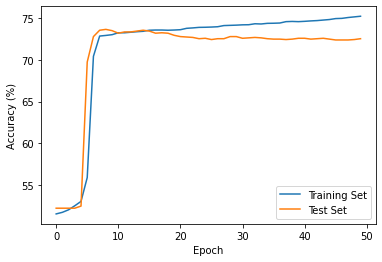

Threshold 0.2, Model 71
Training with Seed 71


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.04it/s]


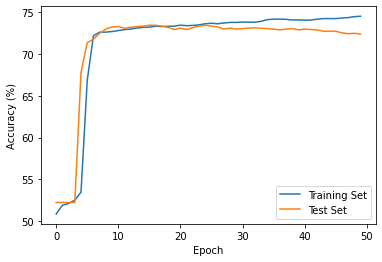

Threshold 0.2, Model 72
Training with Seed 72


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.99it/s]


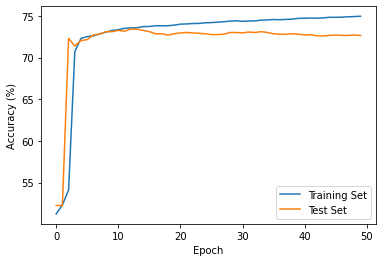

Threshold 0.2, Model 73
Training with Seed 73


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.00it/s]


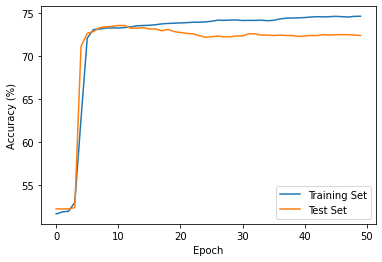

Threshold 0.2, Model 74
Training with Seed 74


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.02it/s]


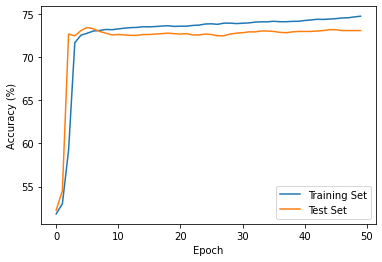

Threshold 0.2, Model 75
Training with Seed 75


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.86it/s]


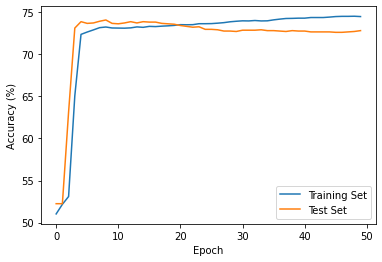

Threshold 0.2, Model 76
Training with Seed 76


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.82it/s]


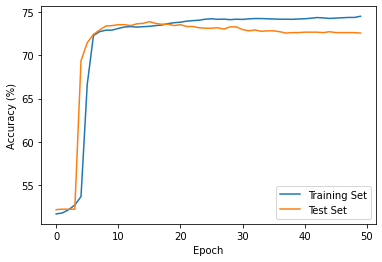

Threshold 0.2, Model 77
Training with Seed 77


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.03it/s]


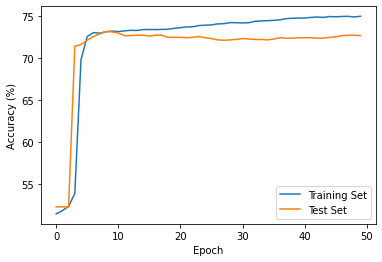

Threshold 0.2, Model 78
Training with Seed 78


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.06it/s]


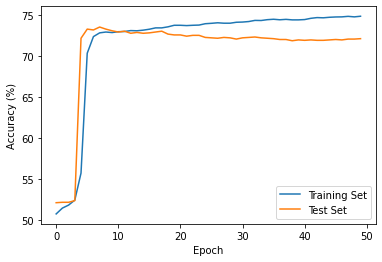

Threshold 0.2, Model 79
Training with Seed 79


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.03it/s]


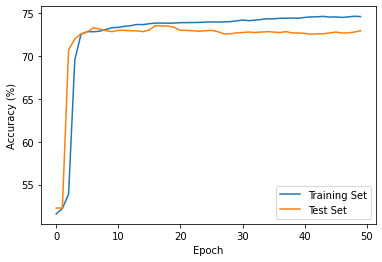

Threshold 0.2, Model 80
Training with Seed 80


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.05it/s]


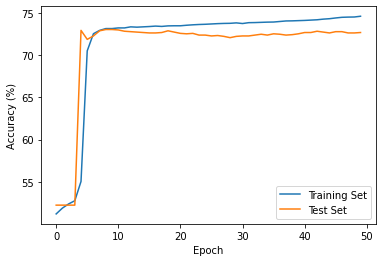

Threshold 0.2, Model 81
Training with Seed 81


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.97it/s]


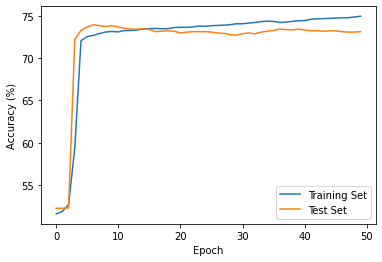

Threshold 0.2, Model 82
Training with Seed 82


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.96it/s]


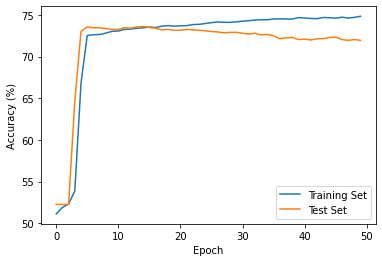

Threshold 0.2, Model 83
Training with Seed 83


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.00it/s]


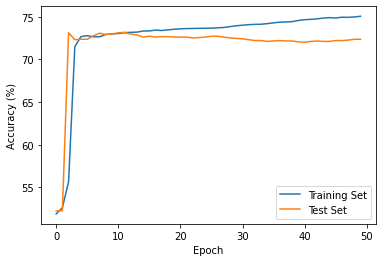

Threshold 0.2, Model 84
Training with Seed 84


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.01it/s]


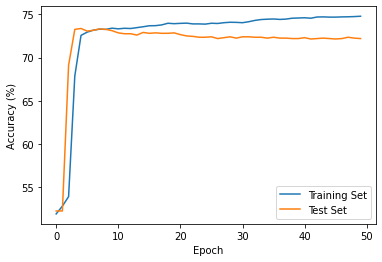

Threshold 0.2, Model 85
Training with Seed 85


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.82it/s]


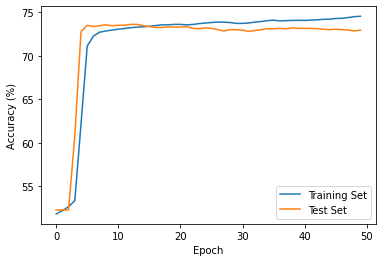

Threshold 0.2, Model 86
Training with Seed 86


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.65it/s]


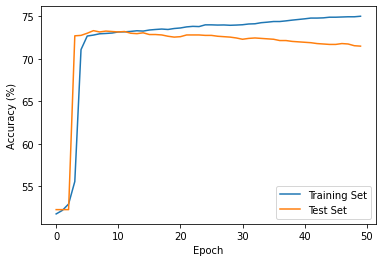

Threshold 0.2, Model 87
Training with Seed 87


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.66it/s]


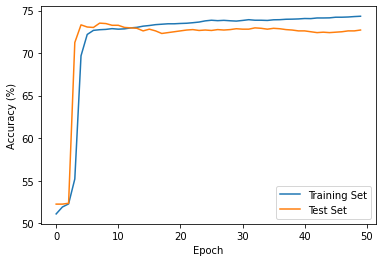

Threshold 0.2, Model 88
Training with Seed 88


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.84it/s]


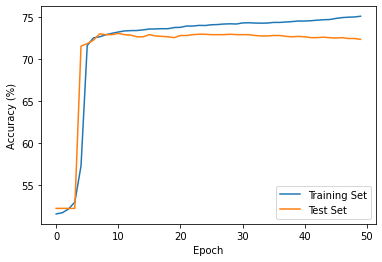

Threshold 0.2, Model 89
Training with Seed 89


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.95it/s]


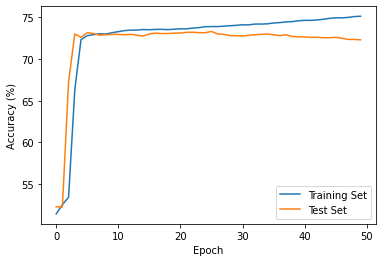

Threshold 0.2, Model 90
Training with Seed 90


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.86it/s]


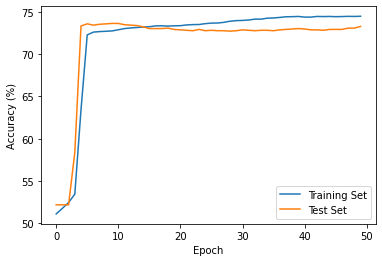

Threshold 0.2, Model 91
Training with Seed 91


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.98it/s]


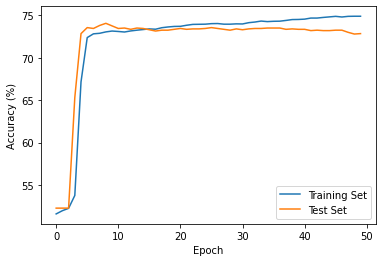

Threshold 0.2, Model 92
Training with Seed 92


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.93it/s]


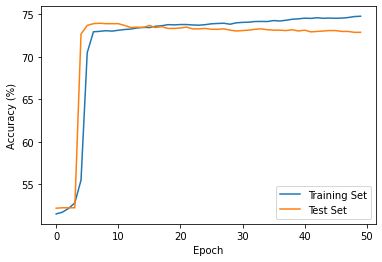

Threshold 0.2, Model 93
Training with Seed 93


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.93it/s]


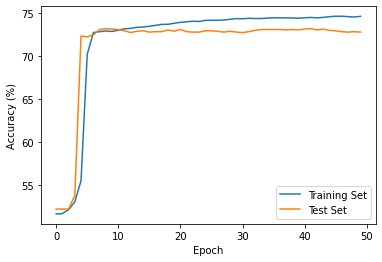

Threshold 0.2, Model 94
Training with Seed 94


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.02it/s]


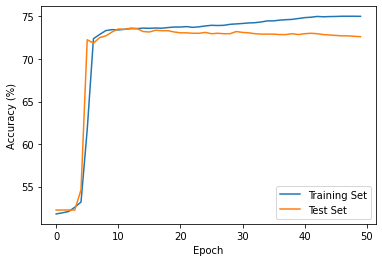

Threshold 0.2, Model 95
Training with Seed 95


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.05it/s]


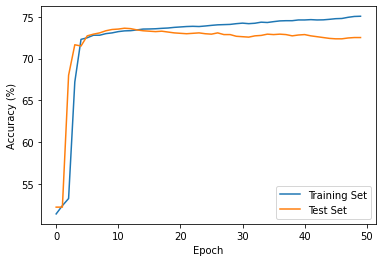

Threshold 0.2, Model 96
Training with Seed 96


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.04it/s]


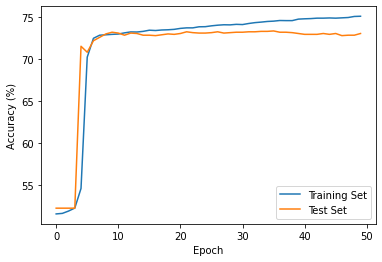

Threshold 0.2, Model 97
Training with Seed 97


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.03it/s]


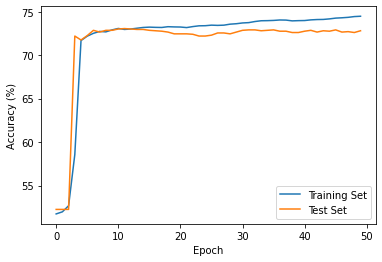

Threshold 0.2, Model 98
Training with Seed 98


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.80it/s]


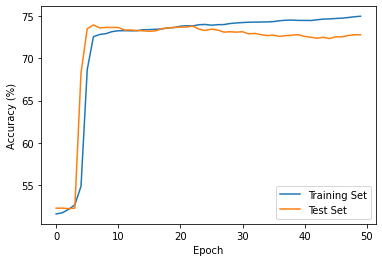

Threshold 0.2, Model 99
Training with Seed 99


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.95it/s]


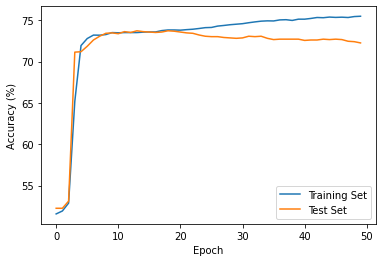

Threshold 0.3, Model 0
Training with Seed 0


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.84it/s]


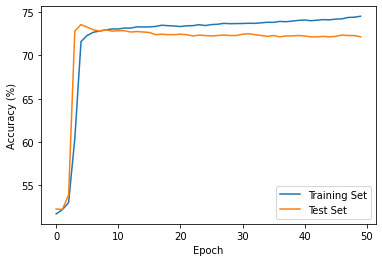

Threshold 0.3, Model 1
Training with Seed 1


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.72it/s]


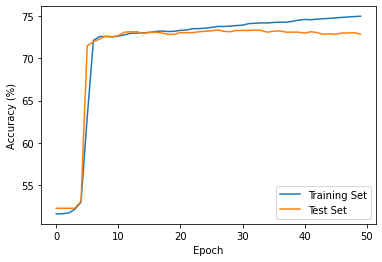

Threshold 0.3, Model 2
Training with Seed 2


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.76it/s]


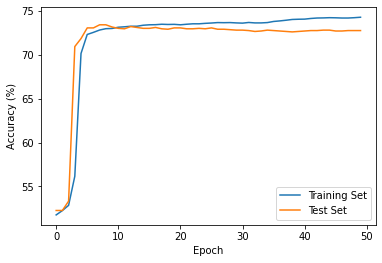

Threshold 0.3, Model 3
Training with Seed 3


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.92it/s]


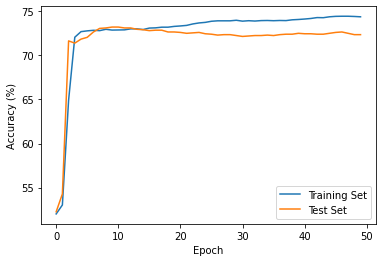

Threshold 0.3, Model 4
Training with Seed 4


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.89it/s]


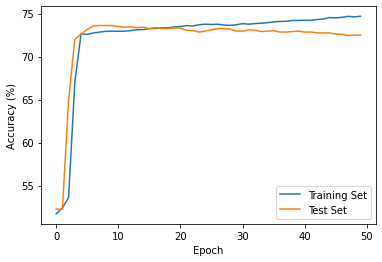

Threshold 0.3, Model 5
Training with Seed 5


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.78it/s]


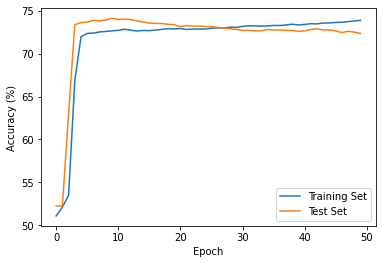

Threshold 0.3, Model 6
Training with Seed 6


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.85it/s]


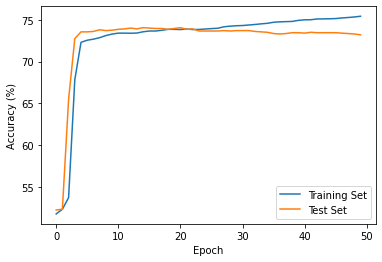

Threshold 0.3, Model 7
Training with Seed 7


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.93it/s]


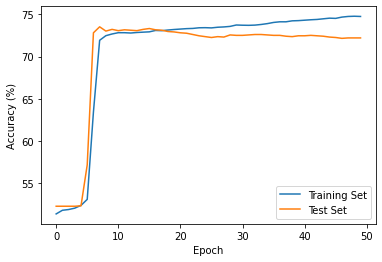

Threshold 0.3, Model 8
Training with Seed 8


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.95it/s]


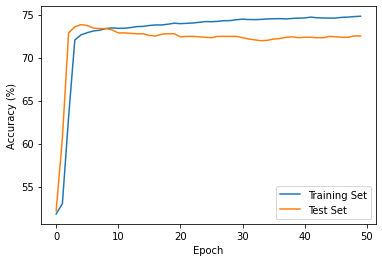

Threshold 0.3, Model 9
Training with Seed 9


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.95it/s]


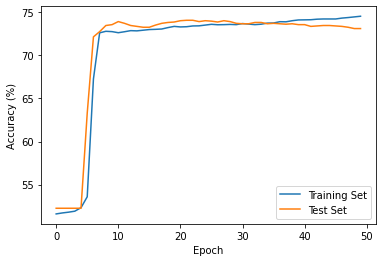

Threshold 0.3, Model 10
Training with Seed 10


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.90it/s]


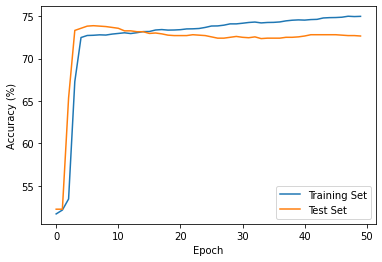

Threshold 0.3, Model 11
Training with Seed 11


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.98it/s]


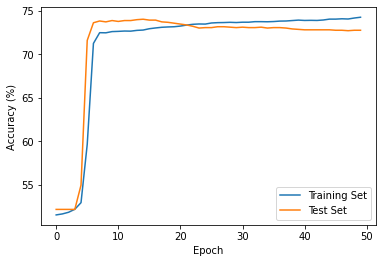

Threshold 0.3, Model 12
Training with Seed 12


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.01it/s]


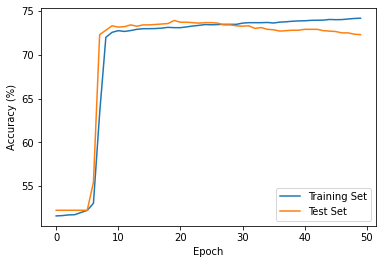

Threshold 0.3, Model 13
Training with Seed 13


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.99it/s]


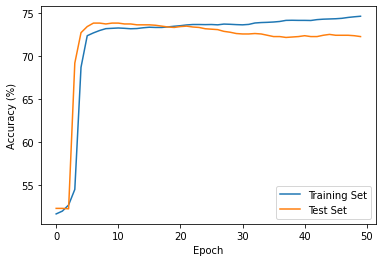

Threshold 0.3, Model 14
Training with Seed 14


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.04it/s]


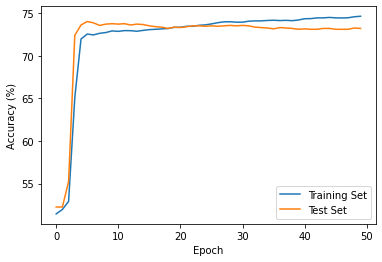

Threshold 0.3, Model 15
Training with Seed 15


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.85it/s]


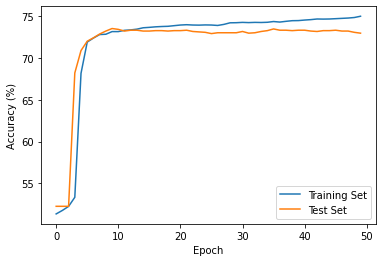

Threshold 0.3, Model 16
Training with Seed 16


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.05it/s]


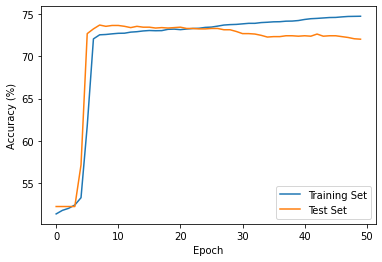

Threshold 0.3, Model 17
Training with Seed 17


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.73it/s]


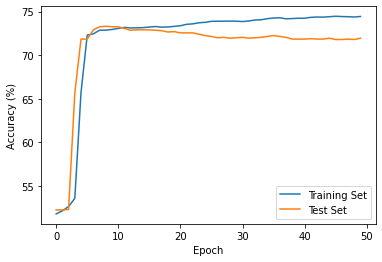

Threshold 0.3, Model 18
Training with Seed 18


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.79it/s]


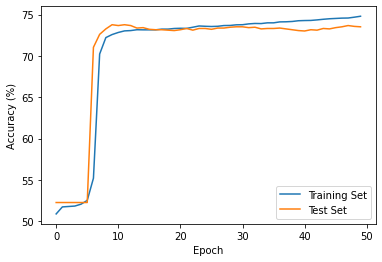

Threshold 0.3, Model 19
Training with Seed 19


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.00it/s]


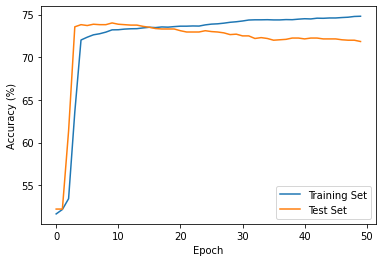

Threshold 0.3, Model 20
Training with Seed 20


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.86it/s]


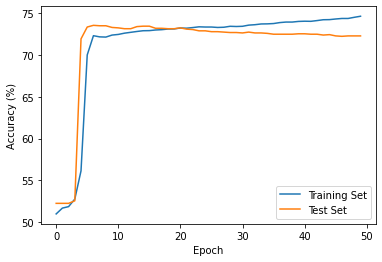

Threshold 0.3, Model 21
Training with Seed 21


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.94it/s]


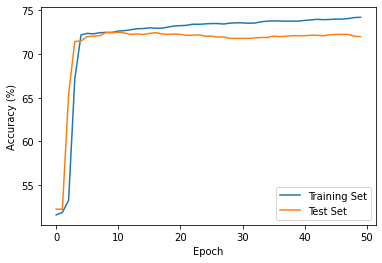

Threshold 0.3, Model 22
Training with Seed 22


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.84it/s]


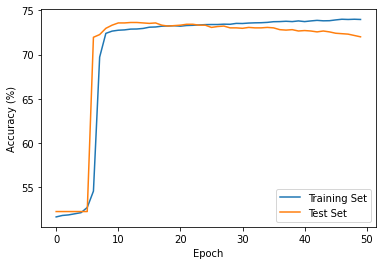

Threshold 0.3, Model 23
Training with Seed 23


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.63it/s]


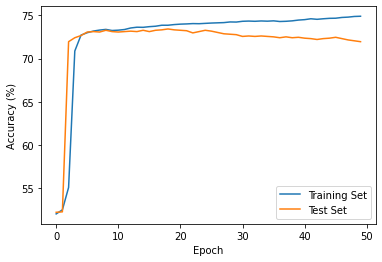

Threshold 0.3, Model 24
Training with Seed 24


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.73it/s]


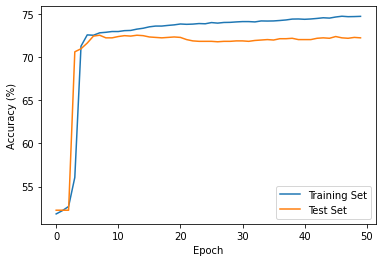

Threshold 0.3, Model 25
Training with Seed 25


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.99it/s]


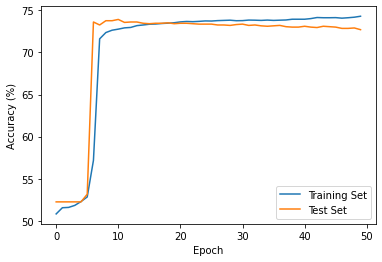

Threshold 0.3, Model 26
Training with Seed 26


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.99it/s]


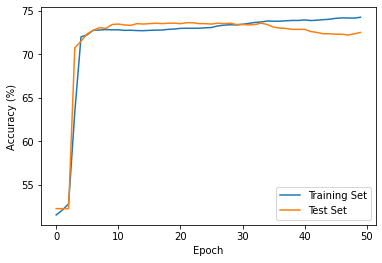

Threshold 0.3, Model 27
Training with Seed 27


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.96it/s]


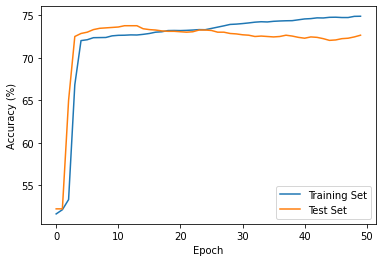

Threshold 0.3, Model 28
Training with Seed 28


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.00it/s]


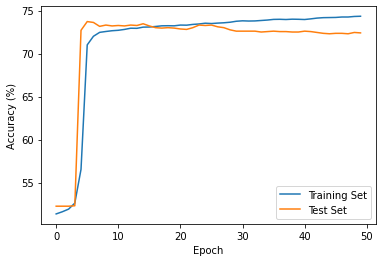

Threshold 0.3, Model 29
Training with Seed 29


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.06it/s]


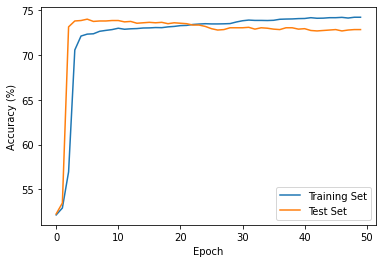

Threshold 0.3, Model 30
Training with Seed 30


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.06it/s]


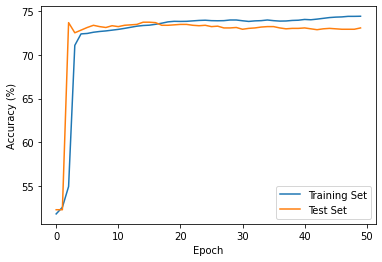

Threshold 0.3, Model 31
Training with Seed 31


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.03it/s]


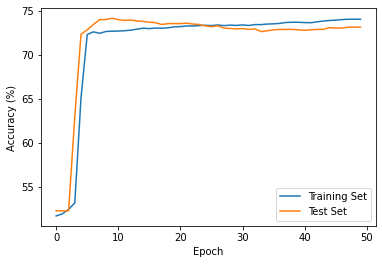

Threshold 0.3, Model 32
Training with Seed 32


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.94it/s]


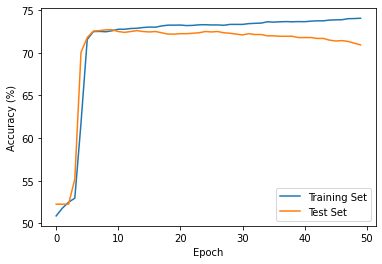

Threshold 0.3, Model 33
Training with Seed 33


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.89it/s]


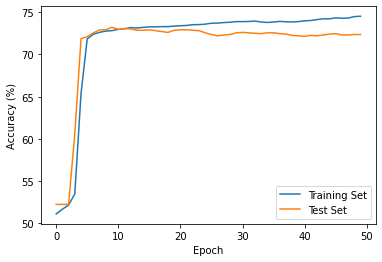

Threshold 0.3, Model 34
Training with Seed 34


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.98it/s]


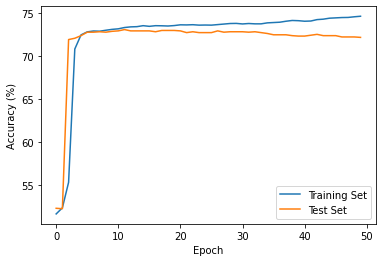

Threshold 0.3, Model 35
Training with Seed 35


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.92it/s]


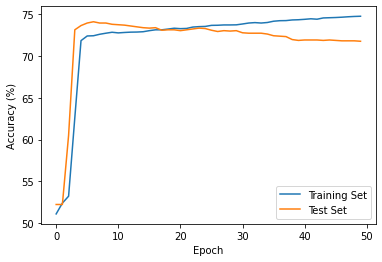

Threshold 0.3, Model 36
Training with Seed 36


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.02it/s]


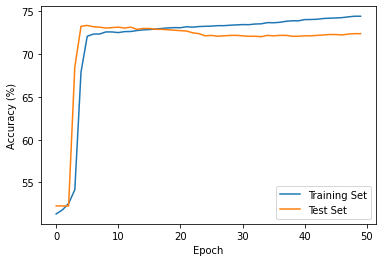

Threshold 0.3, Model 37
Training with Seed 37


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.97it/s]


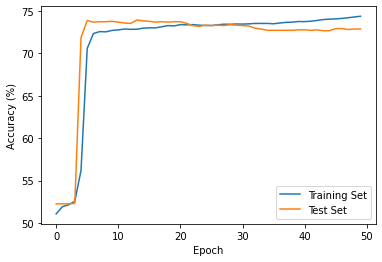

Threshold 0.3, Model 38
Training with Seed 38


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.99it/s]


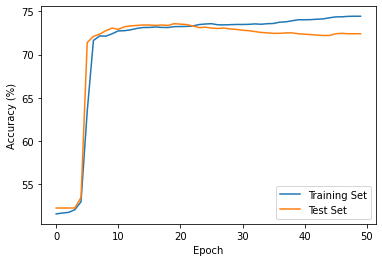

Threshold 0.3, Model 39
Training with Seed 39


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.02it/s]


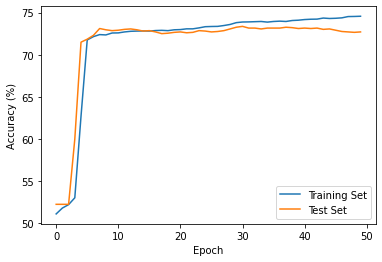

Threshold 0.3, Model 40
Training with Seed 40


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.94it/s]


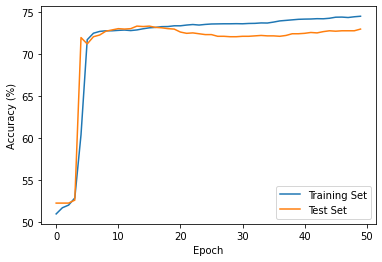

Threshold 0.3, Model 41
Training with Seed 41


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.80it/s]


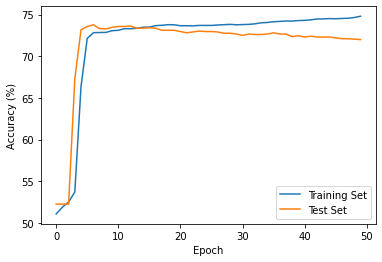

Threshold 0.3, Model 42
Training with Seed 42


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.80it/s]


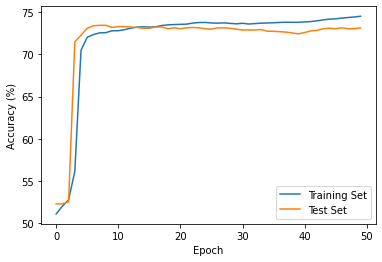

Threshold 0.3, Model 43
Training with Seed 43


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.90it/s]


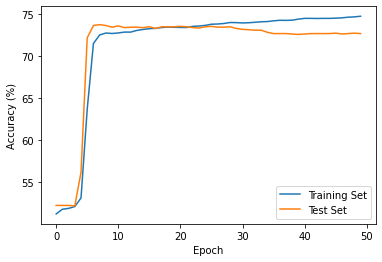

Threshold 0.3, Model 44
Training with Seed 44


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.99it/s]


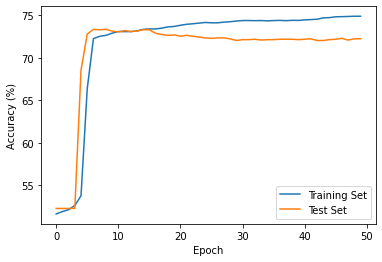

Threshold 0.3, Model 45
Training with Seed 45


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.97it/s]


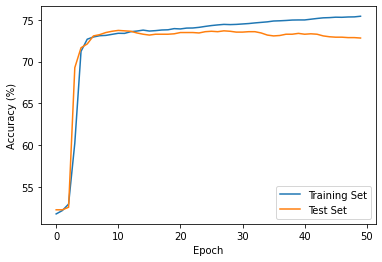

Threshold 0.3, Model 46
Training with Seed 46


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.93it/s]


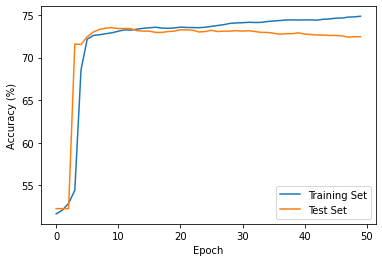

Threshold 0.3, Model 47
Training with Seed 47


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.03it/s]


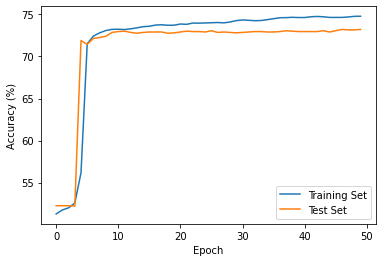

Threshold 0.3, Model 48
Training with Seed 48


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.94it/s]


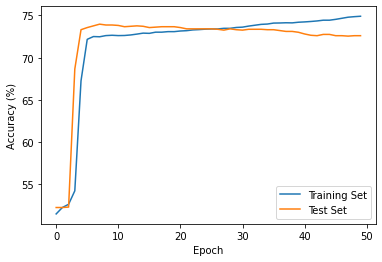

Threshold 0.3, Model 49
Training with Seed 49


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.86it/s]


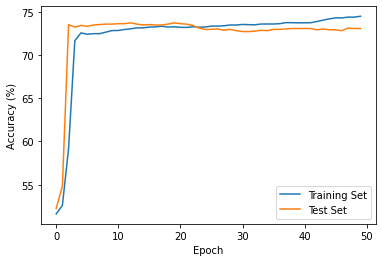

Threshold 0.3, Model 50
Training with Seed 50


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.98it/s]


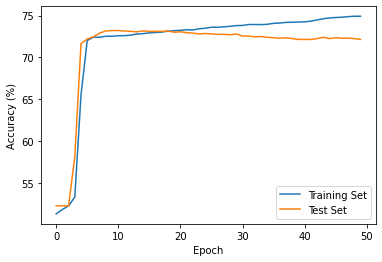

Threshold 0.3, Model 51
Training with Seed 51


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.00it/s]


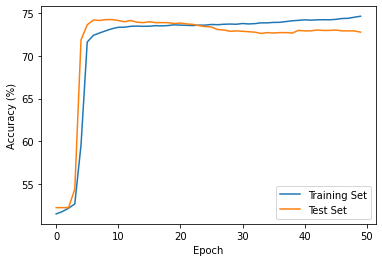

Threshold 0.3, Model 52
Training with Seed 52


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.77it/s]


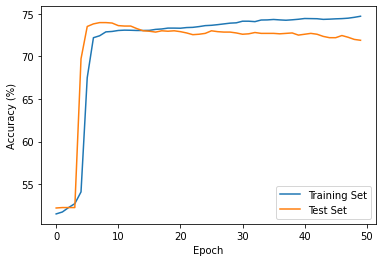

Threshold 0.3, Model 53
Training with Seed 53


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.83it/s]


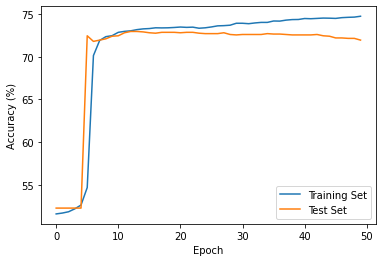

Threshold 0.3, Model 54
Training with Seed 54


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.91it/s]


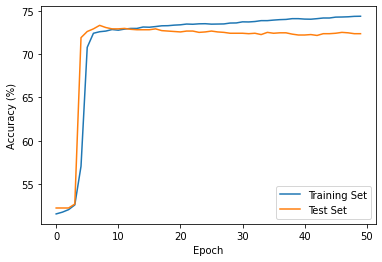

Threshold 0.3, Model 55
Training with Seed 55


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.03it/s]


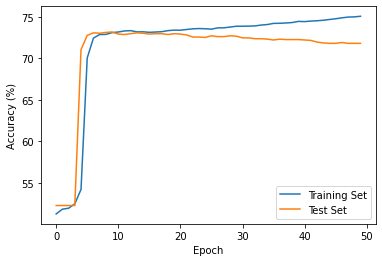

Threshold 0.3, Model 56
Training with Seed 56


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.94it/s]


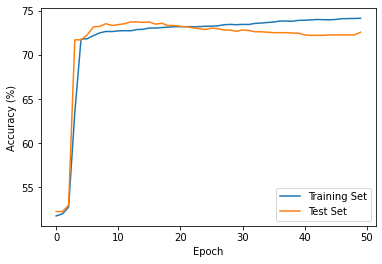

Threshold 0.3, Model 57
Training with Seed 57


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.05it/s]


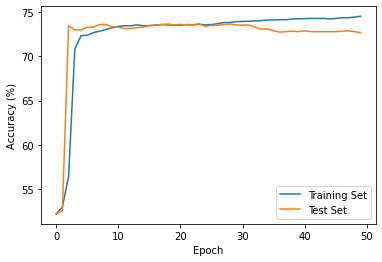

Threshold 0.3, Model 58
Training with Seed 58


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.04it/s]


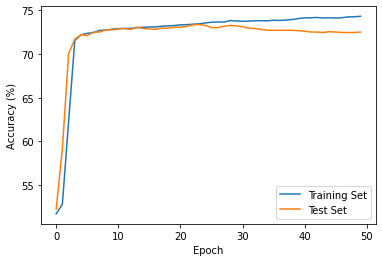

Threshold 0.3, Model 59
Training with Seed 59


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.98it/s]


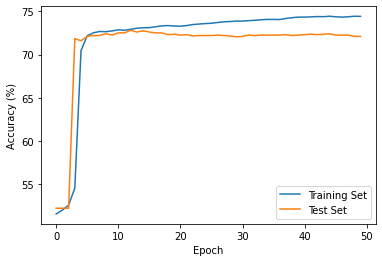

Threshold 0.3, Model 60
Training with Seed 60


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.01it/s]


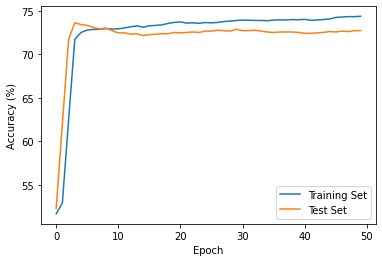

Threshold 0.3, Model 61
Training with Seed 61


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.94it/s]


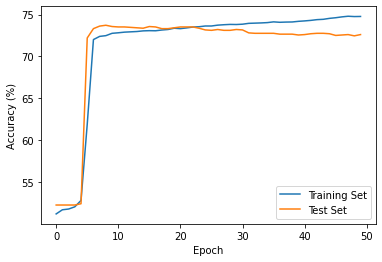

Threshold 0.3, Model 62
Training with Seed 62


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.71it/s]


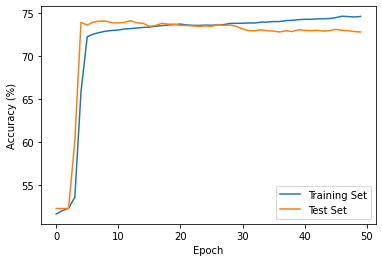

Threshold 0.3, Model 63
Training with Seed 63


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.04it/s]


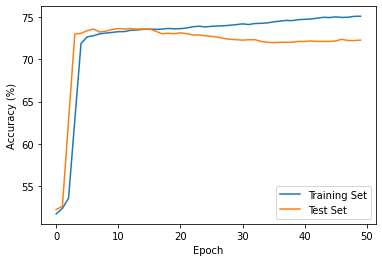

Threshold 0.3, Model 64
Training with Seed 64


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.05it/s]


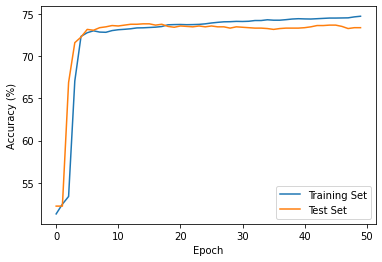

Threshold 0.3, Model 65
Training with Seed 65


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.77it/s]


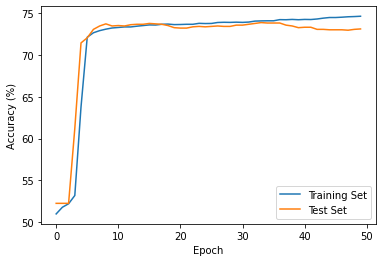

Threshold 0.3, Model 66
Training with Seed 66


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.00it/s]


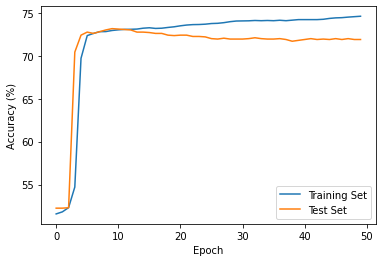

Threshold 0.3, Model 67
Training with Seed 67


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.91it/s]


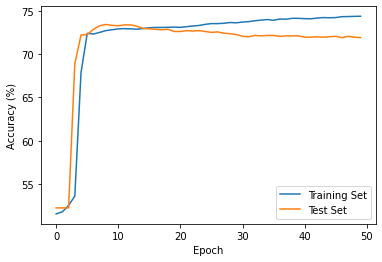

Threshold 0.3, Model 68
Training with Seed 68


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.02it/s]


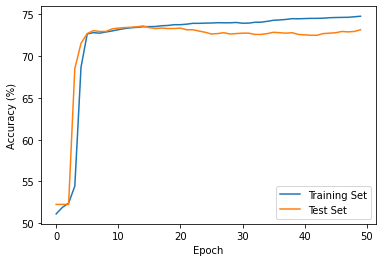

Threshold 0.3, Model 69
Training with Seed 69


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.05it/s]


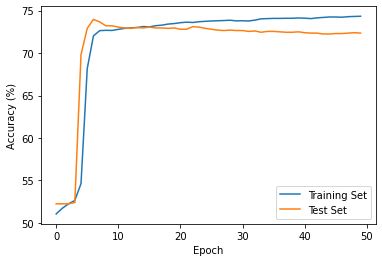

Threshold 0.3, Model 70
Training with Seed 70


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.97it/s]


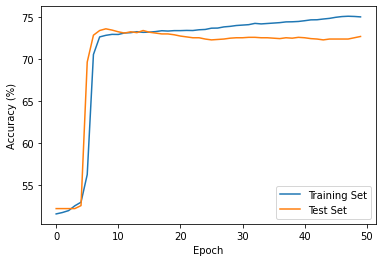

Threshold 0.3, Model 71
Training with Seed 71


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.97it/s]


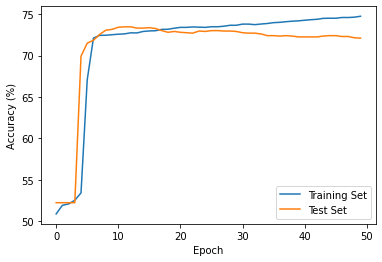

Threshold 0.3, Model 72
Training with Seed 72


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.00it/s]


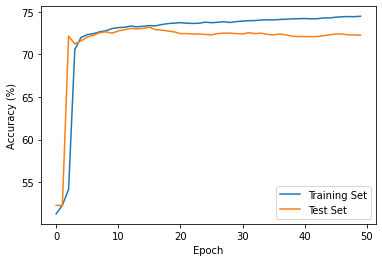

Threshold 0.3, Model 73
Training with Seed 73


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.93it/s]


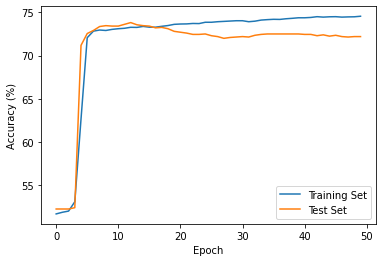

Threshold 0.3, Model 74
Training with Seed 74


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.99it/s]


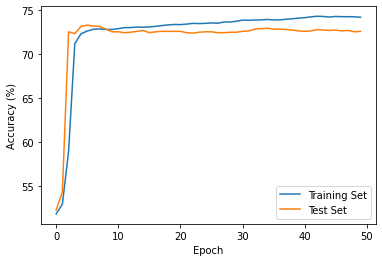

Threshold 0.3, Model 75
Training with Seed 75


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.02it/s]


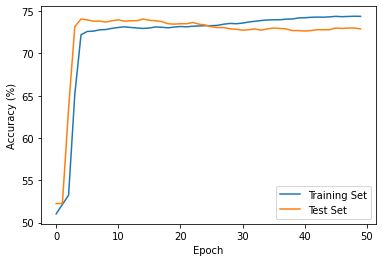

Threshold 0.3, Model 76
Training with Seed 76


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.98it/s]


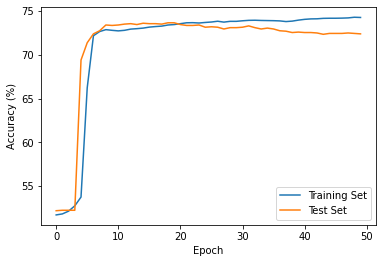

Threshold 0.3, Model 77
Training with Seed 77


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.03it/s]


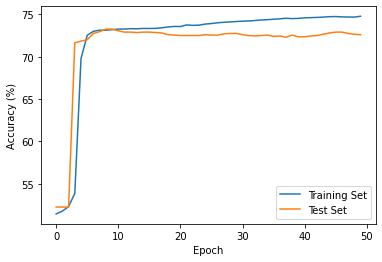

Threshold 0.3, Model 78
Training with Seed 78


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.99it/s]


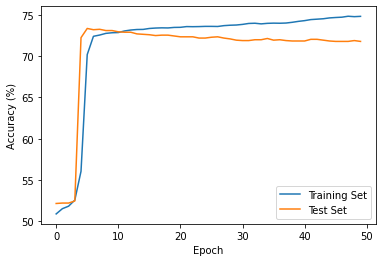

Threshold 0.3, Model 79
Training with Seed 79


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.01it/s]


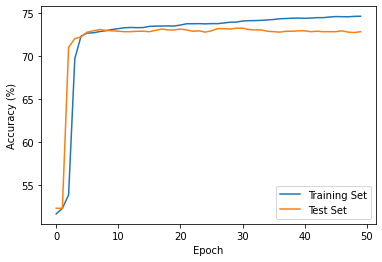

Threshold 0.3, Model 80
Training with Seed 80


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.03it/s]


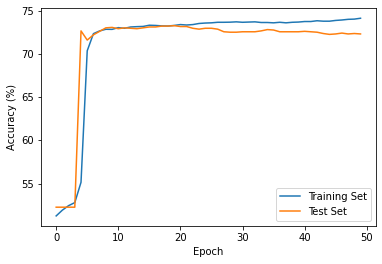

Threshold 0.3, Model 81
Training with Seed 81


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.97it/s]


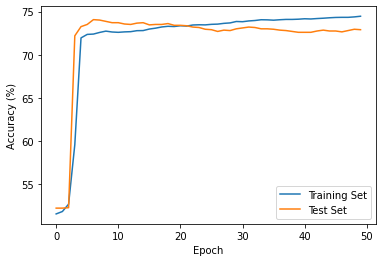

Threshold 0.3, Model 82
Training with Seed 82


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.85it/s]


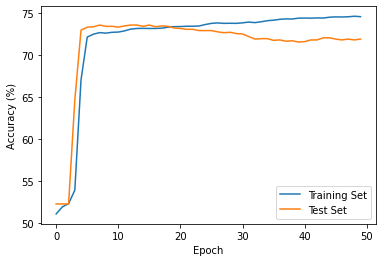

Threshold 0.3, Model 83
Training with Seed 83


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.91it/s]


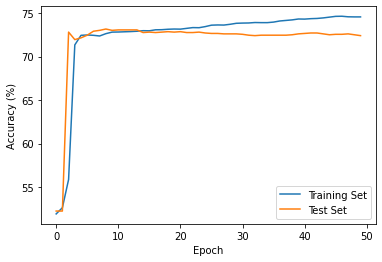

Threshold 0.3, Model 84
Training with Seed 84


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.91it/s]


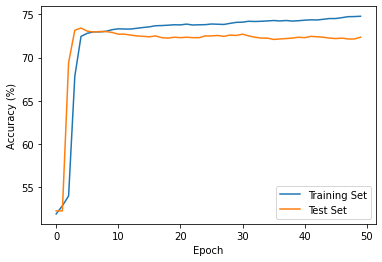

Threshold 0.3, Model 85
Training with Seed 85


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.86it/s]


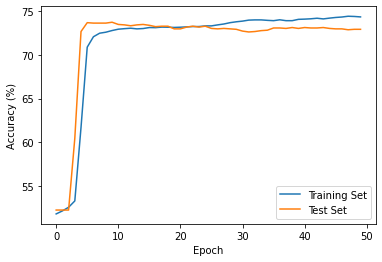

Threshold 0.3, Model 86
Training with Seed 86


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.97it/s]


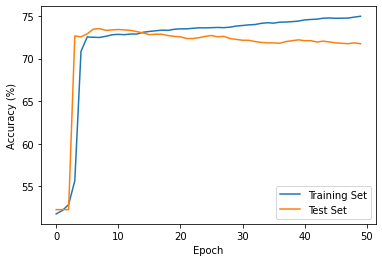

Threshold 0.3, Model 87
Training with Seed 87


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.76it/s]


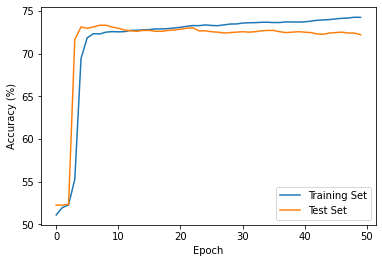

Threshold 0.3, Model 88
Training with Seed 88


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.64it/s]


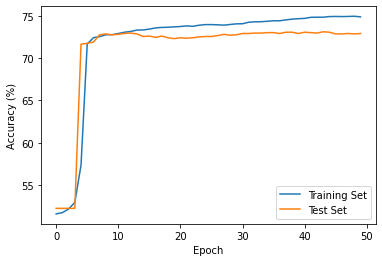

Threshold 0.3, Model 89
Training with Seed 89


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.69it/s]


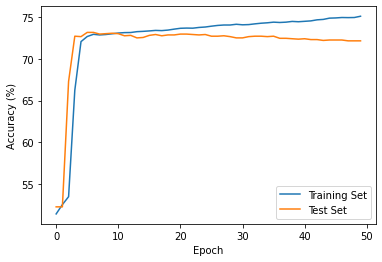

Threshold 0.3, Model 90
Training with Seed 90


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.89it/s]


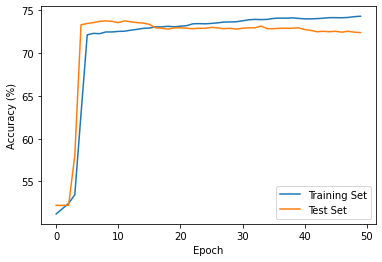

Threshold 0.3, Model 91
Training with Seed 91


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.94it/s]


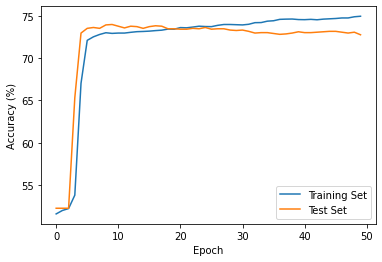

Threshold 0.3, Model 92
Training with Seed 92


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.94it/s]


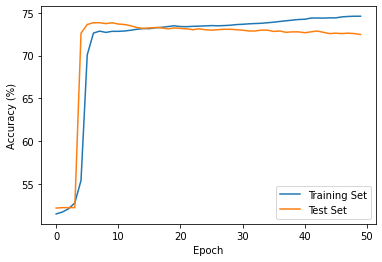

Threshold 0.3, Model 93
Training with Seed 93


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.01it/s]


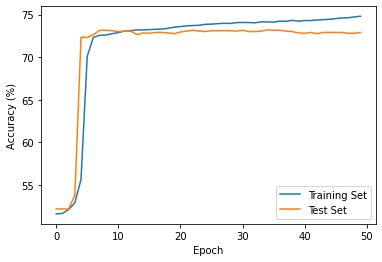

Threshold 0.3, Model 94
Training with Seed 94


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.02it/s]


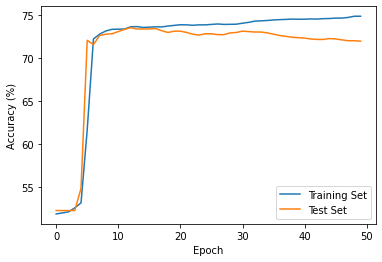

Threshold 0.3, Model 95
Training with Seed 95


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.03it/s]


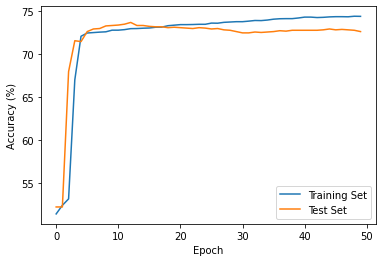

Threshold 0.3, Model 96
Training with Seed 96


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.81it/s]


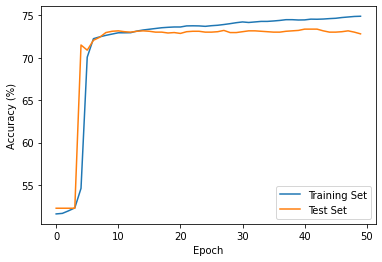

Threshold 0.3, Model 97
Training with Seed 97


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.06it/s]


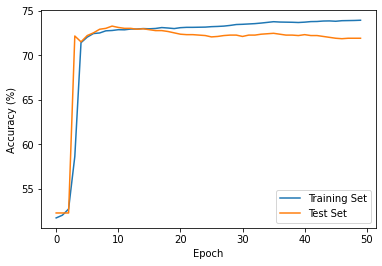

Threshold 0.3, Model 98
Training with Seed 98


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.07it/s]


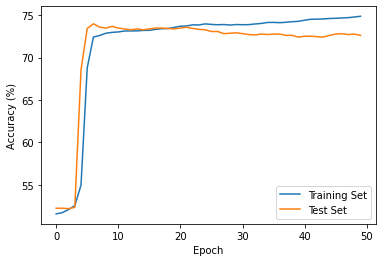

Threshold 0.3, Model 99
Training with Seed 99


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.06it/s]


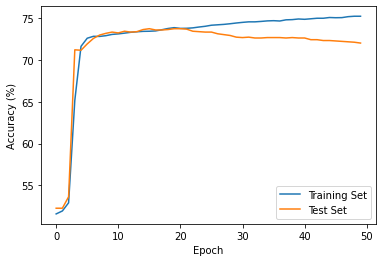

Threshold 0.4, Model 0
Training with Seed 0


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.08it/s]


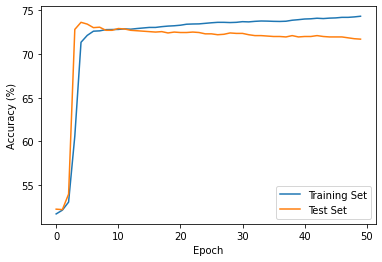

Threshold 0.4, Model 1
Training with Seed 1


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.05it/s]


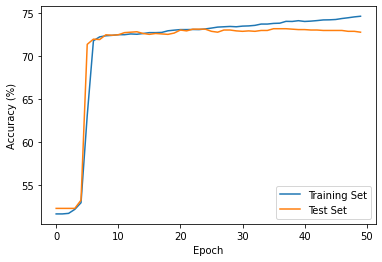

Threshold 0.4, Model 2
Training with Seed 2


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.03it/s]


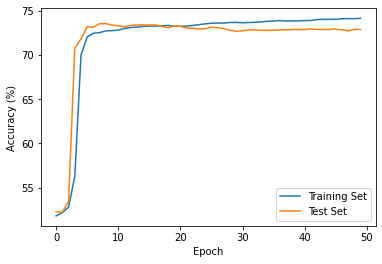

Threshold 0.4, Model 3
Training with Seed 3


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.02it/s]


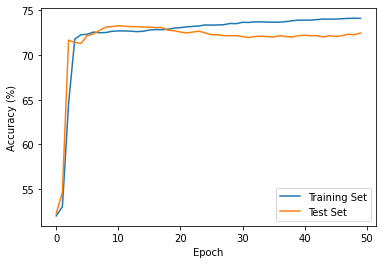

Threshold 0.4, Model 4
Training with Seed 4


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.00it/s]


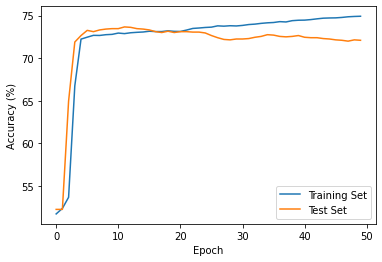

Threshold 0.4, Model 5
Training with Seed 5


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.05it/s]


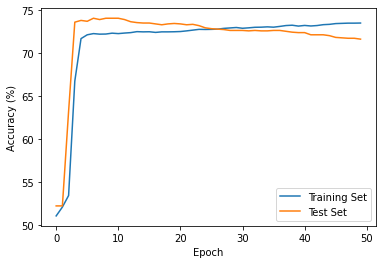

Threshold 0.4, Model 6
Training with Seed 6


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.76it/s]


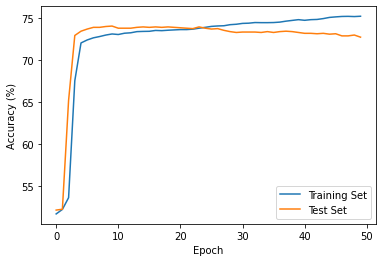

Threshold 0.4, Model 7
Training with Seed 7


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.03it/s]


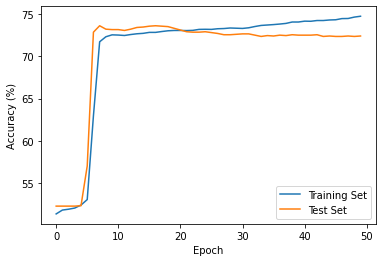

Threshold 0.4, Model 8
Training with Seed 8


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.99it/s]


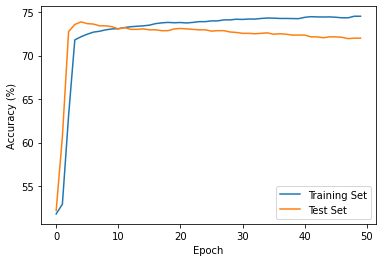

Threshold 0.4, Model 9
Training with Seed 9


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.03it/s]


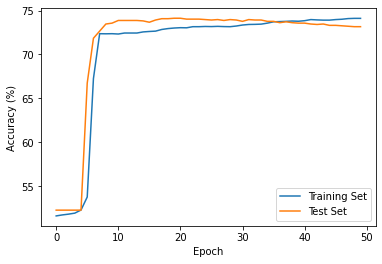

Threshold 0.4, Model 10
Training with Seed 10


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.00it/s]


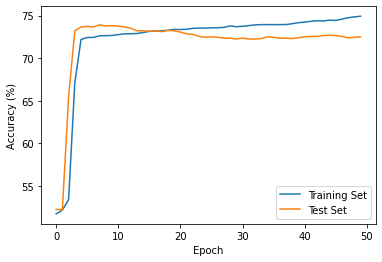

Threshold 0.4, Model 11
Training with Seed 11


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.77it/s]


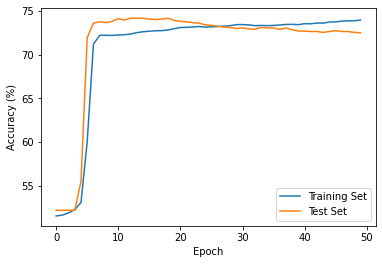

Threshold 0.4, Model 12
Training with Seed 12


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.06it/s]


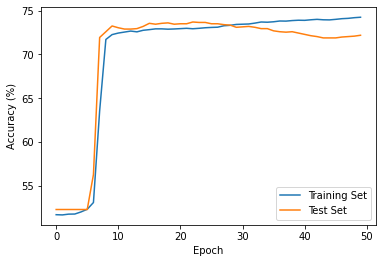

Threshold 0.4, Model 13
Training with Seed 13


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.06it/s]


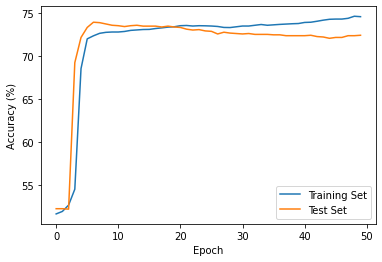

Threshold 0.4, Model 14
Training with Seed 14


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.75it/s]


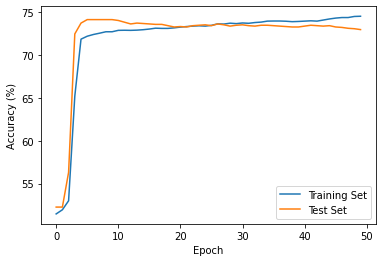

Threshold 0.4, Model 15
Training with Seed 15


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.91it/s]


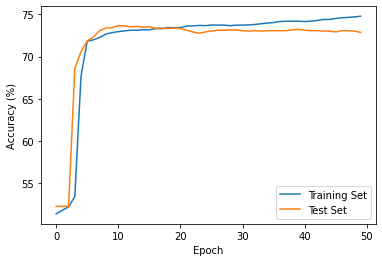

Threshold 0.4, Model 16
Training with Seed 16


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.85it/s]


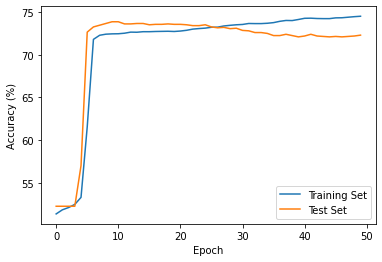

Threshold 0.4, Model 17
Training with Seed 17


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.99it/s]


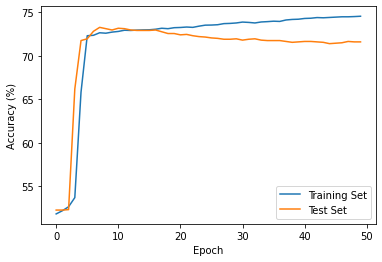

Threshold 0.4, Model 18
Training with Seed 18


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.01it/s]


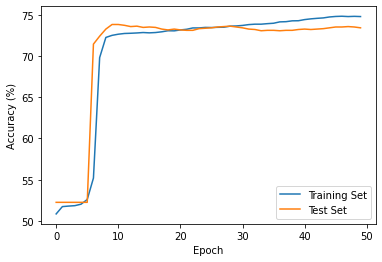

Threshold 0.4, Model 19
Training with Seed 19


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.99it/s]


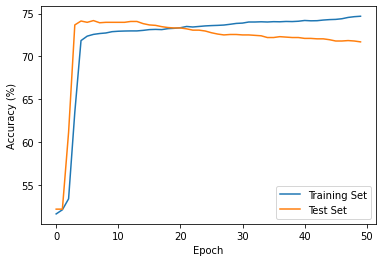

Threshold 0.4, Model 20
Training with Seed 20


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.95it/s]


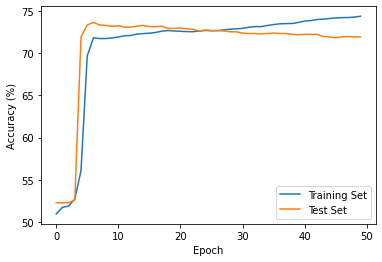

Threshold 0.4, Model 21
Training with Seed 21


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.03it/s]


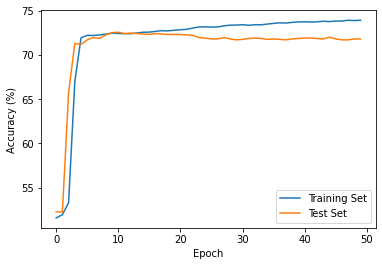

Threshold 0.4, Model 22
Training with Seed 22


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.04it/s]


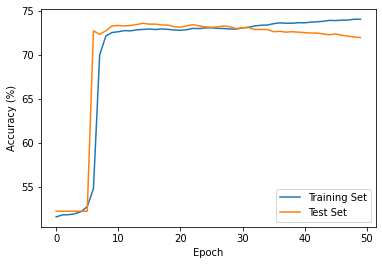

Threshold 0.4, Model 23
Training with Seed 23


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.06it/s]


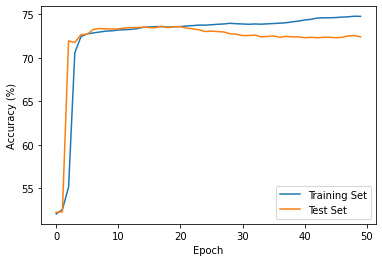

Threshold 0.4, Model 24
Training with Seed 24


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.94it/s]


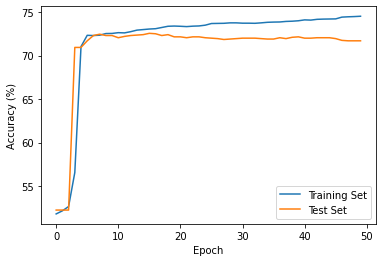

Threshold 0.4, Model 25
Training with Seed 25


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.72it/s]


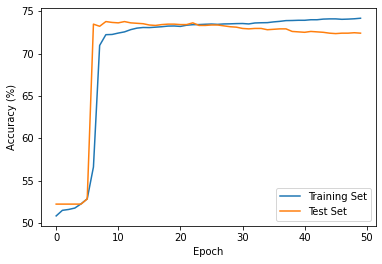

Threshold 0.4, Model 26
Training with Seed 26


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.89it/s]


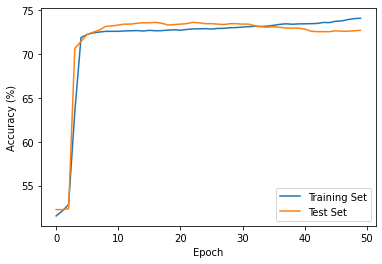

Threshold 0.4, Model 27
Training with Seed 27


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.71it/s]


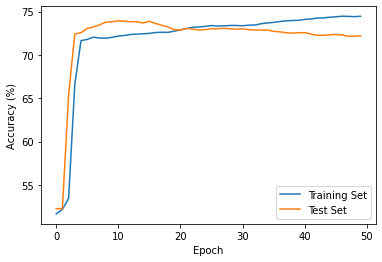

Threshold 0.4, Model 28
Training with Seed 28


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.67it/s]


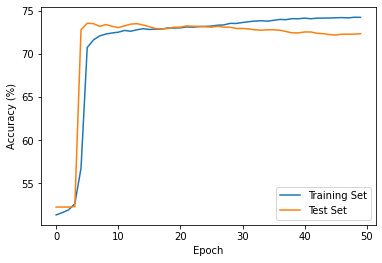

Threshold 0.4, Model 29
Training with Seed 29


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.04it/s]


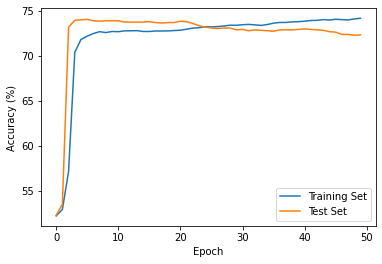

Threshold 0.4, Model 30
Training with Seed 30


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.80it/s]


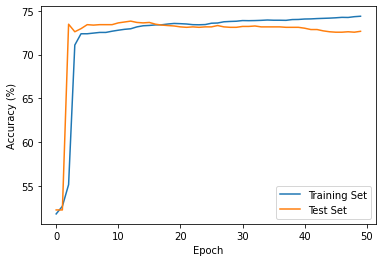

Threshold 0.4, Model 31
Training with Seed 31


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.01it/s]


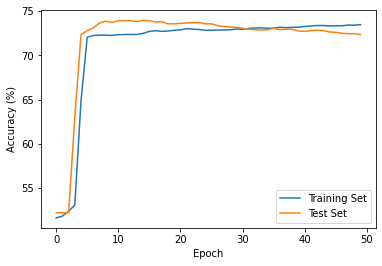

Threshold 0.4, Model 32
Training with Seed 32


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.97it/s]


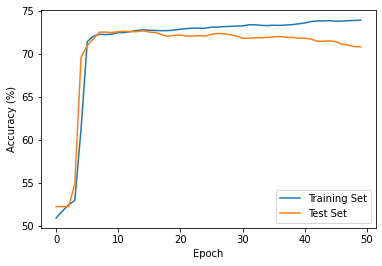

Threshold 0.4, Model 33
Training with Seed 33


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.95it/s]


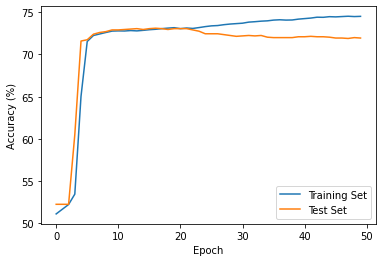

Threshold 0.4, Model 34
Training with Seed 34


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.95it/s]


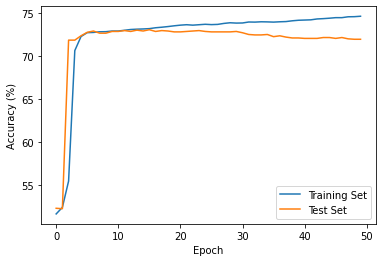

Threshold 0.4, Model 35
Training with Seed 35


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.97it/s]


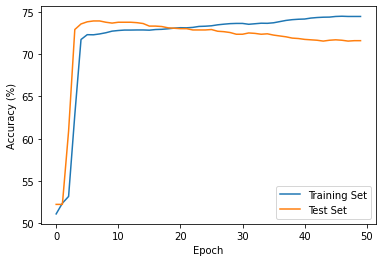

Threshold 0.4, Model 36
Training with Seed 36


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.84it/s]


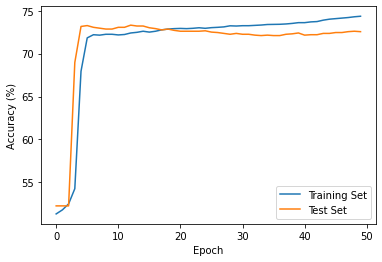

Threshold 0.4, Model 37
Training with Seed 37


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.88it/s]


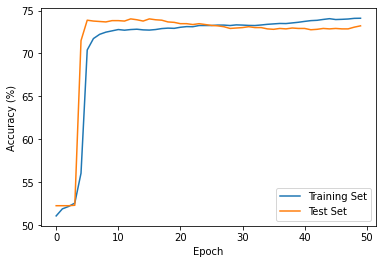

Threshold 0.4, Model 38
Training with Seed 38


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.92it/s]


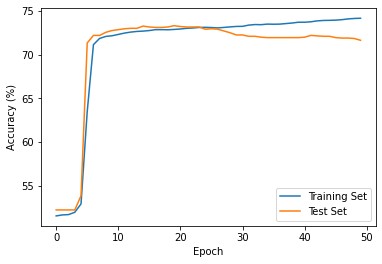

Threshold 0.4, Model 39
Training with Seed 39


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.04it/s]


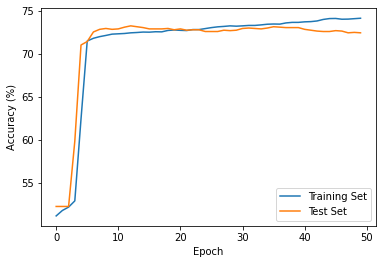

Threshold 0.4, Model 40
Training with Seed 40


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.74it/s]


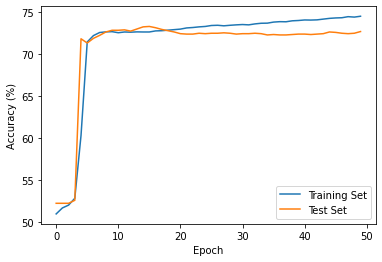

Threshold 0.4, Model 41
Training with Seed 41


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.06it/s]


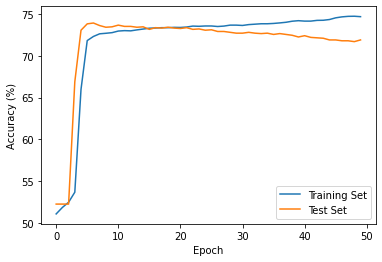

Threshold 0.4, Model 42
Training with Seed 42


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.89it/s]


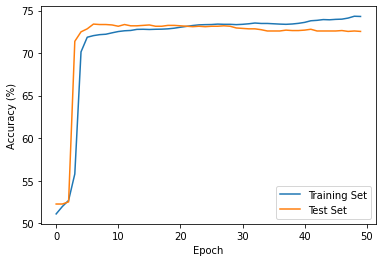

Threshold 0.4, Model 43
Training with Seed 43


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.97it/s]


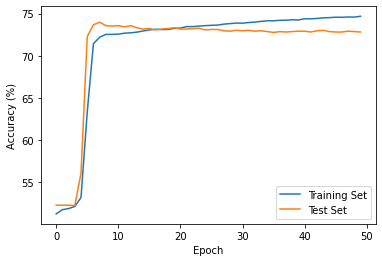

Threshold 0.4, Model 44
Training with Seed 44


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.96it/s]


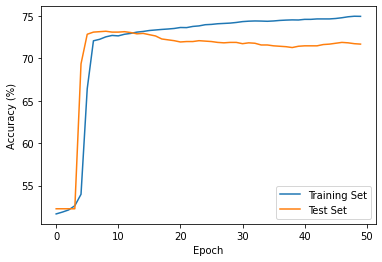

Threshold 0.4, Model 45
Training with Seed 45


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.01it/s]


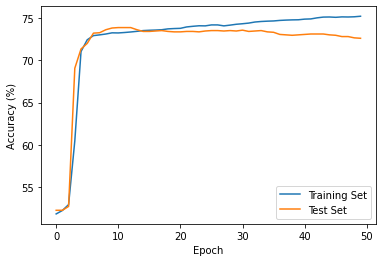

Threshold 0.4, Model 46
Training with Seed 46


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.00it/s]


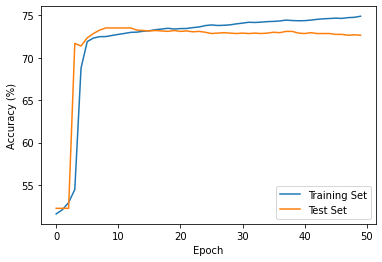

Threshold 0.4, Model 47
Training with Seed 47


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.99it/s]


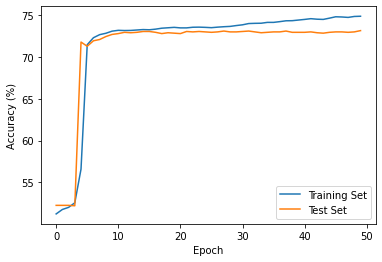

Threshold 0.4, Model 48
Training with Seed 48


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.92it/s]


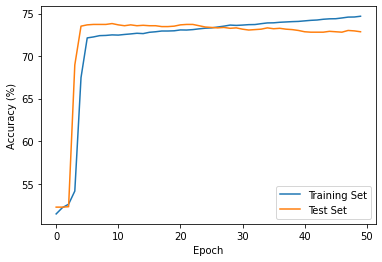

Threshold 0.4, Model 49
Training with Seed 49


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.89it/s]


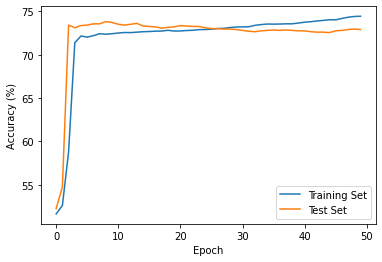

Threshold 0.4, Model 50
Training with Seed 50


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.08it/s]


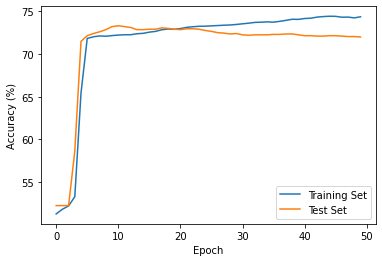

Threshold 0.4, Model 51
Training with Seed 51


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.90it/s]


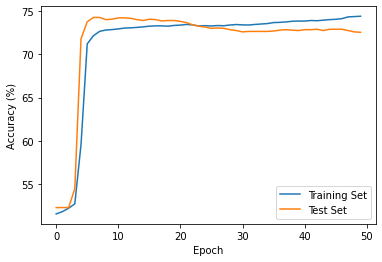

Threshold 0.4, Model 52
Training with Seed 52


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.02it/s]


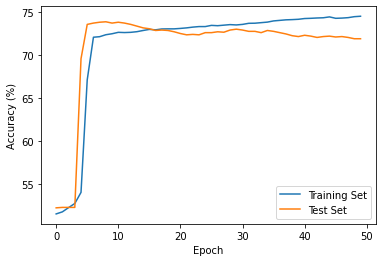

Threshold 0.4, Model 53
Training with Seed 53


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.98it/s]


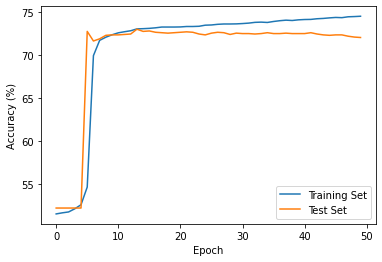

Threshold 0.4, Model 54
Training with Seed 54


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.94it/s]


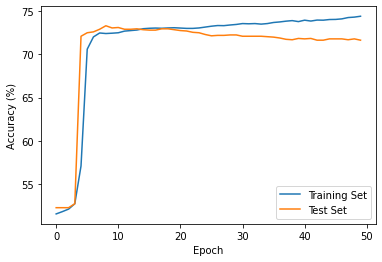

Threshold 0.4, Model 55
Training with Seed 55


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.98it/s]


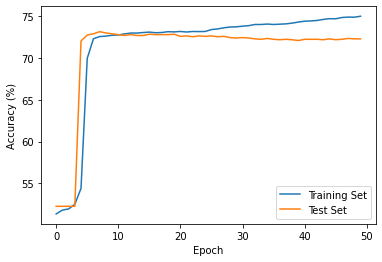

Threshold 0.4, Model 56
Training with Seed 56


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.96it/s]


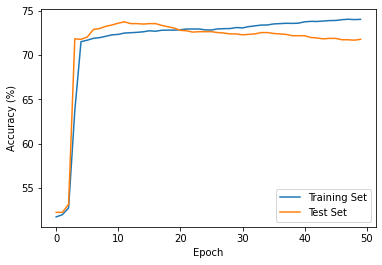

Threshold 0.4, Model 57
Training with Seed 57


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.97it/s]


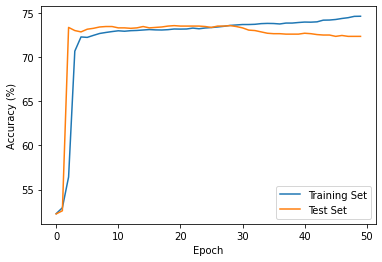

Threshold 0.4, Model 58
Training with Seed 58


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.02it/s]


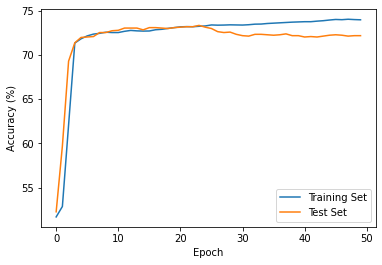

Threshold 0.4, Model 59
Training with Seed 59


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.04it/s]


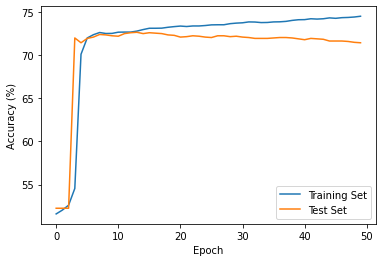

Threshold 0.4, Model 60
Training with Seed 60


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.04it/s]


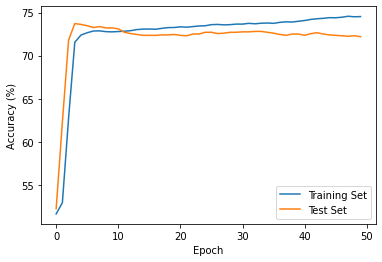

Threshold 0.4, Model 61
Training with Seed 61


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.09it/s]


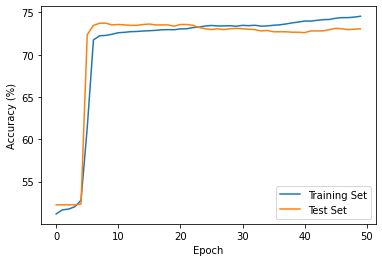

Threshold 0.4, Model 62
Training with Seed 62


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.06it/s]


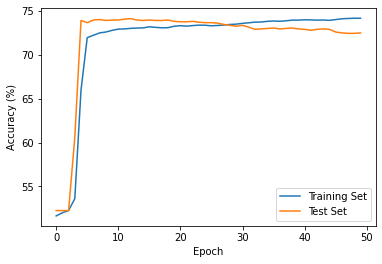

Threshold 0.4, Model 63
Training with Seed 63


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.07it/s]


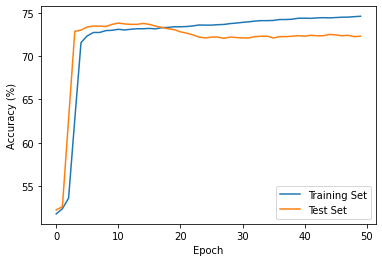

Threshold 0.4, Model 64
Training with Seed 64


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.01it/s]


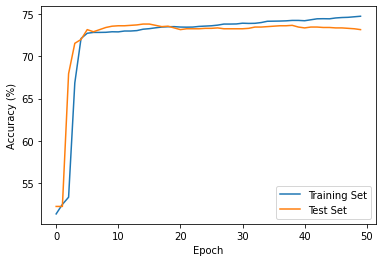

Threshold 0.4, Model 65
Training with Seed 65


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.97it/s]


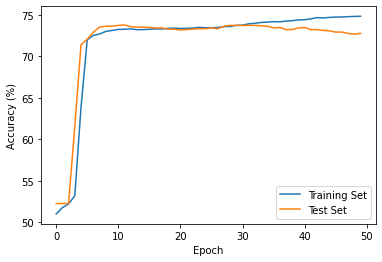

Threshold 0.4, Model 66
Training with Seed 66


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.84it/s]


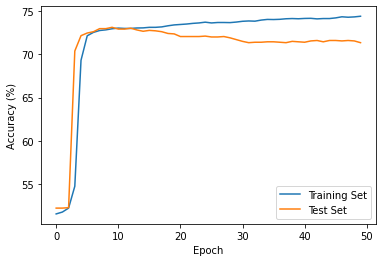

Threshold 0.4, Model 67
Training with Seed 67


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.71it/s]


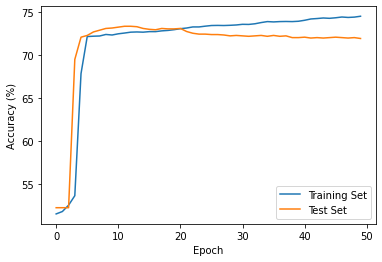

Threshold 0.4, Model 68
Training with Seed 68


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.71it/s]


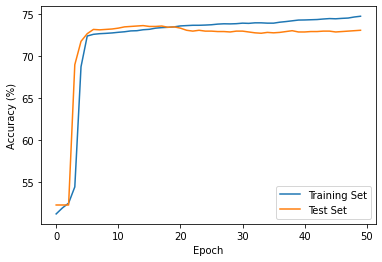

Threshold 0.4, Model 69
Training with Seed 69


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.99it/s]


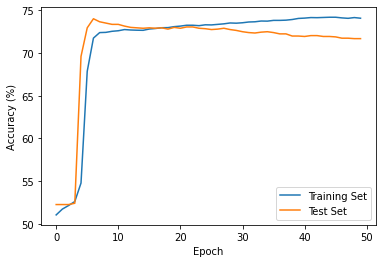

Threshold 0.4, Model 70
Training with Seed 70


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.99it/s]


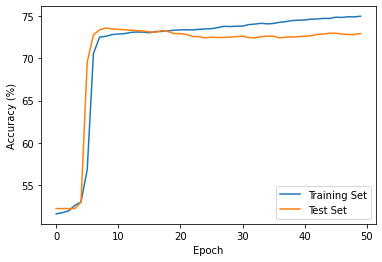

Threshold 0.4, Model 71
Training with Seed 71


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.02it/s]


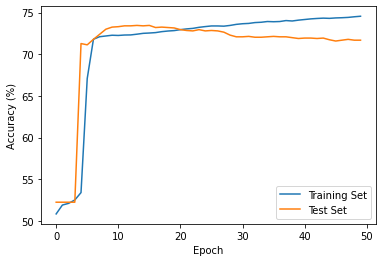

Threshold 0.4, Model 72
Training with Seed 72


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.96it/s]


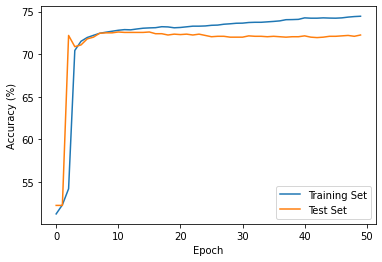

Threshold 0.4, Model 73
Training with Seed 73


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.01it/s]


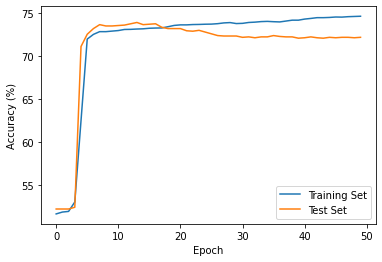

Threshold 0.4, Model 74
Training with Seed 74


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.98it/s]


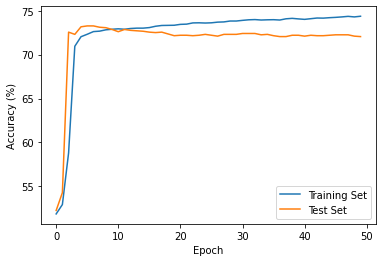

Threshold 0.4, Model 75
Training with Seed 75


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.00it/s]


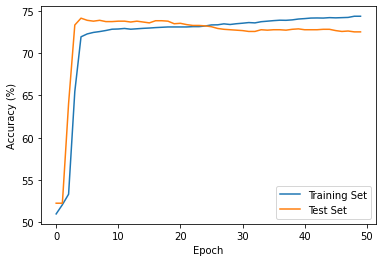

Threshold 0.4, Model 76
Training with Seed 76


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.02it/s]


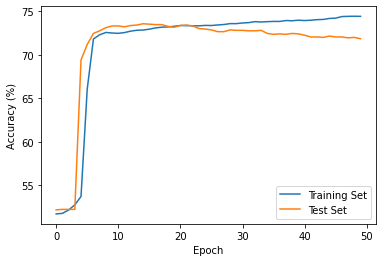

Threshold 0.4, Model 77
Training with Seed 77


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.09it/s]


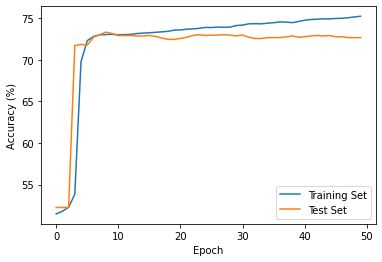

Threshold 0.4, Model 78
Training with Seed 78


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.02it/s]


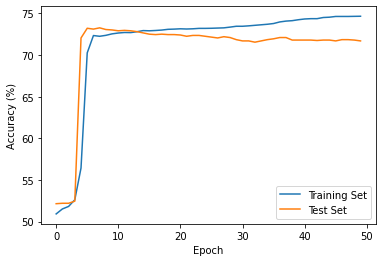

Threshold 0.4, Model 79
Training with Seed 79


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.83it/s]


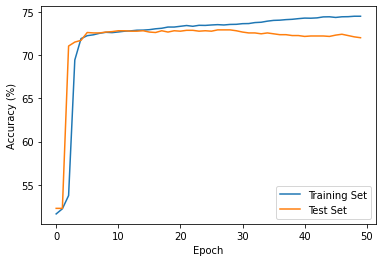

Threshold 0.4, Model 80
Training with Seed 80


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.86it/s]


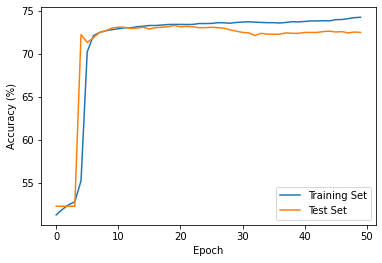

Threshold 0.4, Model 81
Training with Seed 81


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.60it/s]


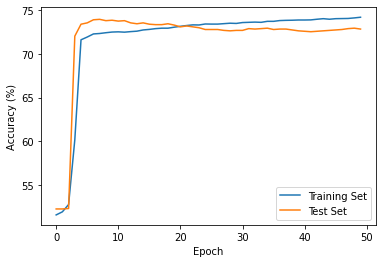

Threshold 0.4, Model 82
Training with Seed 82


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.83it/s]


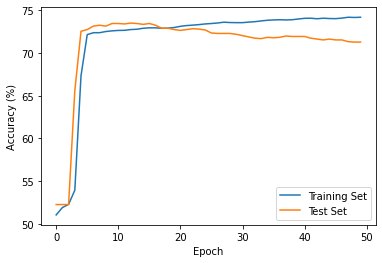

Threshold 0.4, Model 83
Training with Seed 83


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.69it/s]


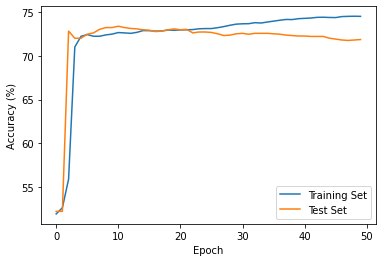

Threshold 0.4, Model 84
Training with Seed 84


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.65it/s]


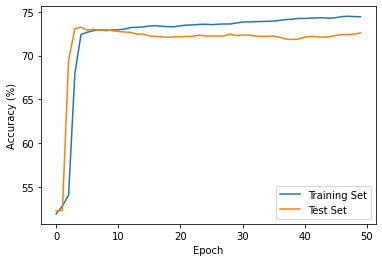

Threshold 0.4, Model 85
Training with Seed 85


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.99it/s]


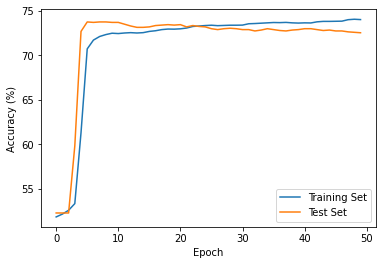

Threshold 0.4, Model 86
Training with Seed 86


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.03it/s]


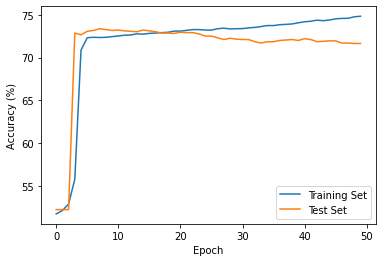

Threshold 0.4, Model 87
Training with Seed 87


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.84it/s]


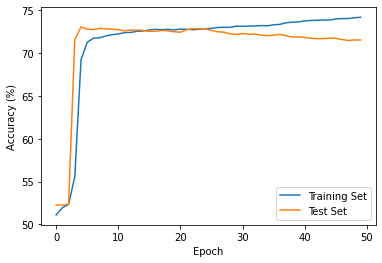

Threshold 0.4, Model 88
Training with Seed 88


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.81it/s]


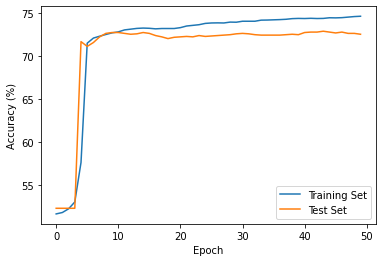

Threshold 0.4, Model 89
Training with Seed 89


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.73it/s]


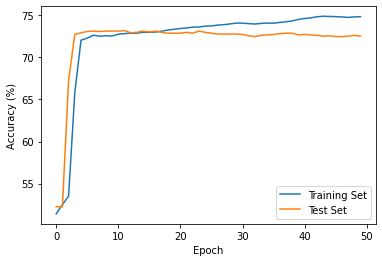

Threshold 0.4, Model 90
Training with Seed 90


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.90it/s]


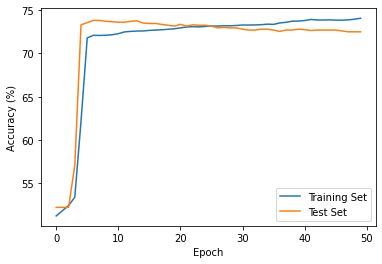

Threshold 0.4, Model 91
Training with Seed 91


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.82it/s]


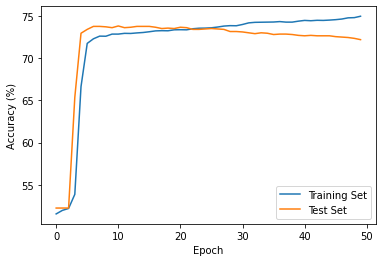

Threshold 0.4, Model 92
Training with Seed 92


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.91it/s]


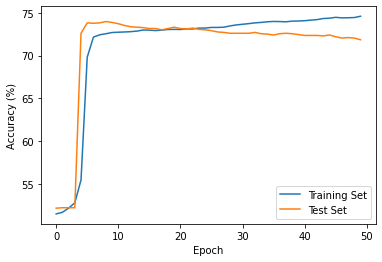

Threshold 0.4, Model 93
Training with Seed 93


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.98it/s]


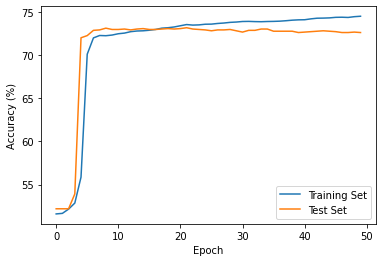

Threshold 0.4, Model 94
Training with Seed 94


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.99it/s]


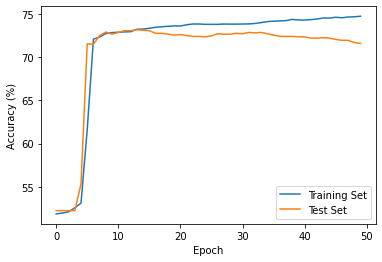

Threshold 0.4, Model 95
Training with Seed 95


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.04it/s]


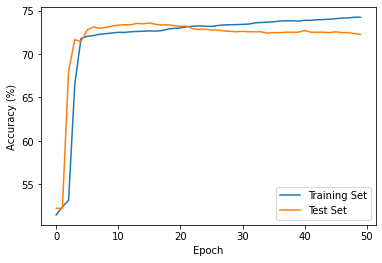

Threshold 0.4, Model 96
Training with Seed 96


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.05it/s]


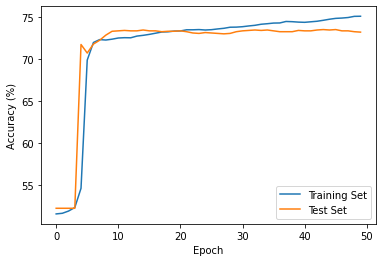

Threshold 0.4, Model 97
Training with Seed 97


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.00it/s]


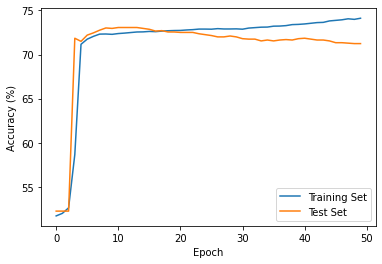

Threshold 0.4, Model 98
Training with Seed 98


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.90it/s]


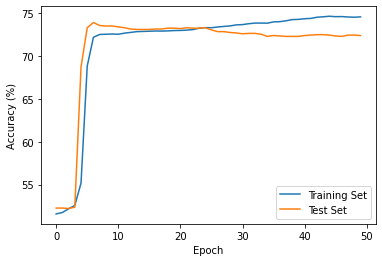

Threshold 0.4, Model 99
Training with Seed 99


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.92it/s]


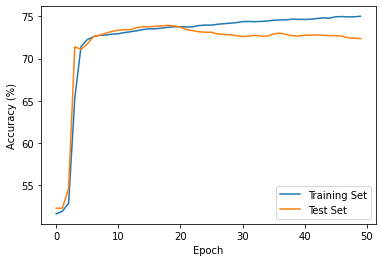

Threshold 0.5, Model 0
Training with Seed 0


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.93it/s]


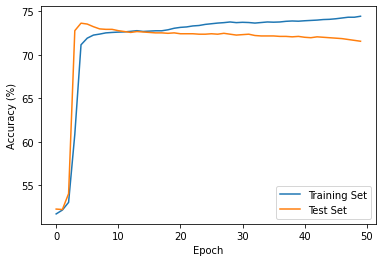

Threshold 0.5, Model 1
Training with Seed 1


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.02it/s]


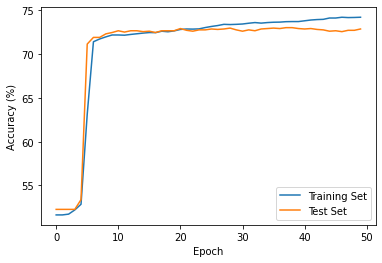

Threshold 0.5, Model 2
Training with Seed 2


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.94it/s]


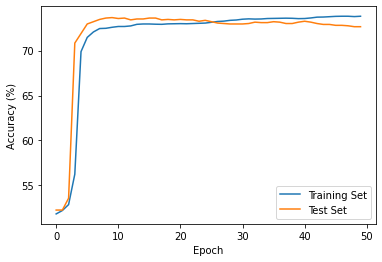

Threshold 0.5, Model 3
Training with Seed 3


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.81it/s]


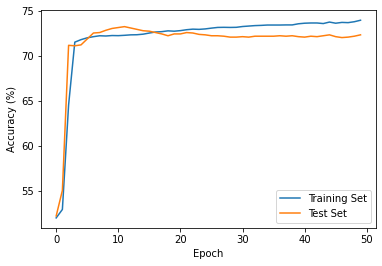

Threshold 0.5, Model 4
Training with Seed 4


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.88it/s]


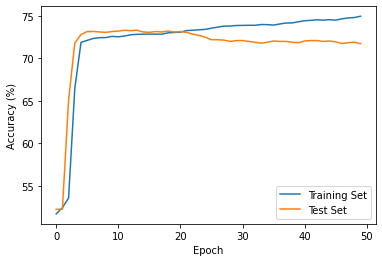

Threshold 0.5, Model 5
Training with Seed 5


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.86it/s]


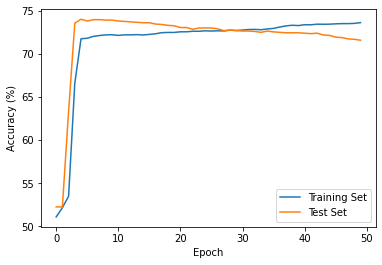

Threshold 0.5, Model 6
Training with Seed 6


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.79it/s]


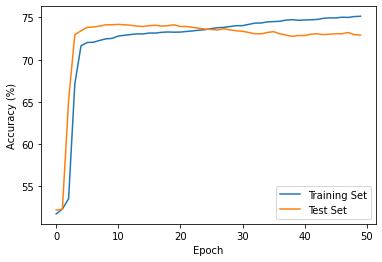

Threshold 0.5, Model 7
Training with Seed 7


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.79it/s]


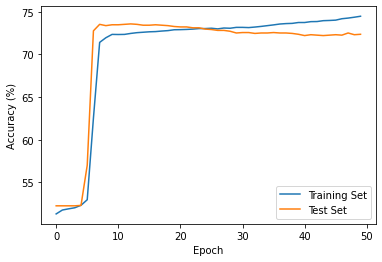

Threshold 0.5, Model 8
Training with Seed 8


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.91it/s]


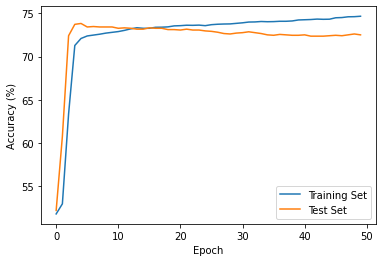

Threshold 0.5, Model 9
Training with Seed 9


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.83it/s]


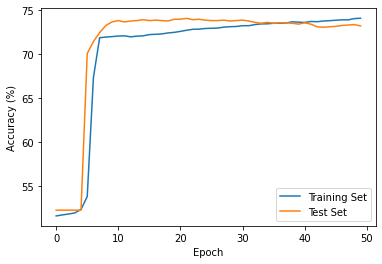

Threshold 0.5, Model 10
Training with Seed 10


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.88it/s]


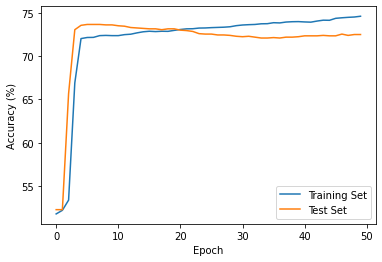

Threshold 0.5, Model 11
Training with Seed 11


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.05it/s]


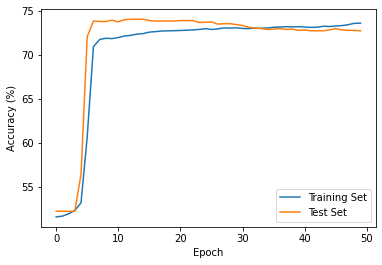

Threshold 0.5, Model 12
Training with Seed 12


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.96it/s]


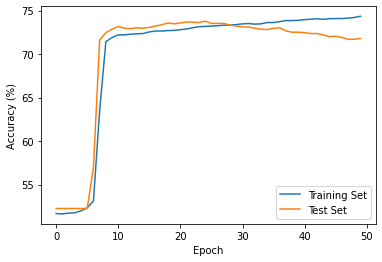

Threshold 0.5, Model 13
Training with Seed 13


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.91it/s]


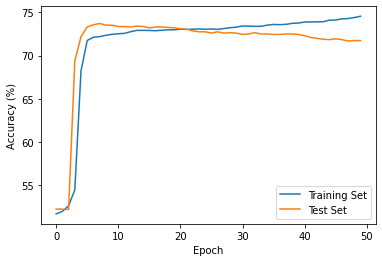

Threshold 0.5, Model 14
Training with Seed 14


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.01it/s]


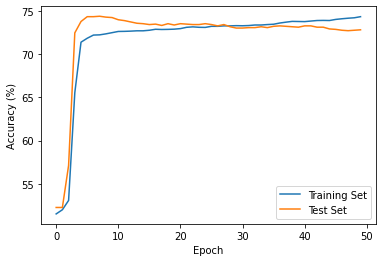

Threshold 0.5, Model 15
Training with Seed 15


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.81it/s]


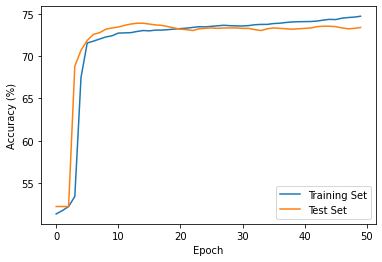

Threshold 0.5, Model 16
Training with Seed 16


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.64it/s]


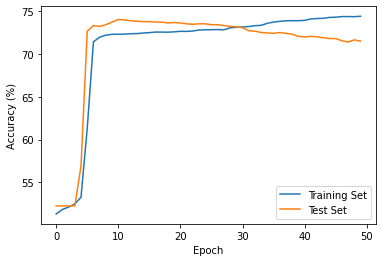

Threshold 0.5, Model 17
Training with Seed 17


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.79it/s]


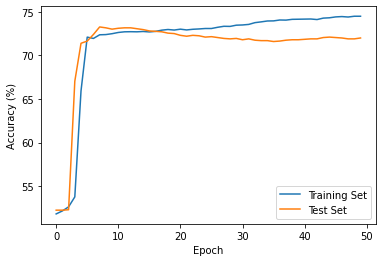

Threshold 0.5, Model 18
Training with Seed 18


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.03it/s]


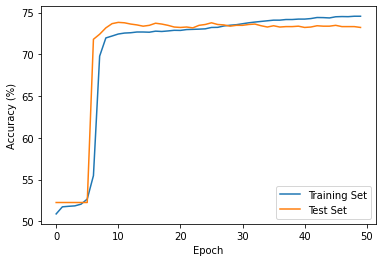

Threshold 0.5, Model 19
Training with Seed 19


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.85it/s]


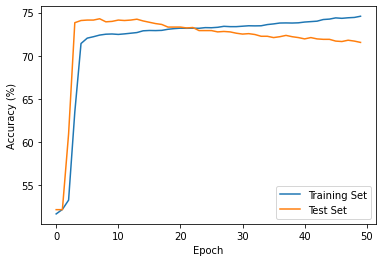

Threshold 0.5, Model 20
Training with Seed 20


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.00it/s]


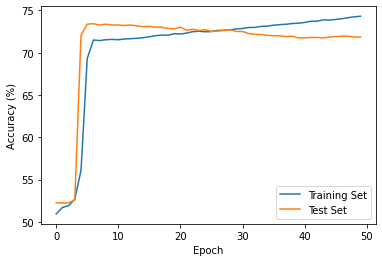

Threshold 0.5, Model 21
Training with Seed 21


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.03it/s]


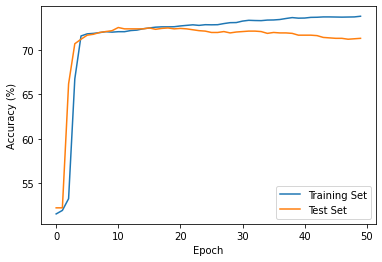

Threshold 0.5, Model 22
Training with Seed 22


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.93it/s]


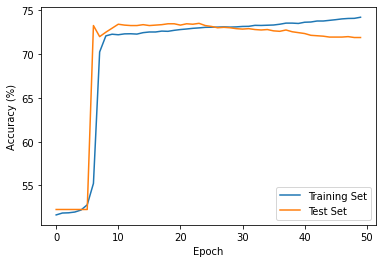

Threshold 0.5, Model 23
Training with Seed 23


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.79it/s]


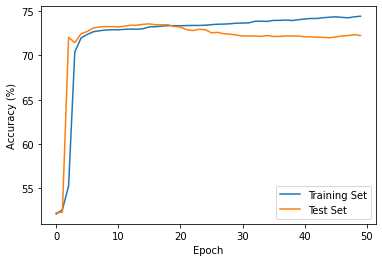

Threshold 0.5, Model 24
Training with Seed 24


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.76it/s]


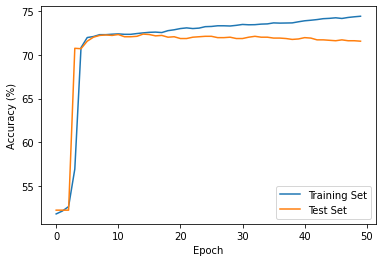

Threshold 0.5, Model 25
Training with Seed 25


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.94it/s]


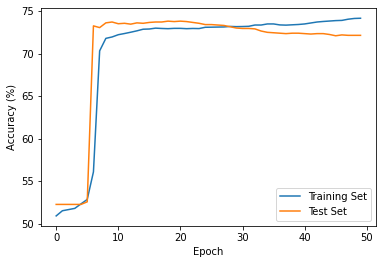

Threshold 0.5, Model 26
Training with Seed 26


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.88it/s]


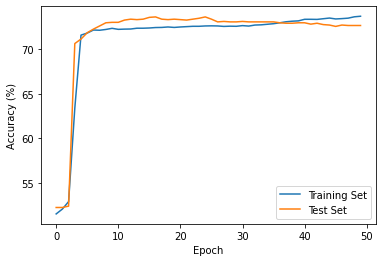

Threshold 0.5, Model 27
Training with Seed 27


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.06it/s]


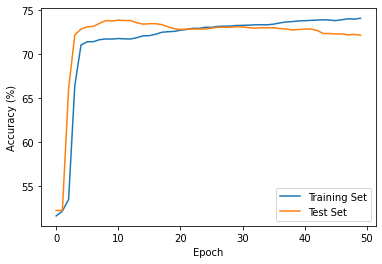

Threshold 0.5, Model 28
Training with Seed 28


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.01it/s]


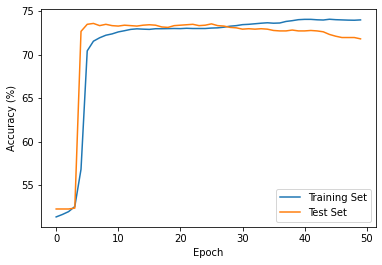

Threshold 0.5, Model 29
Training with Seed 29


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.02it/s]


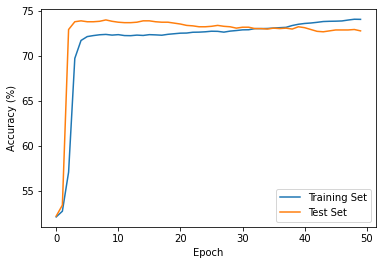

Threshold 0.5, Model 30
Training with Seed 30


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.96it/s]


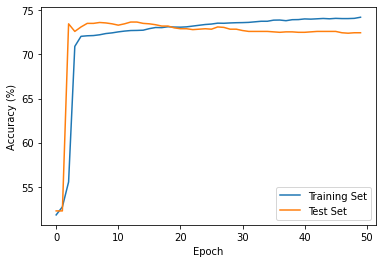

Threshold 0.5, Model 31
Training with Seed 31


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.00it/s]


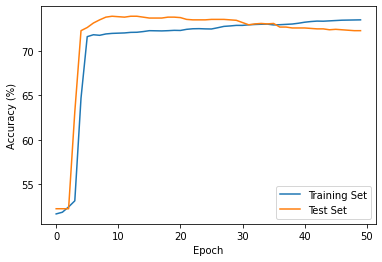

Threshold 0.5, Model 32
Training with Seed 32


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.91it/s]


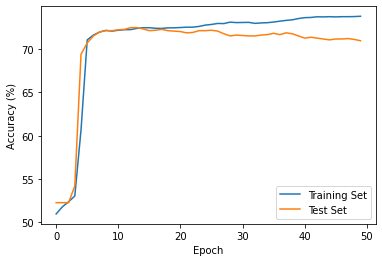

Threshold 0.5, Model 33
Training with Seed 33


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.85it/s]


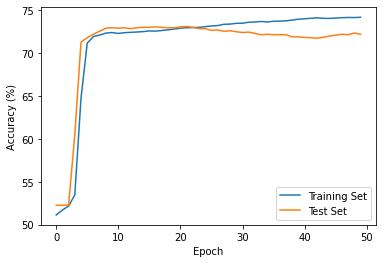

Threshold 0.5, Model 34
Training with Seed 34


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.93it/s]


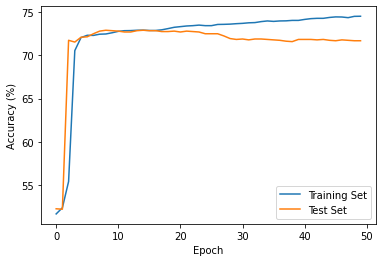

Threshold 0.5, Model 35
Training with Seed 35


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.79it/s]


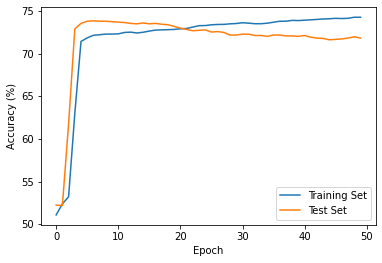

Threshold 0.5, Model 36
Training with Seed 36


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.93it/s]


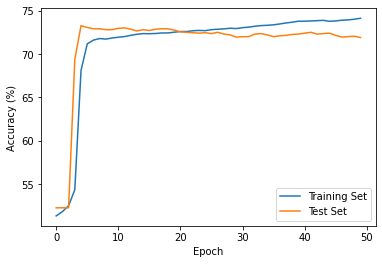

Threshold 0.5, Model 37
Training with Seed 37


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.01it/s]


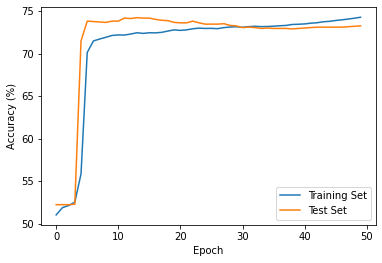

Threshold 0.5, Model 38
Training with Seed 38


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.95it/s]


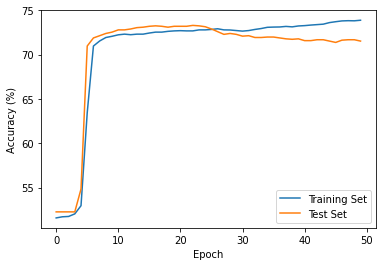

Threshold 0.5, Model 39
Training with Seed 39


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.77it/s]


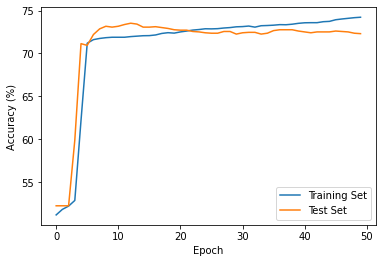

Threshold 0.5, Model 40
Training with Seed 40


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.82it/s]


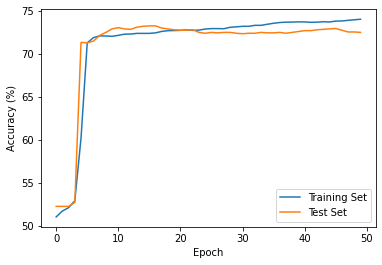

Threshold 0.5, Model 41
Training with Seed 41


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.03it/s]


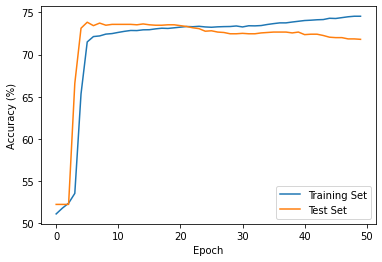

Threshold 0.5, Model 42
Training with Seed 42


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.05it/s]


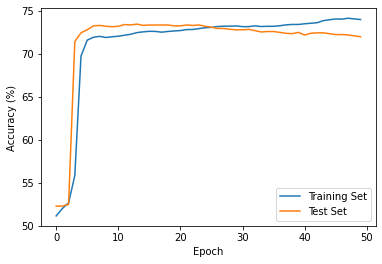

Threshold 0.5, Model 43
Training with Seed 43


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.91it/s]


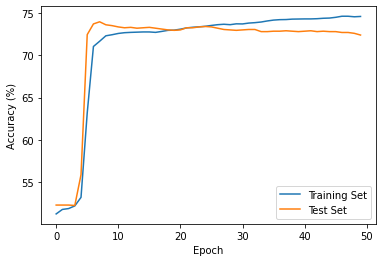

Threshold 0.5, Model 44
Training with Seed 44


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.75it/s]


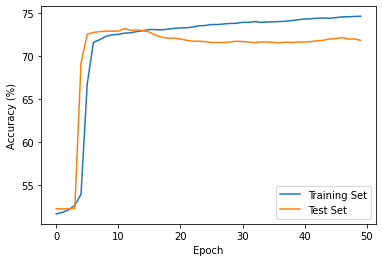

Threshold 0.5, Model 45
Training with Seed 45


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.76it/s]


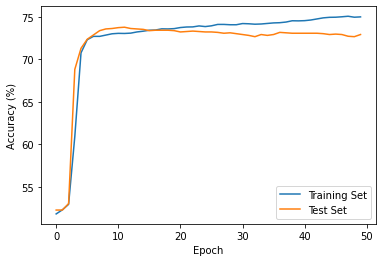

Threshold 0.5, Model 46
Training with Seed 46


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.80it/s]


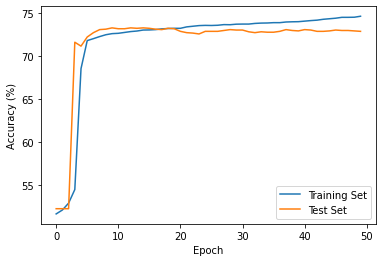

Threshold 0.5, Model 47
Training with Seed 47


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.79it/s]


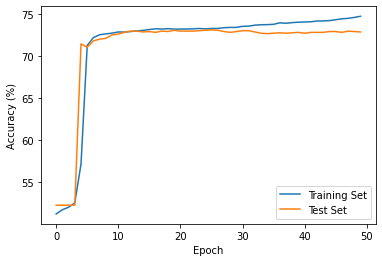

Threshold 0.5, Model 48
Training with Seed 48


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.95it/s]


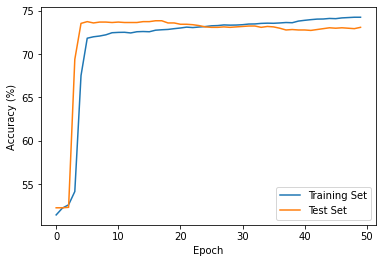

Threshold 0.5, Model 49
Training with Seed 49


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.00it/s]


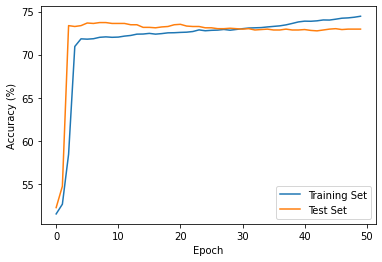

Threshold 0.5, Model 50
Training with Seed 50


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.98it/s]


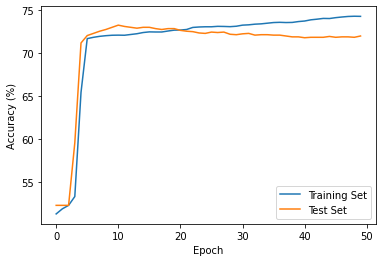

Threshold 0.5, Model 51
Training with Seed 51


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.95it/s]


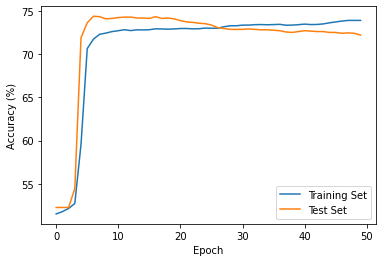

Threshold 0.5, Model 52
Training with Seed 52


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.02it/s]


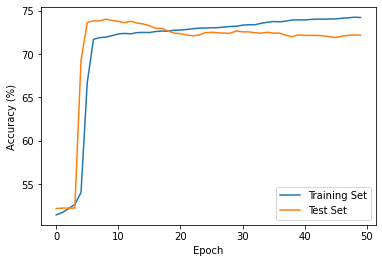

Threshold 0.5, Model 53
Training with Seed 53


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.08it/s]


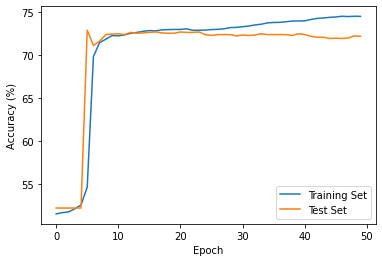

Threshold 0.5, Model 54
Training with Seed 54


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.95it/s]


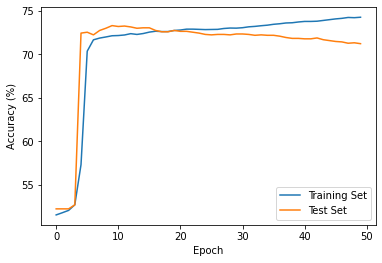

Threshold 0.5, Model 55
Training with Seed 55


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.05it/s]


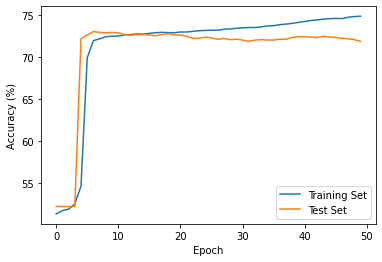

Threshold 0.5, Model 56
Training with Seed 56


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.96it/s]


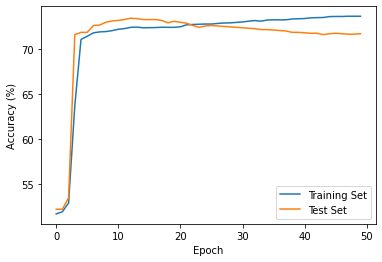

Threshold 0.5, Model 57
Training with Seed 57


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.04it/s]


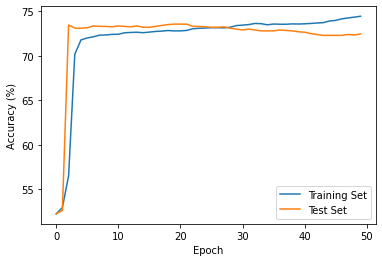

Threshold 0.5, Model 58
Training with Seed 58


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.76it/s]


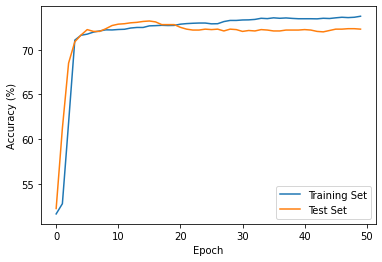

Threshold 0.5, Model 59
Training with Seed 59


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.82it/s]


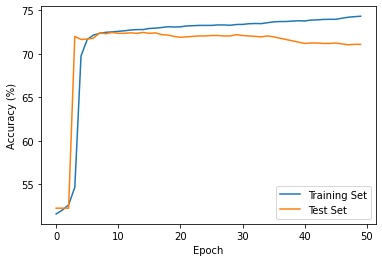

Threshold 0.5, Model 60
Training with Seed 60


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.95it/s]


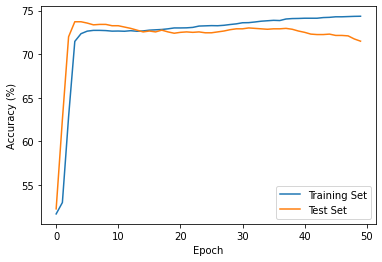

Threshold 0.5, Model 61
Training with Seed 61


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.72it/s]


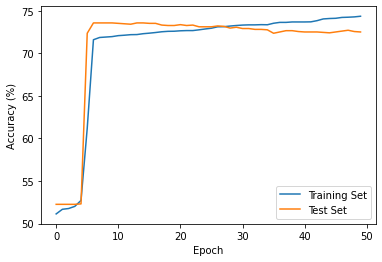

Threshold 0.5, Model 62
Training with Seed 62


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.05it/s]


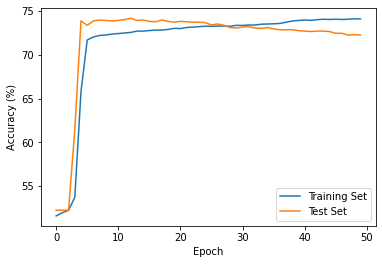

Threshold 0.5, Model 63
Training with Seed 63


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.91it/s]


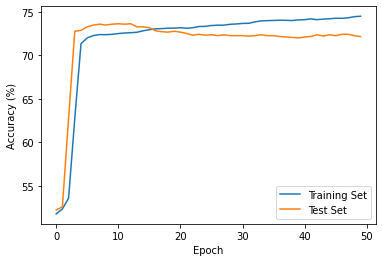

Threshold 0.5, Model 64
Training with Seed 64


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.02it/s]


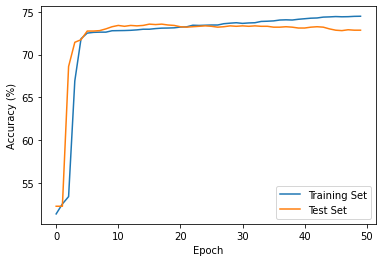

Threshold 0.5, Model 65
Training with Seed 65


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.04it/s]


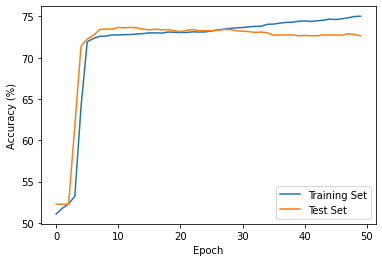

Threshold 0.5, Model 66
Training with Seed 66


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.01it/s]


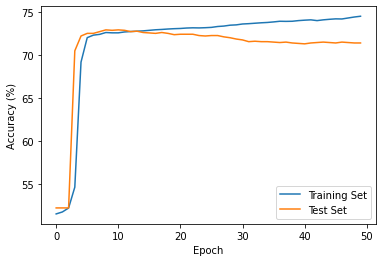

Threshold 0.5, Model 67
Training with Seed 67


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.00it/s]


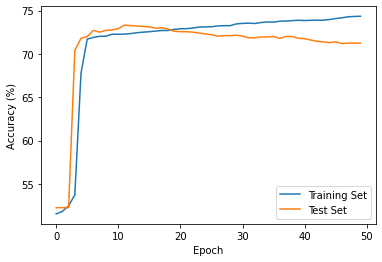

Threshold 0.5, Model 68
Training with Seed 68


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.99it/s]


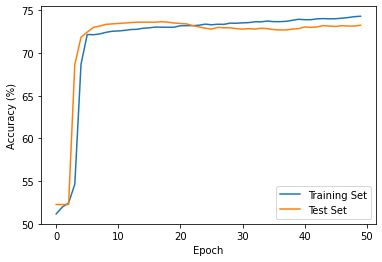

Threshold 0.5, Model 69
Training with Seed 69


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.99it/s]


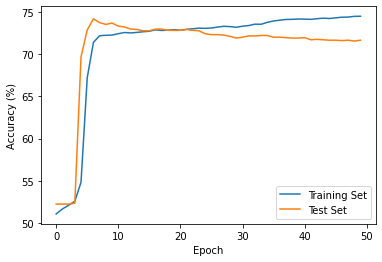

Threshold 0.5, Model 70
Training with Seed 70


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.07it/s]


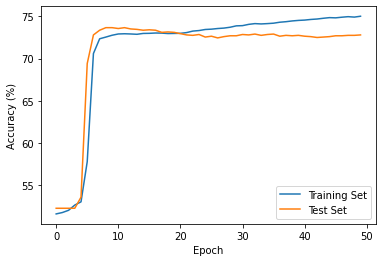

Threshold 0.5, Model 71
Training with Seed 71


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.06it/s]


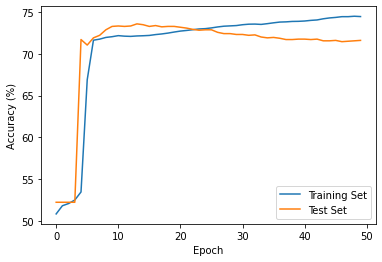

Threshold 0.5, Model 72
Training with Seed 72


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.07it/s]


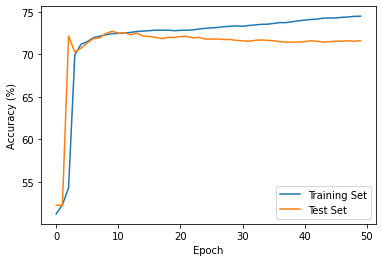

Threshold 0.5, Model 73
Training with Seed 73


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.07it/s]


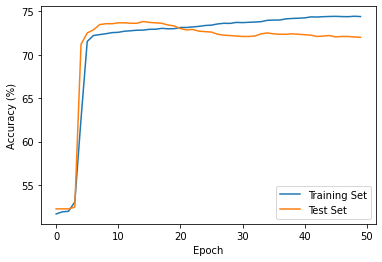

Threshold 0.5, Model 74
Training with Seed 74


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.06it/s]


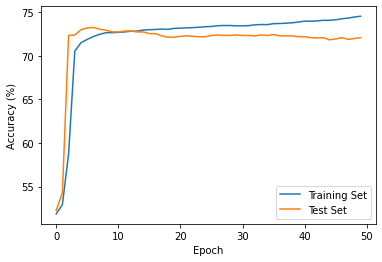

Threshold 0.5, Model 75
Training with Seed 75


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.04it/s]


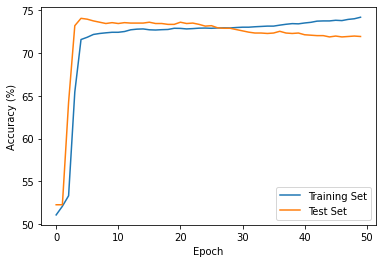

Threshold 0.5, Model 76
Training with Seed 76


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.98it/s]


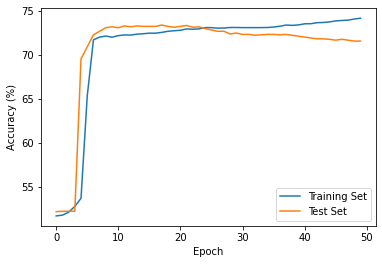

Threshold 0.5, Model 77
Training with Seed 77


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.88it/s]


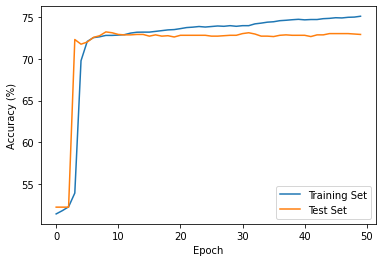

Threshold 0.5, Model 78
Training with Seed 78


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.02it/s]


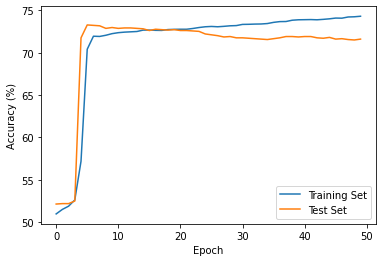

Threshold 0.5, Model 79
Training with Seed 79


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.83it/s]


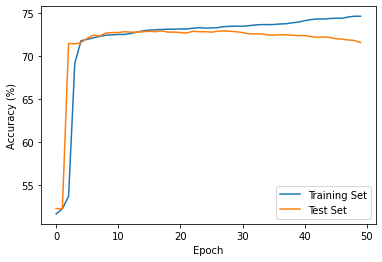

Threshold 0.5, Model 80
Training with Seed 80


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.00it/s]


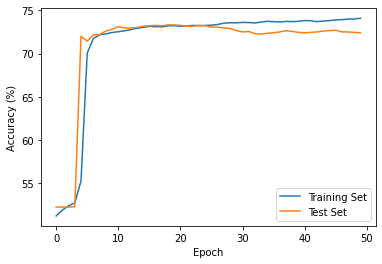

Threshold 0.5, Model 81
Training with Seed 81


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.01it/s]


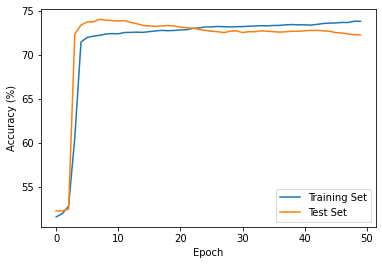

Threshold 0.5, Model 82
Training with Seed 82


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.07it/s]


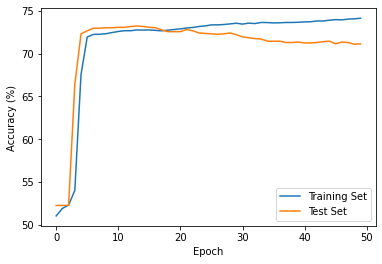

Threshold 0.5, Model 83
Training with Seed 83


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.98it/s]


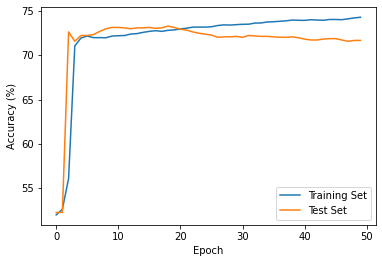

Threshold 0.5, Model 84
Training with Seed 84


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.00it/s]


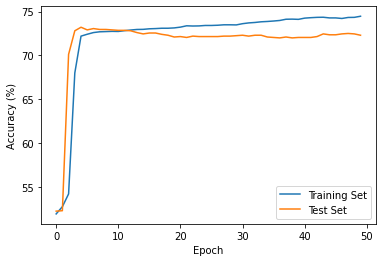

Threshold 0.5, Model 85
Training with Seed 85


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.04it/s]


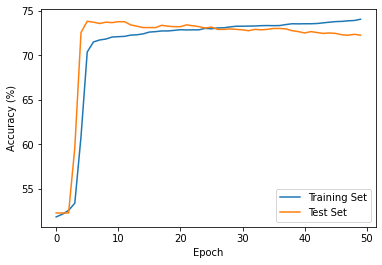

Threshold 0.5, Model 86
Training with Seed 86


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.02it/s]


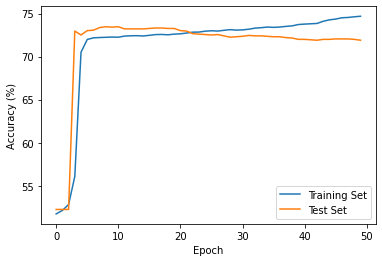

Threshold 0.5, Model 87
Training with Seed 87


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.04it/s]


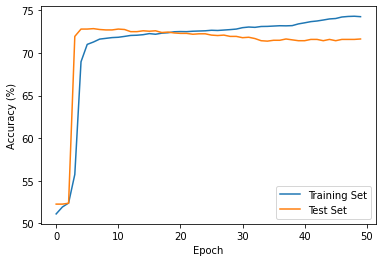

Threshold 0.5, Model 88
Training with Seed 88


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.70it/s]


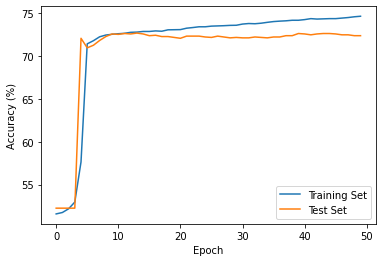

Threshold 0.5, Model 89
Training with Seed 89


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.86it/s]


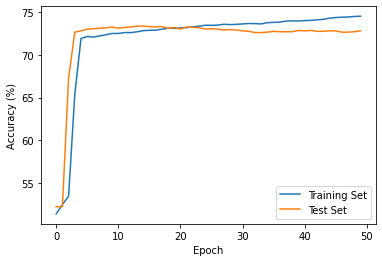

Threshold 0.5, Model 90
Training with Seed 90


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.91it/s]


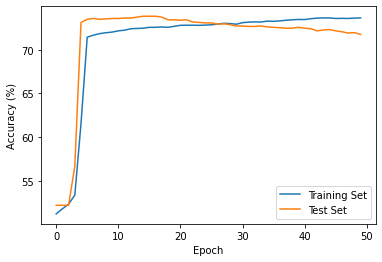

Threshold 0.5, Model 91
Training with Seed 91


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.07it/s]


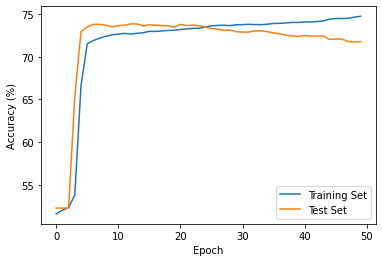

Threshold 0.5, Model 92
Training with Seed 92


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.05it/s]


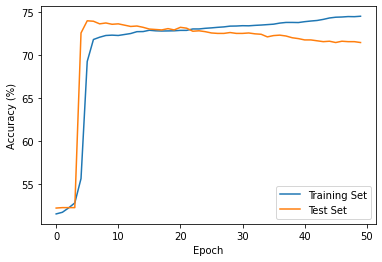

Threshold 0.5, Model 93
Training with Seed 93


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  4.06it/s]


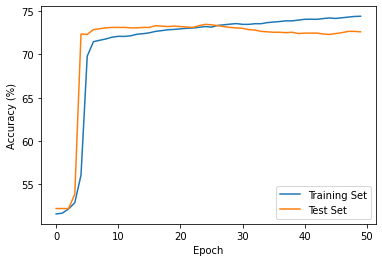

Threshold 0.5, Model 94
Training with Seed 94


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.91it/s]


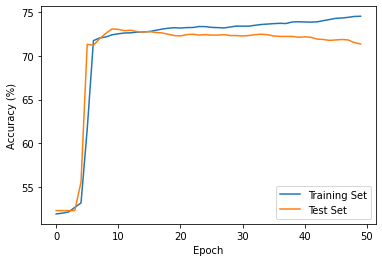

Threshold 0.5, Model 95
Training with Seed 95


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.96it/s]


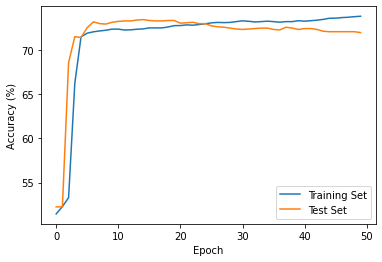

Threshold 0.5, Model 96
Training with Seed 96


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.96it/s]


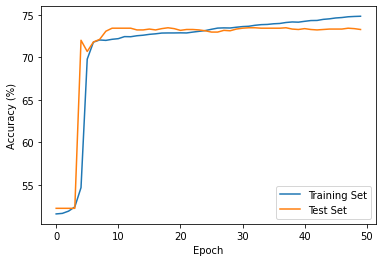

Threshold 0.5, Model 97
Training with Seed 97


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.94it/s]


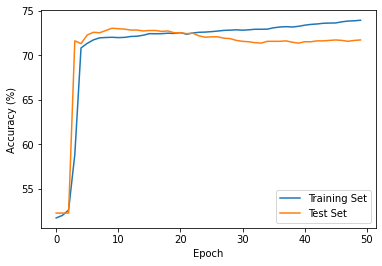

Threshold 0.5, Model 98
Training with Seed 98


100%|███████████████████████████████████████████| 50/50 [00:12<00:00,  3.87it/s]


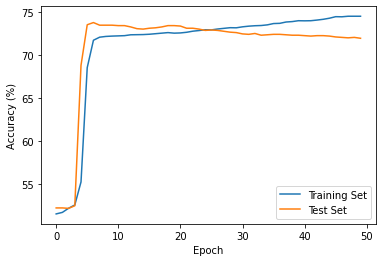

Threshold 0.5, Model 99
Training with Seed 99


100%|███████████████████████████████████████████| 50/50 [00:13<00:00,  3.70it/s]


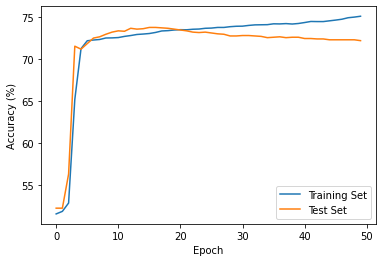

In [180]:
for threshold in thresholds:
    test_accuracy, train_accuracy = np.zeros((n_e, n_r)), np.zeros((n_e, n_r))
    preds = np.zeros((n_e, n_r, n))
    logits = np.zeros((n_e, n_r, n, 2))
    gradients = np.zeros((n_e, n_r, n, d))
    args.threshold = threshold
    perturb_params = datasets.PerturbParams(args.strategy, args.threshold,
                                            args.target_indices, args.target_vals,
                                            args.indices_to_change, args.new_vals)
    for i, r in enumerate(random_states):
        if args.fixed_seed:
            seed = 0
        else:
            seed = r
        scaler, scaler_labels = None, None

        # Perturbs data with seed r
        train, test = datasets.load_data(args.file_base, args.dataset, scaler,
                                         scaler_labels, r, perturb_params, noisy_test=noisy_test)

        test_dataloader = DataLoader(test, batch_size=params.batch_size, shuffle=False)
        
        num_feat, num_classes = train.num_features(), train.num_classes()
        params = training.Params(args.lr, args.lr_decay, args.epochs, args.batch_size, loss_fn=args.loss, num_feat=num_feat, 
                        num_classes=num_classes, activation=args.activation, nodes_per_layer=args.nodes_per_layer,
                        num_layers=args.num_layers, optimizer=args.optimizer, seed=seed, epsilon = args.epsilon, dropout=args.dropout)
        
        print("Threshold {}, Model {}".format(threshold, i))
        secondary_dataset = None
        model, test_acc, train_acc, pred, log, grad\
        = training.train_nn(params, train, test, r, args.dataset,
                            args.output_dir, args.threshold, secondary_dataset,
                            plot=True, print_terms=False, checkpoints=epochs)
        preds[:, i], logits[:, i], gradients[:, i] = pred, log, grad
        test_accuracy[:, i], train_accuracy[:, i] = test_acc[np.array(epochs)-1], train_acc[np.array(epochs)-1]
    np.save(args.output_dir + "/accuracy_" + args.dataset + str(args.threshold) + "_nn"
        + str(args.num_layers) + "_"+ act + ".npy", np.array([test_accuracy, train_accuracy]))
    start_str = args.output_dir + "/" + args.dataset + str(args.threshold) + "_nn" + str(args.num_layers) + "_" + act +  "_" 
    np.save(start_str + 'preds.npy', preds)
    np.save(start_str + 'logits.npy', logits)
    np.save(start_str + 'gradients.npy', gradients)

# Original Model's Capacity for Perturbations

### Train Base Models (No Perturbations, Seed 0)

In [19]:
args

Namespace(dataset='heloc', file_base='data/heloc', dataset_shift=False, adversarial=False, output_dir='models/heloc_single_model', label_col='label', linear=False, lr=0.2, lr_decay=0.8, epochs=20, batch_size=128, activation=ReLU(), nodes_per_layer=50, num_layers=5, optimizer=None, loss=CrossEntropyLoss(), fixed_seed=False, target_indices=[], target_vals=[], indices_to_change=[], new_vals=[], threshold=0, strategy='random', epsilon=0.5, dropout=0.0)

In [ ]:
if args.activation is not None:
    if args.activation == 'leak':
        args.activation = nn.LeakyReLU()
    elif args.activation == 'soft':
        args.activation = nn.Softplus(beta=5)
    else:
        args.activation = nn.ReLU()
else:
    args.activation = 

In [21]:
import copy

In [107]:
arguments = []
args.epochs = 100
for act in ['relu', 'soft', 'adv']:
    if act=='relu':
        args.activation = nn.ReLU()
    elif act=='soft':
        args.activation = nn.Softplus(beta=5)
    elif act=='adv':
        args.activation = nn.ReLU()
        args.adversarial = True
        args.epsilon = 0.2
    print(act, args.activation, args.adversarial, args.epsilon)
    arguments.append(copy.deepcopy(args))
    np.save(args.output_dir + "/args_" + args.dataset + "_nn" + str(args.num_layers) + "_"+ act + ".npy", args)

relu ReLU() False 0.2
soft Softplus(beta=5, threshold=20) False 0.2
adv ReLU() True 0.2


In [22]:
test_accuracy, train_accuracy = np.zeros(3), np.zeros(3)
args.threshold = 0
perturb_params = datasets.PerturbParams(args.strategy, args.threshold,
                                        args.target_indices, args.target_vals,
                                        args.indices_to_change, args.new_vals)
seed, r = 0, 0
scaler, scaler_labels = None, None
train, test = datasets.load_data(args.file_base, args.dataset, scaler,
                                 scaler_labels, r, perturb_params, noisy_test=False)
num_feat, num_classes = train.num_features(), train.num_classes()

Training with Seed 0


100%|█████████████████████████████████████████| 100/100 [00:21<00:00,  4.58it/s]


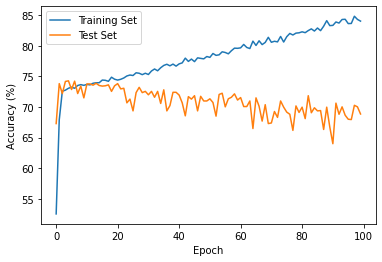

Training with Seed 0


100%|█████████████████████████████████████████| 100/100 [00:22<00:00,  4.45it/s]


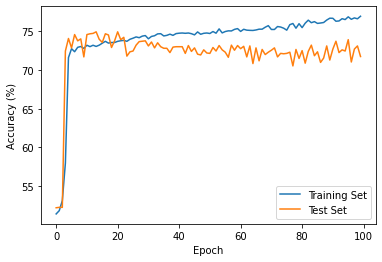

True 0.2
Training with Seed 0


100%|█████████████████████████████████████████| 100/100 [00:33<00:00,  2.98it/s]

Accuracy on adversarial test examples: 73.37892603850051%


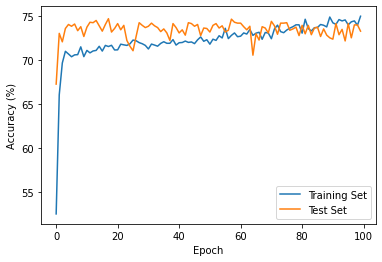

In [108]:
test_accuracy, train_accuracy = np.zeros(3), np.zeros(3)
args.threshold = 0
perturb_params = datasets.PerturbParams(args.strategy, args.threshold,
                                        args.target_indices, args.target_vals,
                                        args.indices_to_change, args.new_vals)
seed, r = 0, 0
scaler, scaler_labels = None, None
train, test = datasets.load_data(args.file_base, args.dataset, scaler,
                                 scaler_labels, r, perturb_params, noisy_test=False)
num_feat, num_classes = train.num_features(), train.num_classes()
models = []
for i in range(3):
    args = arguments[i]
    params = training.Params(args.lr, args.lr_decay, args.epochs, args.batch_size, loss_fn=args.loss, num_feat=num_feat, 
                    num_classes=num_classes, activation=args.activation, nodes_per_layer=args.nodes_per_layer,
                    num_layers=args.num_layers, optimizer=args.optimizer, seed=seed, epsilon = args.epsilon, dropout=args.dropout)

    secondary_dataset = None
    if i!=2:
        model, test_acc, train_acc, pred, log, grad\
        = training.train_nn(params, train, test, r, args.dataset,
                            args.output_dir, args.threshold, secondary_dataset,
                            plot=True, print_terms=False)
    else:
        print(args.adversarial, args.epsilon)
        model, test_acc, train_acc, pred, log, grad =\
            training.train_adv_nn(params, train, test, r, args.dataset,
                                  args.threshold, plot=True, print_terms=False)
    models.append(model)
    test_accuracy[i], train_accuracy[i] = test_acc, train_acc

### Test Against Perturbations

In [38]:
thresholds = [0, 0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5]

In [69]:
train_accs = np.zeros((len(models), len(thresholds)))
test_accs = np.zeros((len(models), len(thresholds)))
for i, model in enumerate(models):
    for j, threshold in enumerate(thresholds):
        perturb_params = datasets.PerturbParams(args.strategy, threshold,
                                                args.target_indices, args.target_vals,
                                                args.indices_to_change, args.new_vals)
        train, test = datasets.load_data(args.file_base, args.dataset, scaler,
                                         scaler_labels, r, perturb_params, noisy_test=True)
        preds_tr = np.array(model(torch.tensor(train.data).float()).argmax(axis=1))
        preds_te = np.array(model(torch.tensor(test.data).float()).argmax(axis=1))
        train_accs[i, j] = (preds_tr==train.labels.to_numpy().flatten()).mean()
        test_accs[i, j] = (preds_te==test.labels.to_numpy().flatten()).mean()

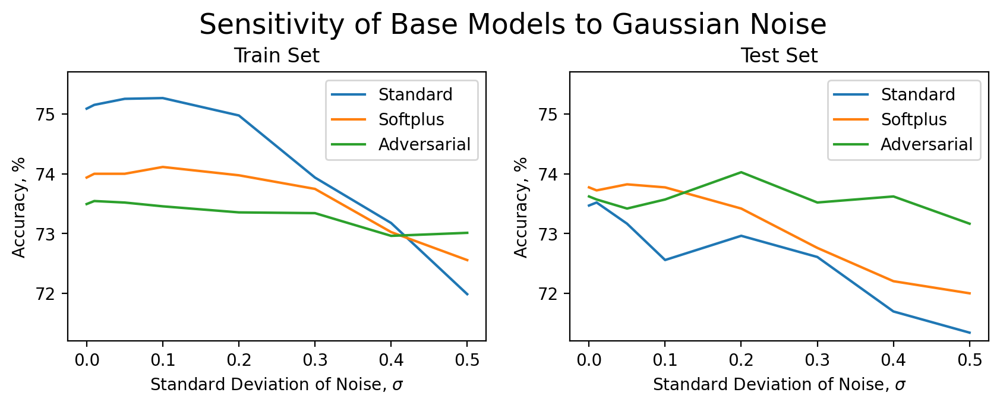

In [103]:
fig, ax = plt.subplots(nrows=1, ncols=2, dpi=200)
fig.set_figwidth(10)
fig.set_figheight(3)
for i, model in enumerate(['Standard', 'Softplus', 'Adversarial']):
    ax[0].plot(thresholds, train_accs[i]*100, label=model)
    ax[1].plot(thresholds, test_accs[i]*100, label=model)
titles = ['Train Set', 'Test Set']
for i in range(2):
    ax[i].legend()
    ax[i].set_title(titles[i])
    ax[i].set_xlabel('Standard Deviation of Noise, $\sigma$')
    ax[i].set_ylabel('Accuracy, %')
    ax[i].set_ylim([71.2, 75.7])
plt.legend()
plt.suptitle('Sensitivity of Base Models to Gaussian Noise', y=1.05, fontsize=17)
plt.show()